<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Bonds/USTBOND/USTBOND_1D_High.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import clear_output
import pandas as pd

if pd.__version__ != '0.25.0' or False:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git pandas==0.25.0
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  print('RESTARTING')
  %cd /content
  
  # force restart
  import os
  os.kill(os.getpid(), 9)

In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "^TNX"
data_resample = '1D'
data_label = 'High'
data_label_name = 'y'
start_date = '1 Jan 2009'
finish_date = '1 Jan 2019'
is_duka = False
is_yahoo = True
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe'] # True for all , ['All','Fwe','RFE','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
is_EDA = True
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [4]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2009-01-02,2.203,2.417,2.159,2.416,2.416,0
2009-01-05,2.485,2.520,2.409,2.488,2.488,0
2009-01-06,2.557,2.614,2.467,2.505,2.505,0
2009-01-07,2.474,2.537,2.455,2.494,2.494,0
2009-01-08,2.441,2.494,2.408,2.445,2.445,0
2009-01-09,2.446,2.501,2.348,2.407,2.407,0
2009-01-12,2.423,2.449,2.308,2.309,2.309,0
2009-01-13,2.309,2.346,2.296,2.297,2.297,0
2009-01-14,2.277,2.277,2.163,2.213,2.213,0


,Open,High,Low,Close,Adj Close,Volume
count,2514.000000,2514.000000,2514.000000,2514.000000,2514.000000,2514.0
mean,2.508228,2.536829,2.478412,2.506939,2.506939,0.0
std,0.599762,0.603096,0.595694,0.598909,0.598909,0.0
min,1.336000,1.395000,1.336000,1.366000,1.366000,0.0
25%,2.028000,2.052000,1.995000,2.021250,2.021250,0.0
50%,2.436000,2.466500,2.405000,2.429000,2.429000,0.0
75%,2.912500,2.947000,2.884000,2.914750,2.914750,0.0
max,4.000000,4.014000,3.947000,3.994000,3.994000,0.0


7

In [5]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,7
Number of observations,2514
Total Missing (%),0.0%
Total size in memory,137.6 KiB
Average record size in memory,56.1 B
Numeric,1
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,5


In [6]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import uuid
import os


features_dataset = pd.read_pickle('full_dataset').sort_index()


periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
timeperiods = [8, 12, 14, 20, 24, 30]
matypes = range(9)
nbdevs = [2, 3, 4, 5]

# date features
features_dataset['day'] = features_dataset.index.day
features_dataset['dayofweek'] = features_dataset.index.dayofweek
features_dataset['dayofyear'] = features_dataset.index.dayofyear
features_dataset['days_in_month'] = features_dataset.index.days_in_month
features_dataset['hour'] = features_dataset.index.hour
features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
features_dataset['minute'] = features_dataset.index.minute
features_dataset['month'] = features_dataset.index.month
features_dataset['quarter'] = features_dataset.index.quarter
features_dataset['second'] = features_dataset.index.second
features_dataset['week'] = features_dataset.index.week
features_dataset['weekday'] = features_dataset.index.weekday
features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
features_dataset['weekofyear'] = features_dataset.index.weekofyear

# Overlap Studies
features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                    offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                    accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                    accelerationshort=-4e37, accelerationmaxshort=-4e37)

for timeperiod in timeperiods:
    features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                           acceleration=timeperiod / 100,
                                                           maximum=timeperiod / 100)
    features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

    for matype in matypes:
        features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                           timeperiod=timeperiod, matype=matype)
        features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                               minperiod=2,
                                                                               maxperiod=timeperiod, matype=matype)
        features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                           timeperiod=timeperiod,
                                                                           vfactor=matype / 10)

        for nbdev in nbdevs:
            features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

            
gc.collect()
# Momentum Indicators
features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                              features_dataset['Close'])

for timeperiod in timeperiods:
    features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
        features_dataset['High'],
        features_dataset['Low'],
        timeperiod=timeperiod)
    features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                   features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
        'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
    features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], features_dataset['Volume'],
                                                     timeperiod=timeperiod)
    features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                               features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                             features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                             timeperiod=timeperiod)
    features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                         features_dataset['Close'], timeperiod=timeperiod)

    
gc.collect()
features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
    features_dataset['Close'], fastperiod=12,
    slowperiod=26,
    signalperiod=9)
features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
    features_dataset['Close'],
    fastperiod=12,
    fastmatype=0,
    slowperiod=26,
    slowmatype=0,
    signalperiod=9,
    signalmatype=0)

features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                         features_dataset['Low'],
                                                                         features_dataset['Close'], fastk_period=5,
                                                                         slowk_period=3, slowk_matype=0,
                                                                         slowd_period=3, slowd_matype=0)
features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                            features_dataset['Low'],
                                                                            features_dataset['Close'], fastk_period=5,
                                                                            fastd_period=3, fastd_matype=0)
features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                  timeperiod=14,
                                                                                  fastk_period=5, fastd_period=3,
                                                                                  fastd_matype=0)
features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    timeperiod1=7, timeperiod2=14, timeperiod3=28)

# Volume Indicators
features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                            features_dataset['Volume'])
features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                  features_dataset['Volume'], fastperiod=3, slowperiod=10)
features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

gc.collect()
# Volatility Indicators
for timeperiod in timeperiods:
    features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)

features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

# Price Transform
features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

gc.collect()
# Cycle Indicators
features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

# Pattern Recognition
features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'],
                                                        penetration=0)
features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                      features_dataset['Close'])
features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'], penetration=0)
features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
gc.collect()

# Statistic Functions
for timeperiod in timeperiods:
    features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                       timeperiod=timeperiod)
    features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                           timeperiod=timeperiod)
    features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                     timeperiod=timeperiod)
    features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
    features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

    
gc.collect()
# Math Transform
features_dataset['ACOS'] = ACOS(features_dataset['Close'])
features_dataset['ASIN'] = ASIN(features_dataset['Close'])
features_dataset['ATAN'] = ATAN(features_dataset['Close'])
features_dataset['CEIL'] = CEIL(features_dataset['Close'])
features_dataset['COS'] = COS(features_dataset['Close'])
features_dataset['COSH'] = COSH(features_dataset['Close'])
features_dataset['EXP'] = EXP(features_dataset['Close'])
features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
features_dataset['LN'] = LN(features_dataset['Close'])
features_dataset['LOG10'] = LOG10(features_dataset['Close'])
features_dataset['SIN'] = SIN(features_dataset['Close'])
features_dataset['SINH'] = SINH(features_dataset['Close'])
features_dataset['SQRT'] = SQRT(features_dataset['Close'])
features_dataset['TAN'] = TAN(features_dataset['Close'])
features_dataset['TANH'] = TANH(features_dataset['Close'])

gc.collect()
# Math Operator
features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

for timeperiod in timeperiods:
    features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
        features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
    
gc.collect()


features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
features_dataset.to_pickle('features_dataset')
display(features_dataset)
display(features_dataset.describe())

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del periods, timeperiods, matypes, nbdevs, features_dataset, talib
gc.collect()

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBAND

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBAND

36

In [7]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [8]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]][:-1]
label_df[data_label_name] = pd.DataFrame(features_dataset[data_label][1:].values / features_dataset[data_label][:-1].values,
                             index=label_df.index).clip(0,1).astype(int)

scaled_df = features_dataset
scaled_df = pd.DataFrame(minmax_scale(scaled_df, axis=0, feature_range=(0, 1)), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale
gc.collect()

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBAND

138878

In [9]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import uuid
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*0.7),int(len(train_hf)*0.9)]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O cluster uptime:,2 hours 50 mins
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,2 months and 5 days
H2O cluster name:,H2O_from_python_unknownUser_pbkgha
H2O cluster total nodes:,1
H2O cluster free memory:,8.95 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"locked, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo,project_name=str(uuid.uuid4()))
      t_hf = (training_frame or train_hf)

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=t_hf[index_splits[0]:index_splits[1],:], leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except KeyboardInterrupt:
      return None
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    start_idx = max(-index_splits[1],-20)
    predicted = aml.leader.predict(t_hf[start_idx:,:])
    predicted = predicted.as_data_frame()[['predict']]
    predict_df = pd.read_pickle('predict_df')[start_idx:]
    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper right')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)
    h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
    gc.collect()

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_170518_mod...,0.661376,0.779449,0.399405,0.532799,0.283875
1,DeepLearning_grid_1_AutoML_20190824_170518_mod...,0.649074,0.768464,0.421726,0.513716,0.263905
2,DeepLearning_grid_1_AutoML_20190824_170518_mod...,0.630126,0.673209,0.437401,0.490238,0.240333
3,DeepLearning_grid_1_AutoML_20190824_170518_mod...,0.629299,2.524593,0.407573,0.627282,0.393482
4,DeepLearning_grid_1_AutoML_20190824_170518_mod...,0.629101,0.668433,0.390377,0.487864,0.238011
5,DeepLearning_1_AutoML_20190824_170518,0.607937,0.688998,0.495536,0.496977,0.246987
6,DeepLearning_grid_1_AutoML_20190824_170518_mod...,0.555886,0.679439,0.470172,0.492949,0.242999
7,DeepLearning_grid_1_AutoML_20190824_170518_mod...,0.548942,0.709942,0.500000,0.508272,0.258340
8,DeepLearning_grid_1_AutoML_20190824_170518_mod...,0.524140,1.222719,0.485847,0.594107,0.352963
9,DeepLearning_grid_1_AutoML_20190824_170518_mod...,0.483796,0.829327,0.500000,0.537943,0.289383


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.004571
1,SUB,0.637115,0.637115,0.002912
2,CDLCLOSINGMARUBOZU,0.609899,0.609899,0.002788
3,DIV,0.580555,0.580555,0.002654
4,dayofweek,0.536099,0.536099,0.002451
5,weekday,0.529339,0.529339,0.002420
6,CDLLONGLINE,0.482067,0.482067,0.002204
7,STOCHF_fastk,0.463459,0.463459,0.002119
8,STOCHRSI_fastk,0.446529,0.446529,0.002041
9,CDLEVENINGSTAR,0.445979,0.445979,0.002039


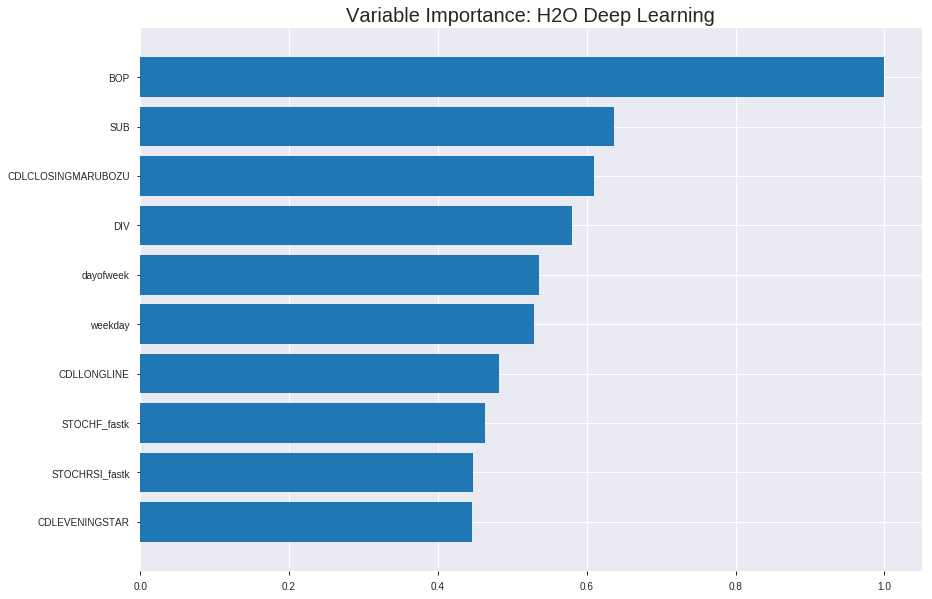

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_170518_model_2


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.23794885700222568
RMSE: 0.48780001742745527
LogLoss: 0.6848186267003394
Mean Per-Class Error: 0.3663444655112703
AUC: 0.6785433704855117
pr_auc: 0.6648984045951762
Gini: 0.35708674097102344
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.1489261759861683: 


,0,1,Error,Rate
0,205.0,688.0,0.7704,(688.0/893.0)
1,70.0,761.0,0.0842,(70.0/831.0)
Total,275.0,1449.0,0.4397,(758.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1489262,0.6675439,338.0
max f2,0.0234580,0.8237281,393.0
max f0point5,0.5161511,0.6244490,174.0
max accuracy,0.5161511,0.6380510,174.0
max precision,0.9692450,1.0,0.0
max recall,0.0079295,1.0,398.0
max specificity,0.9692450,1.0,0.0
max absolute_mcc,0.5161511,0.2762007,174.0
max min_per_class_accuracy,0.3965582,0.6233454,223.0
max mean_per_class_accuracy,0.5161511,0.6336555,174.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 41.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.9291407,2.0746089,2.0746089,1.0,0.9431900,1.0,0.9431900,0.0216606,0.0216606,107.4608905,107.4608905
,2,0.0203016,0.8985159,1.9525731,2.0153344,0.9411765,0.9106491,0.9714286,0.9273844,0.0192539,0.0409146,95.2573087,101.5334365
,3,0.0301624,0.8808080,1.7085015,1.9150236,0.8235294,0.8899077,0.9230769,0.9151324,0.0168472,0.0577617,70.8501451,91.5023605
,4,0.0400232,0.8580086,1.5864656,1.8340745,0.7647059,0.8709040,0.8840580,0.9042356,0.0156438,0.0734055,58.6465633,83.4074539
,5,0.0504640,0.8321557,1.4983287,1.7646099,0.7222222,0.8427823,0.8505747,0.8915211,0.0156438,0.0890493,49.8328654,76.4609873
,6,0.1003480,0.7668676,1.3509081,1.5589547,0.6511628,0.7971463,0.7514451,0.8446064,0.0673887,0.1564380,35.0908124,55.8954668
,7,0.1502320,0.7185839,1.4474016,1.5219139,0.6976744,0.7455670,0.7335907,0.8117207,0.0722022,0.2286402,44.7401562,52.1913868
,8,0.2001160,0.6736459,1.2785380,1.4612463,0.6162791,0.6983259,0.7043478,0.7834542,0.0637786,0.2924188,27.8538046,46.1246272
,9,0.2998840,0.5773778,1.2423530,1.3884230,0.5988372,0.6239684,0.6692456,0.7303951,0.1239471,0.4163658,24.2353007,38.8422981
,10,0.4002320,0.4931737,1.1512281,1.3289524,0.5549133,0.5348497,0.6405797,0.6813670,0.1155235,0.5318893,15.1228063,32.8952371




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.21929810344055325
RMSE: 0.4682927539910833
LogLoss: 0.6372593470839352
Mean Per-Class Error: 0.32575093815608924
AUC: 0.716420624555719
pr_auc: 0.6617373573608281
Gini: 0.43284124911143795
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41203225855359865: 


,0,1,Error,Rate
0,107.0,144.0,0.5737,(144.0/251.0)
1,31.0,210.0,0.1286,(31.0/241.0)
Total,138.0,354.0,0.3557,(175.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4120323,0.7058824,281.0
max f2,0.2499362,0.8381295,343.0
max f0point5,0.5815422,0.6695279,182.0
max accuracy,0.5815422,0.6747967,182.0
max precision,0.9668194,1.0,0.0
max recall,0.0559615,1.0,398.0
max specificity,0.9668194,1.0,0.0
max absolute_mcc,0.5815422,0.3490757,182.0
max min_per_class_accuracy,0.5613487,0.6653386,193.0
max mean_per_class_accuracy,0.5815422,0.6742491,182.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 54.15 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.9300640,1.6331950,1.6331950,0.8,0.9468945,0.8,0.9468945,0.0165975,0.0165975,63.3195021,63.3195021
,2,0.0203252,0.9109245,1.2248963,1.4290456,0.6,0.9270184,0.7,0.9369564,0.0124481,0.0290456,22.4896266,42.9045643
,3,0.0304878,0.9008010,1.2248963,1.3609959,0.6,0.9061785,0.6666667,0.9266971,0.0124481,0.0414938,22.4896266,36.0995851
,4,0.0406504,0.8904031,1.2248963,1.3269710,0.6,0.8959064,0.65,0.9189995,0.0124481,0.0539419,22.4896266,32.6970954
,5,0.0508130,0.8806788,1.6331950,1.3882158,0.8,0.8853321,0.68,0.9122660,0.0165975,0.0705394,63.3195021,38.8215768
,6,0.1016260,0.8298957,1.3882158,1.3882158,0.68,0.8552435,0.68,0.8837548,0.0705394,0.1410788,38.8215768,38.8215768
,7,0.1504065,0.7847232,1.6161826,1.4621509,0.7916667,0.8099612,0.7162162,0.8598217,0.0788382,0.2199170,61.6182573,46.2150948
,8,0.2012195,0.7472169,1.5515353,1.4847227,0.76,0.7639738,0.7272727,0.8356177,0.0788382,0.2987552,55.1535270,48.4722746
,9,0.3008130,0.6935118,1.4998730,1.4897387,0.7346939,0.7217837,0.7297297,0.7979294,0.1493776,0.4481328,49.9872978,48.9738701
,10,0.4004065,0.6268695,0.9582522,1.3575415,0.4693878,0.6627795,0.6649746,0.7643134,0.0954357,0.5435685,-4.1747819,35.7541546



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 17:06:46,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 17:06:48,1 min 28.162 sec,435 obs/sec,0.5087007,1,877.0,0.6618856,8.2635957,-0.7546397,0.5445651,0.2997618,0.9805365,0.5179814,0.6122953,4.1742952,-0.5002417,0.6064208,0.5912746,1.6331950,0.5101626
,2019-08-24 17:07:02,1 min 42.365 sec,417 obs/sec,3.5968677,7,6201.0,0.5353609,0.8732451,-0.1479300,0.6020593,0.5737870,1.3830726,0.5034803,0.5713605,1.0701013,-0.3063510,0.6153973,0.6103192,1.6331950,0.4959350
,2019-08-24 17:07:16,1 min 56.012 sec,427 obs/sec,6.7198376,13,11585.0,0.4882437,0.6937526,0.0452374,0.6840010,0.6478791,1.8440968,0.4008121,0.5170005,0.8066879,-0.0696001,0.6644129,0.6167465,1.6331950,0.3719512
,2019-08-24 17:07:31,2 min 10.895 sec,436 obs/sec,10.2894432,20,17739.0,0.4878000,0.6848186,0.0469720,0.6785434,0.6648984,2.0746089,0.4396752,0.4682928,0.6372593,0.1224451,0.7164206,0.6617374,1.6331950,0.3556911
,2019-08-24 17:07:46,2 min 25.827 sec,442 obs/sec,13.8863109,27,23940.0,0.4939857,0.7411159,0.0226485,0.6836971,0.6614534,1.7288408,0.4605568,0.5274068,0.8843963,-0.1130917,0.6528079,0.6204862,0.8165975,0.4817073
,2019-08-24 17:08:00,2 min 39.989 sec,450 obs/sec,17.4895592,34,30152.0,0.4903421,0.6928350,0.0370132,0.6812189,0.6518633,1.7288408,0.4112529,0.5033550,0.7334066,-0.0138837,0.6536510,0.6150149,1.2248963,0.4715447
,2019-08-24 17:08:15,2 min 55.397 sec,459 obs/sec,21.5719258,42,37190.0,0.4670721,0.6286893,0.1262446,0.7154624,0.6823774,1.7288408,0.3938515,0.4844497,0.6751799,0.0608461,0.6680581,0.6137415,1.2248963,0.4166667
,2019-08-24 17:08:30,3 min 10.442 sec,467 obs/sec,25.6832947,50,44278.0,0.5006661,0.8075797,-0.0039646,0.6979266,0.6371159,1.9593529,0.3625290,0.5315759,1.0320411,-0.1307589,0.6893753,0.6254412,1.6331950,0.3394309
,2019-08-24 17:08:45,3 min 25.387 sec,475 obs/sec,29.8352668,58,51436.0,0.4802595,0.7177210,0.0762086,0.7196958,0.6687213,1.8440968,0.3503480,0.5204579,0.9599767,-0.0839534,0.6771751,0.6082769,1.2248963,0.3414634


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0045714
SUB,0.6371154,0.6371154,0.0029125
CDLCLOSINGMARUBOZU,0.6098986,0.6098986,0.0027881
DIV,0.5805546,0.5805546,0.0026539
dayofweek,0.5360994,0.5360994,0.0024507
---,---,---,---
BBANDS_middleband_12_3_4,0.1764700,0.1764700,0.0008067
BBANDS_middleband_8_7_2,0.1759224,0.1759224,0.0008042
BBANDS_middleband_20_0_2,0.1754845,0.1754845,0.0008022
BBANDS_middleband_12_4_3,0.1754501,0.1754501,0.0008020



See the whole table with table.as_data_frame()


('accuracy', 0.6477732793522267)

('F1', 0.7346938775510204)

('auc', 0.6613756613756614)

('logloss', 0.779448979139069)

('mean_per_class_error', 0.35644841269841265)

('rmse', 0.5327991592595521)

('mse', 0.2838749441076856)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


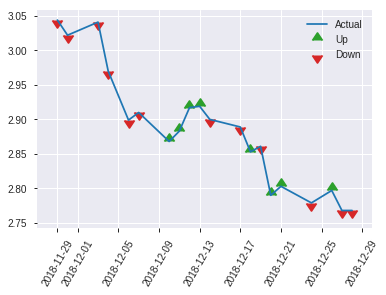


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2838749441076856
RMSE: 0.5327991592595521
LogLoss: 0.779448979139069
Mean Per-Class Error: 0.35644841269841265
AUC: 0.6613756613756614
pr_auc: 0.6583124412254694
Gini: 0.3227513227513228
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.17749987429813627: 


,0,1,Error,Rate
0,30.0,82.0,0.7321,(82.0/112.0)
1,9.0,126.0,0.0667,(9.0/135.0)
Total,39.0,208.0,0.3684,(91.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1774999,0.7346939,207.0
max f2,0.1131021,0.8622909,236.0
max f0point5,0.2750397,0.6768559,137.0
max accuracy,0.2750397,0.6477733,137.0
max precision,0.7991121,1.0,0.0
max recall,0.0160827,1.0,245.0
max specificity,0.7991121,1.0,0.0
max absolute_mcc,0.2750397,0.2878466,137.0
max min_per_class_accuracy,0.2929754,0.6339286,126.0
max mean_per_class_accuracy,0.2750397,0.6435516,137.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 31.62 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7227322,1.2197531,1.2197531,0.6666667,0.7531088,0.6666667,0.7531088,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.6431061,1.8296296,1.4637037,1.0,0.6870470,0.8,0.7266841,0.0148148,0.0296296,82.9629630,46.3703704
,3,0.0323887,0.6228468,1.2197531,1.3722222,0.6666667,0.6354905,0.75,0.6924865,0.0148148,0.0444444,21.9753086,37.2222222
,4,0.0404858,0.5851207,0.9148148,1.2807407,0.5,0.6156566,0.7,0.6771205,0.0074074,0.0518519,-8.5185185,28.0740741
,5,0.0526316,0.5625589,1.2197531,1.2666667,0.6666667,0.5746699,0.6923077,0.6534781,0.0148148,0.0666667,21.9753086,26.6666667
,6,0.1012146,0.5098679,1.2197531,1.2441481,0.6666667,0.5319194,0.68,0.5951299,0.0592593,0.1259259,21.9753086,24.4148148
,7,0.1497976,0.4621259,1.3722222,1.2856857,0.75,0.4821932,0.7027027,0.5585018,0.0666667,0.1925926,37.2222222,28.5685686
,8,0.2024291,0.4356166,1.2666667,1.2807407,0.6923077,0.4485884,0.7,0.5299243,0.0666667,0.2592593,26.6666667,28.0740741
,9,0.2995951,0.3843833,1.2197531,1.2609610,0.6666667,0.4066756,0.6891892,0.4899517,0.1185185,0.3777778,21.9753086,26.0960961
,10,0.4008097,0.3395903,1.3173333,1.2751964,0.72,0.3609973,0.6969697,0.4573875,0.1333333,0.5111111,31.7333333,27.5196409


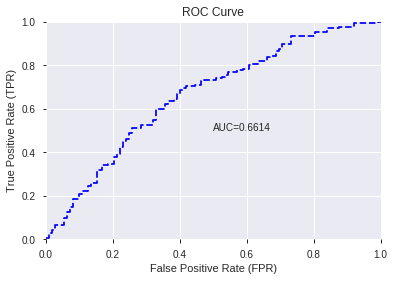

This function is available for GLM models only


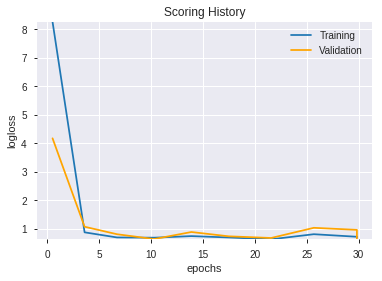

--2019-08-24 17:42:08--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.144.243
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.144.243|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


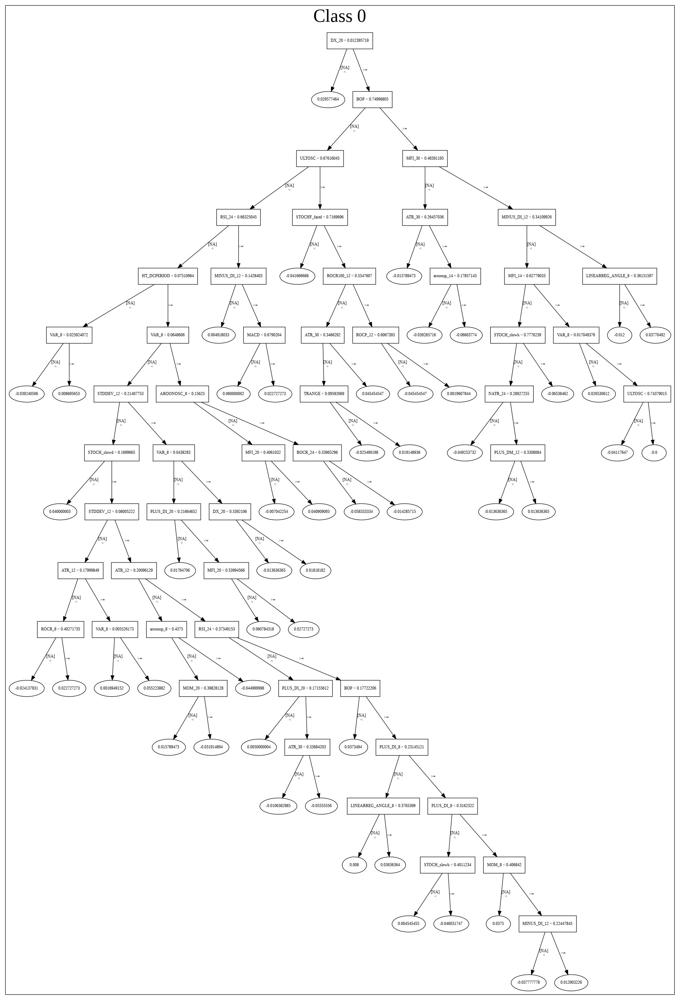

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_170518_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_170518_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

In [11]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_174215_model_9,0.641071,0.651894,0.397123,0.480026,0.230425
1,DeepLearning_grid_1_AutoML_20190824_174215_model_6,0.635317,0.648301,0.420304,0.478392,0.228859
2,DeepLearning_grid_1_AutoML_20190824_174215_model_8,0.598644,0.678213,0.436640,0.492078,0.242141
3,DeepLearning_grid_1_AutoML_20190824_174215_model_5,0.584590,0.713103,0.444147,0.506729,0.256775
4,DeepLearning_1_AutoML_20190824_174215,0.581878,0.746550,0.456779,0.514636,0.264850
5,DeepLearning_grid_1_AutoML_20190824_174215_model_3,0.555556,0.967612,0.464947,0.546275,0.298417
6,DeepLearning_grid_1_AutoML_20190824_174215_model_4,0.553638,0.988641,0.480622,0.560537,0.314202
7,DeepLearning_grid_1_AutoML_20190824_174215_model_7,0.553571,0.979593,0.490311,0.561602,0.315397
8,DeepLearning_grid_1_AutoML_20190824_174215_model_1,0.537897,1.473322,0.500000,0.597787,0.357349
9,DeepLearning_grid_1_AutoML_20190824_174215_model_2,0.480291,1.223460,0.500000,0.581767,0.338453


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.033713
1,CDLCLOSINGMARUBOZU,0.852533,0.852533,0.028742
2,SUB,0.719588,0.719588,0.024260
3,DIV,0.697070,0.697070,0.023501
4,dayofweek,0.663989,0.663989,0.022385
5,CDLLONGLINE,0.652550,0.652550,0.022000
6,MINUS_DI_8,0.638606,0.638606,0.021530
7,STOCHRSI_fastk,0.637033,0.637033,0.021477
8,CDLENGULFING,0.609751,0.609751,0.020557
9,weekday_name,0.602249,0.602249,0.020304


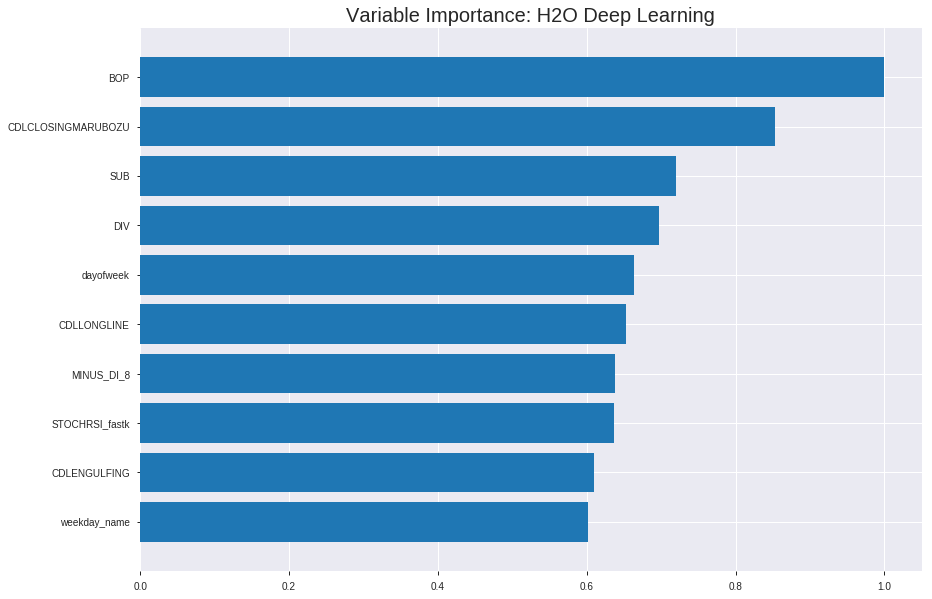

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_174215_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.20943112456115237
RMSE: 0.4576364545806555
LogLoss: 0.6062311319520962
Mean Per-Class Error: 0.3223978988873213
AUC: 0.7307390143690126
pr_auc: 0.6906013392303816
Gini: 0.4614780287380251
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3685524675401259: 


,0,1,Error,Rate
0,359.0,534.0,0.598,(534.0/893.0)
1,79.0,752.0,0.0951,(79.0/831.0)
Total,438.0,1286.0,0.3556,(613.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3685525,0.7104393,260.0
max f2,0.2806589,0.8366534,303.0
max f0point5,0.5080699,0.6574134,182.0
max accuracy,0.5016427,0.6740139,186.0
max precision,0.8138097,1.0,0.0
max recall,0.0882402,1.0,395.0
max specificity,0.8138097,1.0,0.0
max absolute_mcc,0.4868549,0.3613329,196.0
max min_per_class_accuracy,0.5405789,0.6630566,161.0
max mean_per_class_accuracy,0.4868549,0.6776021,196.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 49.85 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.7817738,1.9593529,1.9593529,0.9444444,0.7921649,0.9444444,0.7921649,0.0204573,0.0204573,95.9352855,95.9352855
,2,0.0203016,0.7629908,1.4644298,1.7189617,0.7058824,0.7725336,0.8285714,0.7826297,0.0144404,0.0348977,46.4429815,71.8961664
,3,0.0301624,0.7519856,1.7085015,1.7155420,0.8235294,0.7557495,0.8269231,0.7738419,0.0168472,0.0517449,70.8501451,71.5541979
,4,0.0400232,0.7443907,1.4644298,1.6536738,0.7058824,0.7479720,0.7971014,0.7674682,0.0144404,0.0661853,46.4429815,65.3673765
,5,0.0504640,0.7355632,1.9593529,1.7169177,0.9444444,0.7398078,0.8275862,0.7617453,0.0204573,0.0866426,95.9352855,71.6917714
,6,0.1003480,0.7016198,1.5680184,1.6428984,0.7558140,0.7188304,0.7919075,0.7404119,0.0782190,0.1648616,56.8018358,64.2898381
,7,0.1502320,0.6811989,1.4474016,1.5779844,0.6976744,0.6907249,0.7606178,0.7239135,0.0722022,0.2370638,44.7401562,57.7984379
,8,0.2001160,0.6632088,1.3026614,1.5093531,0.6279070,0.6724387,0.7275362,0.7110821,0.0649819,0.3020457,30.2661405,50.9353145
,9,0.2998840,0.6269708,1.2664764,1.4285508,0.6104651,0.6452890,0.6885880,0.6891935,0.1263538,0.4283995,26.6476366,42.8550813
,10,0.4002320,0.5865025,1.2951316,1.3950993,0.6242775,0.6061807,0.6724638,0.6683801,0.1299639,0.5583634,29.5131571,39.5099322




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.2126856951545525
RMSE: 0.4611785935562843
LogLoss: 0.6139835198923981
Mean Per-Class Error: 0.30135061414094655
AUC: 0.7345720851035692
pr_auc: 0.6822370932114006
Gini: 0.4691441702071384
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37116695495841645: 


,0,1,Error,Rate
0,80.0,171.0,0.6813,(171.0/251.0)
1,19.0,222.0,0.0788,(19.0/241.0)
Total,99.0,393.0,0.3862,(190.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3711670,0.7003155,306.0
max f2,0.2334466,0.8415842,358.0
max f0point5,0.6169070,0.6954315,137.0
max accuracy,0.5754335,0.6991870,170.0
max precision,0.7383507,0.8095238,17.0
max recall,0.1698301,1.0,387.0
max specificity,0.8201503,0.9960159,0.0
max absolute_mcc,0.5754335,0.3979572,170.0
max min_per_class_accuracy,0.5659245,0.6852590,179.0
max mean_per_class_accuracy,0.5754335,0.6986494,170.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 52.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.7803723,0.4082988,0.4082988,0.2,0.7951173,0.2,0.7951173,0.0041494,0.0041494,-59.1701245,-59.1701245
,2,0.0203252,0.7667330,2.0414938,1.2248963,1.0,0.7730514,0.6,0.7840843,0.0207469,0.0248963,104.1493776,22.4896266
,3,0.0304878,0.7546425,2.0414938,1.4970954,1.0,0.7627255,0.7333333,0.7769647,0.0207469,0.0456432,104.1493776,49.7095436
,4,0.0406504,0.7400522,2.0414938,1.6331950,1.0,0.7463039,0.8,0.7692995,0.0207469,0.0663900,104.1493776,63.3195021
,5,0.0508130,0.7316469,0.8165975,1.4698755,0.4,0.7356738,0.72,0.7625744,0.0082988,0.0746888,-18.3402490,46.9875519
,6,0.1016260,0.7035612,1.7148548,1.5923651,0.84,0.7152339,0.78,0.7389042,0.0871369,0.1618257,71.4854772,59.2365145
,7,0.1504065,0.6839051,1.4460581,1.5449142,0.7083333,0.6937448,0.7567568,0.7242579,0.0705394,0.2323651,44.6058091,54.4914209
,8,0.2012195,0.6625816,1.4698755,1.5259650,0.72,0.6733873,0.7474747,0.7114118,0.0746888,0.3070539,46.9875519,52.5965045
,9,0.3008130,0.6400756,1.3748836,1.4759448,0.6734694,0.6518593,0.7229730,0.6916951,0.1369295,0.4439834,37.4883563,47.5944824
,10,0.4004065,0.6036238,1.4165467,1.4611707,0.6938776,0.6238467,0.7157360,0.6748191,0.1410788,0.5850622,41.6546702,46.1170672



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 17:50:08,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 17:50:11,2 min 45.936 sec,478 obs/sec,0.7146172,1,1232.0,0.4817040,0.6760883,0.0706430,0.6991489,0.6616126,1.7288408,0.3955916,0.4834027,0.6789454,0.0649012,0.6954423,0.6543792,1.2248963,0.3841463
,2019-08-24 17:50:26,3 min 0.497 sec,806 obs/sec,7.3770302,10,12718.0,0.4576365,0.6062311,0.1611906,0.7307390,0.6906013,1.9593529,0.3555684,0.4611786,0.6139835,0.1489056,0.7345721,0.6822371,0.4082988,0.3861789
,2019-08-24 17:50:40,3 min 14.627 sec,935 obs/sec,15.4721578,21,26674.0,0.4562527,0.6028687,0.1662558,0.7402663,0.7008837,1.9593529,0.3602088,0.4655856,0.6238896,0.1325620,0.7288026,0.6750003,0.8165975,0.3821138
,2019-08-24 17:50:54,3 min 29.409 sec,1028 obs/sec,24.9622970,34,43035.0,0.4535610,0.5975335,0.1760640,0.7484392,0.7090218,1.9593529,0.3549884,0.4700207,0.6329377,0.1159570,0.7185118,0.6689744,1.2248963,0.3678862
,2019-08-24 17:51:10,3 min 44.528 sec,1093 obs/sec,35.2070766,48,60697.0,0.4476510,0.5843464,0.1973963,0.7564976,0.7159164,1.9593529,0.3445476,0.4666269,0.6270474,0.1286774,0.7207023,0.6698620,1.2248963,0.3597561
,2019-08-24 17:51:25,3 min 59.816 sec,1130 obs/sec,45.5017401,62,78445.0,0.4453535,0.5792114,0.2056136,0.7610463,0.7219414,1.8440968,0.3352668,0.4674027,0.6302921,0.1257779,0.7198757,0.6689337,1.2248963,0.3841463
,2019-08-24 17:51:26,4 min 1.258 sec,1130 obs/sec,45.5017401,62,78445.0,0.4576365,0.6062311,0.1611906,0.7307390,0.6906013,1.9593529,0.3555684,0.4611786,0.6139835,0.1489056,0.7345721,0.6822371,0.4082988,0.3861789


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0337135
CDLCLOSINGMARUBOZU,0.8525325,0.8525325,0.0287418
SUB,0.7195882,0.7195882,0.0242598
DIV,0.6970696,0.6970696,0.0235007
dayofweek,0.6639886,0.6639886,0.0223854
---,---,---,---
TRANGE,0.5374160,0.5374160,0.0181182
HT_TRENDMODE,0.5335637,0.5335637,0.0179883
CDLSHOOTINGSTAR,0.5282400,0.5282400,0.0178088
CORREL_24,0.5178167,0.5178167,0.0174574



See the whole table with table.as_data_frame()


('accuracy', 0.631578947368421)

('F1', 0.7299703264094956)

('auc', 0.6410714285714285)

('logloss', 0.651893747033542)

('mean_per_class_error', 0.3899801587301588)

('rmse', 0.48002596909504225)

('mse', 0.23042493100563446)

deeplearning prediction progress: |███████████████████████████████████████| 100%


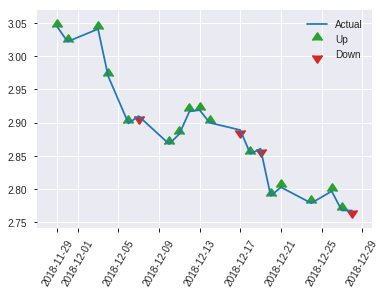


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.23042493100563446
RMSE: 0.48002596909504225
LogLoss: 0.651893747033542
Mean Per-Class Error: 0.3899801587301588
AUC: 0.6410714285714285
pr_auc: 0.65741365675104
Gini: 0.28214285714285703
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40374669466286567: 


,0,1,Error,Rate
0,33.0,79.0,0.7054,(79.0/112.0)
1,12.0,123.0,0.0889,(12.0/135.0)
Total,45.0,202.0,0.3684,(91.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4037467,0.7299703,201.0
max f2,0.2324646,0.8653846,239.0
max f0point5,0.4192684,0.6526429,197.0
max accuracy,0.4192684,0.6315789,197.0
max precision,0.7779681,1.0,0.0
max recall,0.2324646,1.0,239.0
max specificity,0.7779681,1.0,0.0
max absolute_mcc,0.4037467,0.2653641,201.0
max min_per_class_accuracy,0.5909481,0.5851852,120.0
max mean_per_class_accuracy,0.5267378,0.6100198,150.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 54.49 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7691073,1.2197531,1.2197531,0.6666667,0.7748094,0.6666667,0.7748094,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.7605858,1.8296296,1.4637037,1.0,0.7681841,0.8,0.7721593,0.0148148,0.0296296,82.9629630,46.3703704
,3,0.0323887,0.7504483,1.8296296,1.6009259,1.0,0.7565160,0.875,0.7662931,0.0222222,0.0518519,82.9629630,60.0925926
,4,0.0404858,0.7433472,1.8296296,1.6466667,1.0,0.7469164,0.9,0.7624177,0.0148148,0.0666667,82.9629630,64.6666667
,5,0.0526316,0.7405247,0.6098765,1.4074074,0.3333333,0.7426200,0.7692308,0.7578490,0.0074074,0.0740741,-39.0123457,40.7407407
,6,0.1012146,0.7136298,1.0672840,1.2441481,0.5833333,0.7220626,0.68,0.7406715,0.0518519,0.1259259,6.7283951,24.4148148
,7,0.1497976,0.6969580,1.3722222,1.2856857,0.75,0.7051734,0.7027027,0.7291586,0.0666667,0.1925926,37.2222222,28.5685686
,8,0.2024291,0.6761675,0.9851852,1.2075556,0.5384615,0.6861842,0.66,0.7179853,0.0518519,0.2444444,-1.4814815,20.7555556
,9,0.2995951,0.6515317,1.1435185,1.1867868,0.625,0.6639566,0.6486486,0.7004625,0.1111111,0.3555556,14.3518519,18.6786787
,10,0.4008097,0.6149490,1.2441481,1.2012720,0.68,0.6352985,0.6565657,0.6840069,0.1259259,0.4814815,24.4148148,20.1271979


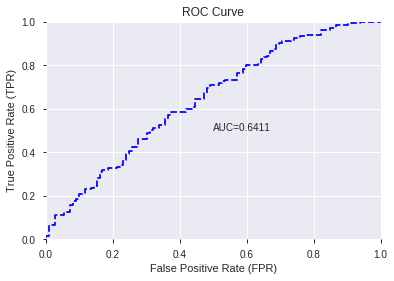

This function is available for GLM models only


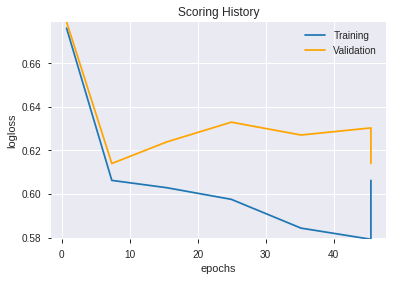

--2019-08-24 17:51:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.146.99
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.146.99|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


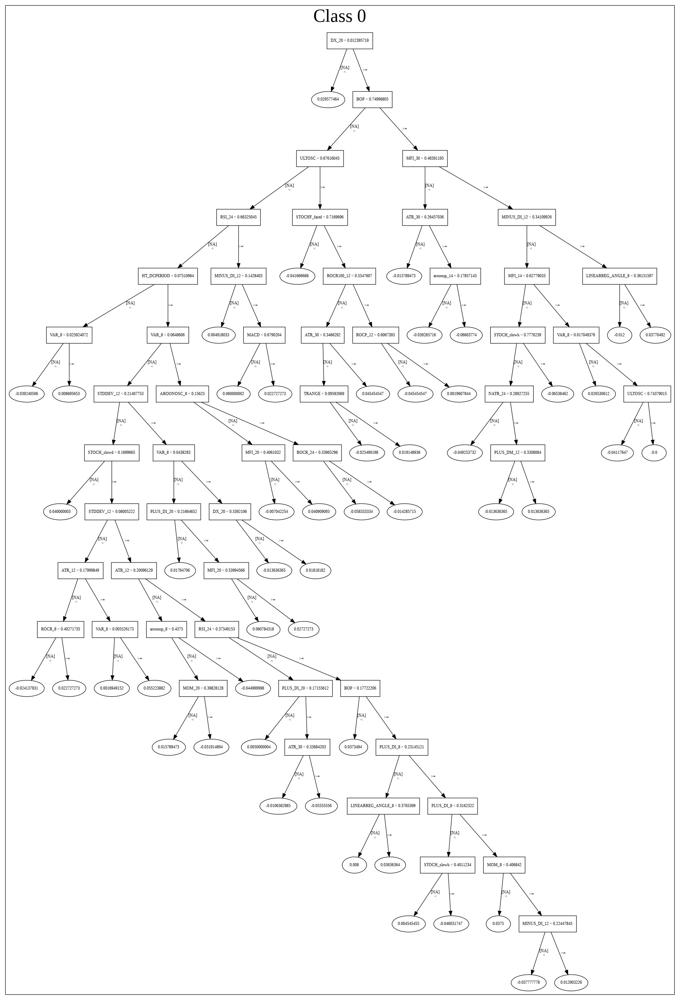

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_174215_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_174215_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_10_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'SUB',
 'DIV',
 'dayofweek',
 'CDLLONGLINE',
 'MINUS_DI_8',
 'STOCHRSI_fastk',
 'CDLENGULFING',
 'weekday_name',
 'CDLEVENINGDOJISTAR',
 'STOCHF_fastk',
 'CDLLONGLEGGEDDOJI',
 'CDLHAMMER',
 'CORREL_14',
 'BETA_30',
 'CDLUPSIDEGAP2CROWS',
 'CDLSTICKSANDWICH',
 'CCI_8',
 'CDLPIERCING',
 'STOCH_slowd',
 'day',
 'CDLDOJI',
 'ADXR_12',
 'DX_8',
 'weekday',
 'aroondown_20',
 'CDLBELTHOLD',
 'aroondown_24',
 'CDL3OUTSIDE',
 'month',
 'DX_30',
 'CORREL_30',
 'CDLEVENINGSTAR',
 'ULTOSC',
 'WILLR_14',
 'weekofyear',
 'CDL3LINESTRIKE',
 'aroondown_8',
 'dayofyear',
 'HT_DCPERIOD',
 'CORREL_8',
 'days_in_month',
 'quarter',
 'SAREXT',
 'TRANGE',
 'HT_TRENDMODE',
 'CDLSHOOTINGSTAR',
 'CORREL_24',
 'week']

In [12]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_175140_model_1,0.625,0.677454,0.447851,0.489685,0.239792


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.320831,1.000000,0.092889
1,MINUS_DI_8,0.208426,0.649643,0.060345
2,CDLCLOSINGMARUBOZU,0.207663,0.647265,0.060124
3,SUB,0.196235,0.611645,0.056815
4,CCI_8,0.192331,0.599477,0.055685
5,CDLENGULFING,0.115868,0.361151,0.033547
6,DIV,0.113981,0.355269,0.033001
7,STOCHF_fastk,0.110477,0.344345,0.031986
8,CDLHAMMER,0.110207,0.343505,0.031908
9,STOCHRSI_fastk,0.107758,0.335871,0.031199


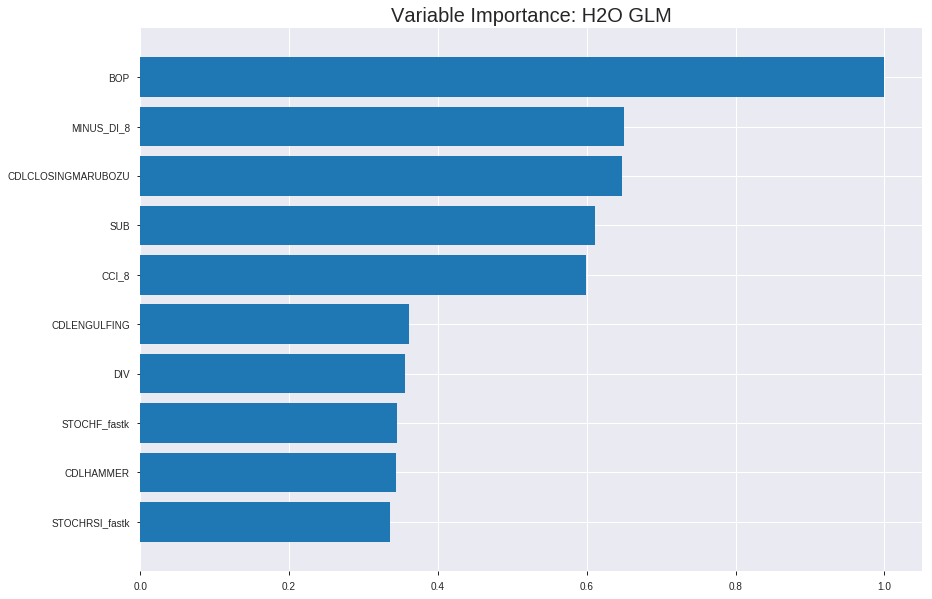

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_175140_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.20838262025290902
RMSE: 0.45648945251003226
LogLoss: 0.6037527689291707
Null degrees of freedom: 1723
Residual degrees of freedom: 1673
Null deviance: 2387.7412993239195
Residual deviance: 2081.739547267781
AIC: 2183.739547267781
AUC: 0.7355396903041843
pr_auc: 0.6989714009316351
Gini: 0.4710793806083686
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3715835548598031: 


,0,1,Error,Rate
0,379.0,514.0,0.5756,(514.0/893.0)
1,87.0,744.0,0.1047,(87.0/831.0)
Total,466.0,1258.0,0.3486,(601.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3715836,0.7123025,269.0
max f2,0.2400311,0.8343609,335.0
max f0point5,0.5525783,0.6625623,155.0
max accuracy,0.4218883,0.6745940,238.0
max precision,0.9512859,1.0,0.0
max recall,0.0555319,1.0,395.0
max specificity,0.9512859,1.0,0.0
max absolute_mcc,0.4073152,0.3736416,246.0
max min_per_class_accuracy,0.4943979,0.6674132,194.0
max mean_per_class_accuracy,0.4218883,0.6797494,238.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 48.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.8383344,1.8440968,1.8440968,0.8888889,0.8728511,0.8888889,0.8728511,0.0192539,0.0192539,84.4096804,84.4096804
,2,0.0203016,0.8136830,1.8305373,1.8375107,0.8823529,0.8238210,0.8857143,0.8490365,0.0180505,0.0373045,83.0537269,83.7510744
,3,0.0301624,0.7963659,1.7085015,1.7953346,0.8235294,0.8041951,0.8653846,0.8343768,0.0168472,0.0541516,70.8501451,79.5334629
,4,0.0400232,0.7777862,1.7085015,1.7739409,0.8235294,0.7865461,0.8550725,0.8225924,0.0168472,0.0709988,70.8501451,77.3940948
,5,0.0504640,0.7680543,1.6135847,1.7407638,0.7777778,0.7733746,0.8390805,0.8124094,0.0168472,0.0878460,61.3584704,74.0763794
,6,0.1003480,0.7012138,1.5921417,1.6668823,0.7674419,0.7316987,0.8034682,0.7722873,0.0794224,0.1672684,59.2141718,66.6882299
,7,0.1502320,0.6649662,1.4232782,1.5859945,0.6860465,0.6812910,0.7644788,0.7420723,0.0709988,0.2382671,42.3278202,58.5994452
,8,0.2001160,0.6398385,1.2785380,1.5093531,0.6162791,0.6516497,0.7275362,0.7195322,0.0637786,0.3020457,27.8538046,50.9353145
,9,0.2998840,0.5891899,1.3870932,1.4686786,0.6686047,0.6132876,0.7079304,0.6841858,0.1383875,0.4404332,38.7093163,46.8678644
,10,0.4002320,0.5419960,1.2591557,1.4161461,0.6069364,0.5639226,0.6826087,0.6540329,0.1263538,0.5667870,25.9155694,41.6146079




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.21232125412507305
RMSE: 0.46078330495480524
LogLoss: 0.6154837997744768
Null degrees of freedom: 491
Residual degrees of freedom: 441
Null deviance: 681.9739872837306
Residual deviance: 605.6360589780851
AIC: 707.6360589780851
AUC: 0.7295713411912516
pr_auc: 0.6886879223422457
Gini: 0.4591426823825031
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.31442073422519834: 


,0,1,Error,Rate
0,70.0,181.0,0.7211,(181.0/251.0)
1,12.0,229.0,0.0498,(12.0/241.0)
Total,82.0,410.0,0.3923,(193.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3144207,0.7035330,325.0
max f2,0.2537942,0.8392603,351.0
max f0point5,0.5874375,0.6889128,135.0
max accuracy,0.5099155,0.6849593,199.0
max precision,0.7367482,0.8095238,38.0
max recall,0.0405878,1.0,398.0
max specificity,0.9025029,0.9960159,0.0
max absolute_mcc,0.5874375,0.3730254,135.0
max min_per_class_accuracy,0.5171733,0.6812749,191.0
max mean_per_class_accuracy,0.5061238,0.6854491,200.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 50.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.8572508,1.2248963,1.2248963,0.6,0.8879080,0.6,0.8879080,0.0124481,0.0124481,22.4896266,22.4896266
,2,0.0203252,0.8197931,1.6331950,1.4290456,0.8,0.8329764,0.7,0.8604422,0.0165975,0.0290456,63.3195021,42.9045643
,3,0.0304878,0.8015165,1.2248963,1.3609959,0.6,0.8096961,0.6666667,0.8435268,0.0124481,0.0414938,22.4896266,36.0995851
,4,0.0406504,0.7868907,1.6331950,1.4290456,0.8,0.7947964,0.7,0.8313442,0.0165975,0.0580913,63.3195021,42.9045643
,5,0.0508130,0.7731415,2.0414938,1.5515353,1.0,0.7805610,0.76,0.8211876,0.0207469,0.0788382,104.1493776,55.1535270
,6,0.1016260,0.7077999,1.6331950,1.5923651,0.8,0.7419342,0.78,0.7815609,0.0829876,0.1618257,63.3195021,59.2365145
,7,0.1504065,0.6831923,1.5311203,1.5725020,0.75,0.6908071,0.7702703,0.7521272,0.0746888,0.2365145,53.1120332,57.2501963
,8,0.2012195,0.6500766,1.4698755,1.5465862,0.72,0.6644443,0.7575758,0.7299851,0.0746888,0.3112033,46.9875519,54.6586194
,9,0.3008130,0.6034431,1.4165467,1.5035326,0.6938776,0.6269112,0.7364865,0.6958592,0.1410788,0.4522822,41.6546702,50.3532578
,10,0.4004065,0.5648624,1.2082310,1.4300819,0.5918367,0.5864831,0.7005076,0.6686540,0.1203320,0.5726141,20.8231010,43.0081934



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 17:51:40,0.000 sec,2,.15E2,51,1.3720094,1.3718894
,2019-08-24 17:51:40,0.011 sec,4,.93E1,51,1.3650811,1.3643854
,2019-08-24 17:51:40,0.024 sec,6,.58E1,51,1.3552023,1.3537808
,2019-08-24 17:51:40,0.035 sec,8,.36E1,51,1.3418959,1.3397186
,2019-08-24 17:51:40,0.048 sec,10,.22E1,51,1.3252363,1.3224782
,2019-08-24 17:51:40,0.059 sec,12,.14E1,51,1.3061431,1.3032652
,2019-08-24 17:51:40,0.070 sec,14,.86E0,51,1.2862241,1.2840012
,2019-08-24 17:51:40,0.081 sec,16,.53E0,51,1.2672246,1.2666245
,2019-08-24 17:51:40,0.092 sec,18,.33E0,51,1.2503649,1.2524932
,2019-08-24 17:51:40,0.103 sec,20,.21E0,51,1.2361107,1.2421175


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6234817813765182)

('F1', 0.7217630853994491)

('auc', 0.625)

('logloss', 0.6774536709587837)

('mean_per_class_error', 0.3912037037037037)

('rmse', 0.4896851737063297)

('mse', 0.2397915693477983)

glm prediction progress: |████████████████████████████████████████████████| 100%


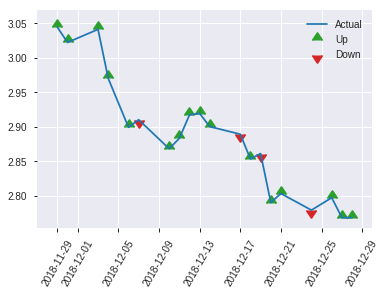


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2397915693477983
RMSE: 0.4896851737063297
LogLoss: 0.6774536709587837
Null degrees of freedom: 246
Residual degrees of freedom: 196
Null deviance: 344.38937217717034
Residual deviance: 334.6621134536391
AIC: 436.6621134536391
AUC: 0.625
pr_auc: 0.6360277561574549
Gini: 0.25
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24636204911565818: 


,0,1,Error,Rate
0,15.0,97.0,0.8661,(97.0/112.0)
1,4.0,131.0,0.0296,(4.0/135.0)
Total,19.0,228.0,0.4089,(101.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2463620,0.7217631,227.0
max f2,0.0577183,0.8587786,245.0
max f0point5,0.4384573,0.6491228,179.0
max accuracy,0.4384573,0.6234818,179.0
max precision,0.8417985,1.0,0.0
max recall,0.0577183,1.0,245.0
max specificity,0.8417985,1.0,0.0
max absolute_mcc,0.4362223,0.2313407,181.0
max min_per_class_accuracy,0.5631840,0.5925926,121.0
max mean_per_class_accuracy,0.5631840,0.6087963,121.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 53.12 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.8278540,1.2197531,1.2197531,0.6666667,0.8376481,0.6666667,0.8376481,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.8134628,0.9148148,1.0977778,0.5,0.8185352,0.6,0.8300030,0.0074074,0.0222222,-8.5185185,9.7777778
,3,0.0323887,0.8092675,1.2197531,1.1435185,0.6666667,0.8126145,0.625,0.8234823,0.0148148,0.0370370,21.9753086,14.3518519
,4,0.0404858,0.7971481,0.9148148,1.0977778,0.5,0.8055378,0.6,0.8198934,0.0074074,0.0444444,-8.5185185,9.7777778
,5,0.0526316,0.7772260,1.8296296,1.2666667,1.0,0.7839758,0.6923077,0.8116047,0.0222222,0.0666667,82.9629630,26.6666667
,6,0.1012146,0.7339771,1.5246914,1.3905185,0.8333333,0.7509129,0.76,0.7824727,0.0740741,0.1407407,52.4691358,39.0518519
,7,0.1497976,0.7077546,1.0672840,1.2856857,0.5833333,0.7199732,0.7027027,0.7622026,0.0518519,0.1925926,6.7283951,28.5685686
,8,0.2024291,0.6737215,1.4074074,1.3173333,0.7692308,0.6855737,0.72,0.7422791,0.0740741,0.2666667,40.7407407,31.7333333
,9,0.2995951,0.6357769,0.6861111,1.1126126,0.375,0.6564551,0.6081081,0.7144443,0.0666667,0.3333333,-31.3888889,11.2612613
,10,0.4008097,0.5948289,1.3905185,1.1827909,0.76,0.6121812,0.6464646,0.6886203,0.1407407,0.4740741,39.0518519,18.2790872


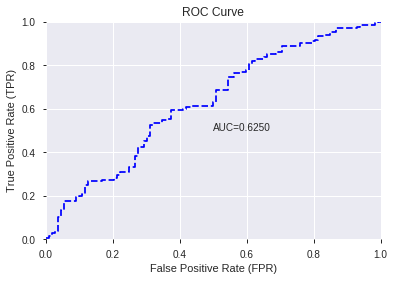

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


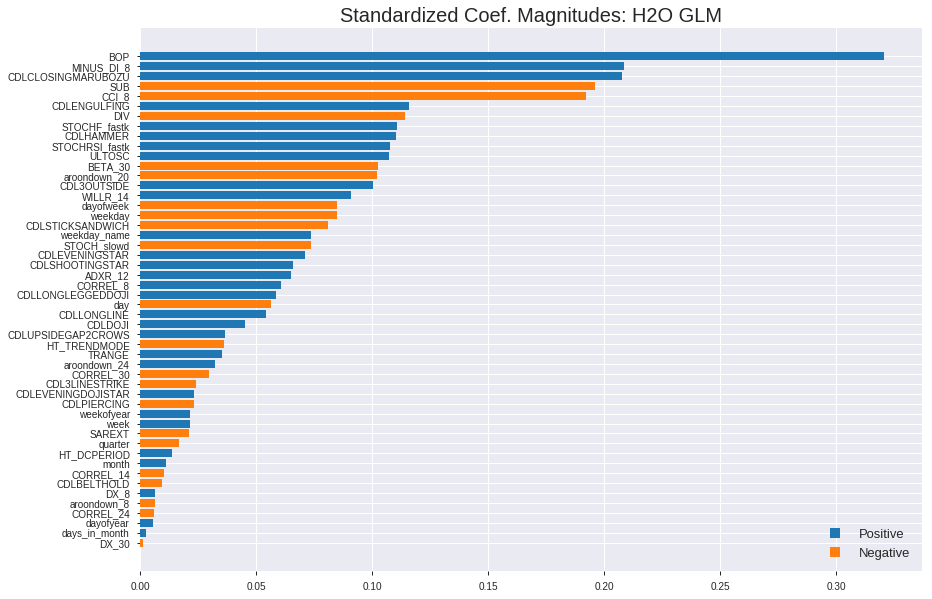

'log_likelihood'
--2019-08-24 17:51:45--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.113.91
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.113.91|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


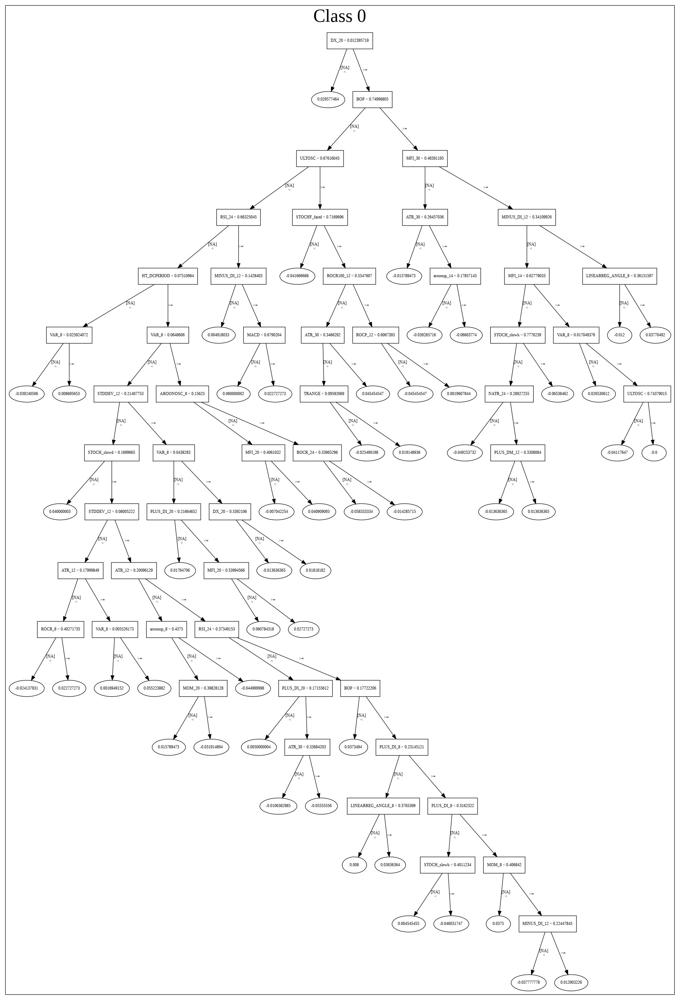

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_175140_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_175140_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_18_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_18_s

['BOP',
 'MINUS_DI_8',
 'CDLCLOSINGMARUBOZU',
 'SUB',
 'CCI_8',
 'CDLENGULFING',
 'DIV',
 'STOCHF_fastk',
 'CDLHAMMER',
 'STOCHRSI_fastk',
 'ULTOSC',
 'BETA_30',
 'aroondown_20',
 'CDL3OUTSIDE',
 'WILLR_14',
 'dayofweek',
 'weekday',
 'CDLSTICKSANDWICH',
 'weekday_name',
 'STOCH_slowd',
 'CDLEVENINGSTAR',
 'CDLSHOOTINGSTAR',
 'ADXR_12',
 'CORREL_8',
 'CDLLONGLEGGEDDOJI',
 'day',
 'CDLLONGLINE',
 'CDLDOJI',
 'CDLUPSIDEGAP2CROWS',
 'HT_TRENDMODE',
 'TRANGE',
 'aroondown_24',
 'CORREL_30',
 'CDL3LINESTRIKE',
 'CDLEVENINGDOJISTAR',
 'CDLPIERCING',
 'weekofyear',
 'week',
 'SAREXT',
 'quarter',
 'HT_DCPERIOD',
 'month',
 'CORREL_14',
 'CDLBELTHOLD',
 'DX_8',
 'aroondown_8',
 'CORREL_24',
 'dayofyear',
 'days_in_month',
 'DX_30']

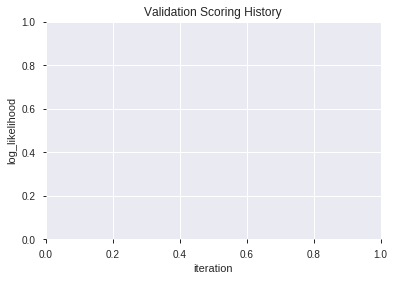

In [13]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190824_175151_model_2,0.622884,0.662377,0.394180,0.484950,0.235177
1,XGBoost_grid_1_AutoML_20190824_175151_model_4,0.616534,0.663293,0.414980,0.485446,0.235658
2,XGBoost_2_AutoML_20190824_175151,0.614550,0.669702,0.384392,0.488672,0.238800
3,XGBoost_1_AutoML_20190824_175151,0.611839,0.673412,0.463525,0.489975,0.240075
4,XGBoost_grid_1_AutoML_20190824_175151_model_3,0.607738,0.671621,0.411276,0.489505,0.239615
5,XGBoost_grid_1_AutoML_20190824_175151_model_7,0.604497,0.675048,0.448611,0.490882,0.240966
6,XGBoost_grid_1_AutoML_20190824_175151_model_6,0.598280,0.676075,0.418022,0.491656,0.241726
7,XGBoost_grid_1_AutoML_20190824_175151_model_1,0.591336,0.671168,0.444907,0.489998,0.240098
8,XGBoost_grid_1_AutoML_20190824_175151_model_5,0.589087,0.693857,0.456779,0.498800,0.248801
9,XGBoost_3_AutoML_20190824_175151,0.588757,0.676069,0.398545,0.492069,0.242132


,variable,relative_importance,scaled_importance,percentage
0,BOP,1524.949707,1.000000,0.220950
1,SUB,530.653748,0.347981,0.076887
2,DIV,422.184875,0.276852,0.061170
3,BETA_30,286.319916,0.187757,0.041485
4,ULTOSC,270.321716,0.177266,0.039167
5,ADXR_12,258.353149,0.169417,0.037433
6,MINUS_DI_8,246.605087,0.161714,0.035731
7,dayofweek,229.144806,0.150264,0.033201
8,STOCH_slowd,215.746323,0.141478,0.031260
9,CCI_8,204.225967,0.133923,0.029590


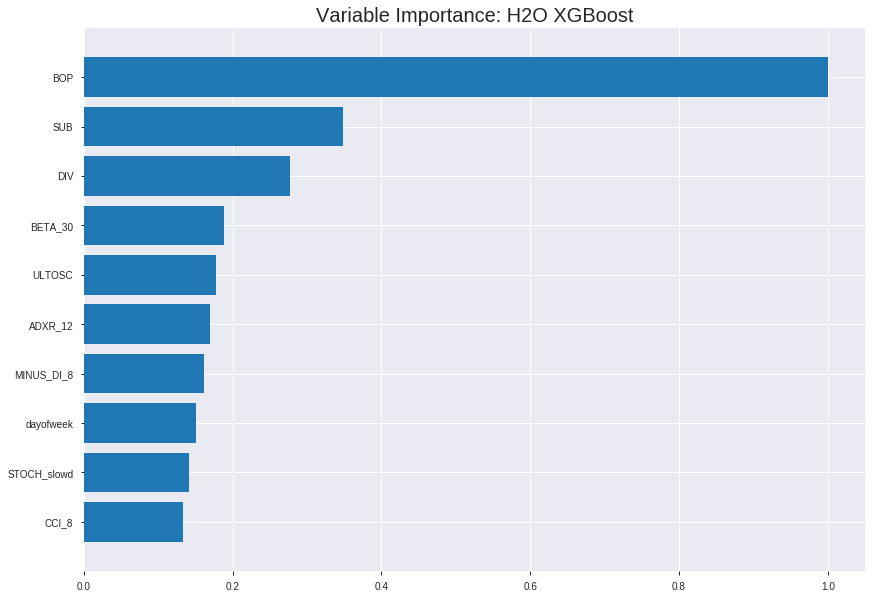

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190824_175151_model_2


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16960772261869395
RMSE: 0.4118345816206963
LogLoss: 0.5200357973093795
Mean Per-Class Error: 0.2103322674148309
AUC: 0.8738193706094871
pr_auc: 0.8707166342510644
Gini: 0.7476387412189742
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49302051961421967: 


,0,1,Error,Rate
0,678.0,215.0,0.2408,(215.0/893.0)
1,151.0,680.0,0.1817,(151.0/831.0)
Total,829.0,895.0,0.2123,(366.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4930205,0.7879490,190.0
max f2,0.3655899,0.8613171,269.0
max f0point5,0.5748060,0.8070926,133.0
max accuracy,0.5206582,0.7900232,172.0
max precision,0.8312148,1.0,0.0
max recall,0.1841238,1.0,361.0
max specificity,0.8312148,1.0,0.0
max absolute_mcc,0.5454967,0.5797498,154.0
max min_per_class_accuracy,0.5090026,0.7872340,180.0
max mean_per_class_accuracy,0.5161989,0.7896677,175.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 48.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.7926064,2.0746089,2.0746089,1.0,0.8066154,1.0,0.8066154,0.0216606,0.0216606,107.4608905,107.4608905
,2,0.0203016,0.7704502,2.0746089,2.0746089,1.0,0.7800220,1.0,0.7936986,0.0204573,0.0421179,107.4608905,107.4608905
,3,0.0301624,0.7585634,2.0746089,2.0746089,1.0,0.7658820,1.0,0.7846047,0.0204573,0.0625752,107.4608905,107.4608905
,4,0.0400232,0.7487738,2.0746089,2.0746089,1.0,0.7535258,1.0,0.7769476,0.0204573,0.0830325,107.4608905,107.4608905
,5,0.0504640,0.7324991,1.9593529,2.0507628,0.9444444,0.7414380,0.9885057,0.7696008,0.0204573,0.1034898,95.9352855,105.0762826
,6,0.1003480,0.6995487,2.0022388,2.0266411,0.9651163,0.7149410,0.9768786,0.7424289,0.0998797,0.2033694,100.2238827,102.6641069
,7,0.1502320,0.6716978,1.9539921,2.0025182,0.9418605,0.6843335,0.9652510,0.7231385,0.0974729,0.3008424,95.3992108,100.2518248
,8,0.2001160,0.6468575,1.9057454,1.9783952,0.9186047,0.6587876,0.9536232,0.7070974,0.0950662,0.3959085,90.5745389,97.8395159
,9,0.2998840,0.6012392,1.5680184,1.8418675,0.7558140,0.6228895,0.8878143,0.6790824,0.1564380,0.5523466,56.8018358,84.1867480
,10,0.4002320,0.5533926,1.3550914,1.7198207,0.6531792,0.5762171,0.8289855,0.6532916,0.1359807,0.6883273,35.5091366,71.9820715




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.21963097548744945
RMSE: 0.46864802942874884
LogLoss: 0.6299507739698602
Mean Per-Class Error: 0.3233538873551437
AUC: 0.7067662958126002
pr_auc: 0.6423731379347081
Gini: 0.4135325916252004
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4595556855201721: 


,0,1,Error,Rate
0,115.0,136.0,0.5418,(136.0/251.0)
1,33.0,208.0,0.1369,(33.0/241.0)
Total,148.0,344.0,0.3435,(169.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4595557,0.7111111,267.0
max f2,0.2595201,0.8374384,366.0
max f0point5,0.5195807,0.6623770,216.0
max accuracy,0.5082744,0.6747967,228.0
max precision,0.7959056,1.0,0.0
max recall,0.1621444,1.0,397.0
max specificity,0.7959056,1.0,0.0
max absolute_mcc,0.5059598,0.3587422,230.0
max min_per_class_accuracy,0.5395793,0.6533865,196.0
max mean_per_class_accuracy,0.5059598,0.6766461,230.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 51.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.7806164,1.6331950,1.6331950,0.8,0.7886535,0.8,0.7886535,0.0165975,0.0165975,63.3195021,63.3195021
,2,0.0203252,0.7579000,0.8165975,1.2248963,0.4,0.7682598,0.6,0.7784566,0.0082988,0.0248963,-18.3402490,22.4896266
,3,0.0304878,0.7454243,1.2248963,1.2248963,0.6,0.7521137,0.6,0.7696757,0.0124481,0.0373444,22.4896266,22.4896266
,4,0.0406504,0.7364633,1.6331950,1.3269710,0.8,0.7406225,0.65,0.7624124,0.0165975,0.0539419,63.3195021,32.6970954
,5,0.0508130,0.7276076,0.8165975,1.2248963,0.4,0.7332525,0.6,0.7565804,0.0082988,0.0622407,-18.3402490,22.4896266
,6,0.1016260,0.6916046,1.3065560,1.2657261,0.64,0.7089618,0.62,0.7327711,0.0663900,0.1286307,30.6556017,26.5726141
,7,0.1504065,0.6629920,1.5311203,1.3517999,0.75,0.6772496,0.6621622,0.7147641,0.0746888,0.2033195,53.1120332,35.1799933
,8,0.2012195,0.6386391,1.7148548,1.4434804,0.84,0.6503291,0.7070707,0.6984926,0.0871369,0.2904564,71.4854772,44.3480448
,9,0.3008130,0.6015032,1.2082310,1.3655938,0.5918367,0.6171204,0.6689189,0.6715518,0.1203320,0.4107884,20.8231010,36.5593810
,10,0.4004065,0.5714447,1.3748836,1.3679045,0.6734694,0.5860454,0.6700508,0.6502837,0.1369295,0.5477178,37.4883563,36.7904459



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 17:51:55,0.612 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5179814,0.5,0.6931472,0.5,0.0,1.0,0.5101626
,2019-08-24 17:51:55,0.687 sec,5.0,0.4829517,0.6595098,0.7983500,0.7566081,2.0005157,0.2720418,0.4909135,0.6750753,0.6798615,0.6140175,1.2248963,0.3780488
,2019-08-24 17:51:55,0.746 sec,10.0,0.4695288,0.6333976,0.8071584,0.7720304,1.9844085,0.2819026,0.4839074,0.6611606,0.6967400,0.6372343,1.3609959,0.3699187
,2019-08-24 17:51:55,0.796 sec,15.0,0.4589025,0.6127250,0.8178694,0.7949653,2.0746089,0.2743619,0.4788679,0.6510746,0.7037245,0.6431944,1.6331950,0.3414634
,2019-08-24 17:51:55,0.849 sec,20.0,0.4504453,0.5961430,0.8248208,0.8096245,2.0746089,0.2679814,0.4759467,0.6451768,0.7045924,0.6423946,1.6331950,0.3333333
,2019-08-24 17:51:55,0.904 sec,25.0,0.4434088,0.5823484,0.8351229,0.8218583,2.0746089,0.2511601,0.4742951,0.6417946,0.7056670,0.6404091,1.6331950,0.3739837
,2019-08-24 17:51:55,0.964 sec,30.0,0.4368321,0.5694184,0.8435849,0.8352567,2.0746089,0.2418794,0.4728119,0.6387636,0.7070308,0.6390889,1.2248963,0.3577236
,2019-08-24 17:51:55,1.031 sec,35.0,0.4310599,0.5579882,0.8500296,0.8409971,2.0746089,0.2436195,0.4709939,0.6350488,0.7090559,0.6399795,1.2248963,0.3678862
,2019-08-24 17:51:55,1.104 sec,40.0,0.4261841,0.5482415,0.8560444,0.8490111,2.0746089,0.2343387,0.4704850,0.6339757,0.7078904,0.6397713,1.2248963,0.3739837
,2019-08-24 17:51:55,1.170 sec,45.0,0.4212673,0.5385076,0.8616152,0.8560579,2.0746089,0.2349188,0.4701365,0.6330777,0.7048900,0.6355189,1.2248963,0.3434959


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1524.9497070,1.0,0.2209504
SUB,530.6537476,0.3479811,0.0768866
DIV,422.1848755,0.2768517,0.0611705
BETA_30,286.3199158,0.1877570,0.0414850
ULTOSC,270.3217163,0.1772660,0.0391670
---,---,---,---
days_in_month,11.6991873,0.0076719,0.0016951
CDLHAMMER,7.1222363,0.0046705,0.0010319
HT_TRENDMODE,6.3737631,0.0041797,0.0009235
weekofyear,1.8876601,0.0012379,0.0002735



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6396761133603239)

('F1', 0.7352941176470589)

('auc', 0.6228835978835978)

('logloss', 0.662377038403334)

('mean_per_class_error', 0.3881944444444445)

('rmse', 0.4849502139648824)

('mse', 0.23517671002458526)

xgboost prediction progress: |████████████████████████████████████████████| 100%


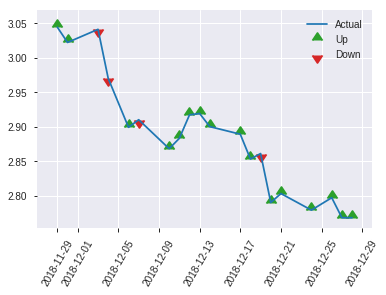


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.23517671002458526
RMSE: 0.4849502139648824
LogLoss: 0.662377038403334
Mean Per-Class Error: 0.3881944444444445
AUC: 0.6228835978835978
pr_auc: 0.6499837491834779
Gini: 0.24576719576719563
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43982619047164917: 


,0,1,Error,Rate
0,32.0,80.0,0.7143,(80.0/112.0)
1,10.0,125.0,0.0741,(10.0/135.0)
Total,42.0,205.0,0.3644,(90.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4398262,0.7352941,204.0
max f2,0.2674770,0.8609694,243.0
max f0point5,0.4451444,0.6577540,199.0
max accuracy,0.4451444,0.6396761,199.0
max precision,0.7318996,0.875,7.0
max recall,0.2674770,1.0,243.0
max specificity,0.7940953,0.9910714,0.0
max absolute_mcc,0.4451444,0.2835994,199.0
max min_per_class_accuracy,0.5458059,0.5625,124.0
max mean_per_class_accuracy,0.4451444,0.6118056,199.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 54.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7612246,1.2197531,1.2197531,0.6666667,0.7845050,0.6666667,0.7845050,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.7379468,1.8296296,1.4637037,1.0,0.7453700,0.8,0.7688510,0.0148148,0.0296296,82.9629630,46.3703704
,3,0.0323887,0.7291583,1.8296296,1.6009259,1.0,0.7341634,0.875,0.7558432,0.0222222,0.0518519,82.9629630,60.0925926
,4,0.0404858,0.7162765,0.9148148,1.4637037,0.5,0.7216991,0.8,0.7490143,0.0074074,0.0592593,-8.5185185,46.3703704
,5,0.0526316,0.7072348,1.8296296,1.5481481,1.0,0.7121660,0.8461538,0.7405109,0.0222222,0.0814815,82.9629630,54.8148148
,6,0.1012146,0.6807897,1.0672840,1.3173333,0.5833333,0.6949161,0.72,0.7186254,0.0518519,0.1333333,6.7283951,31.7333333
,7,0.1497976,0.6708929,1.6771605,1.4340340,0.9166667,0.6755771,0.7837838,0.7046638,0.0814815,0.2148148,67.7160494,43.4034034
,8,0.2024291,0.6486763,0.8444444,1.2807407,0.4615385,0.6615833,0.7,0.6934628,0.0444444,0.2592593,-15.5555556,28.0740741
,9,0.2995951,0.6210606,1.1435185,1.2362362,0.625,0.6350153,0.6756757,0.6745069,0.1111111,0.3703704,14.3518519,23.6236236
,10,0.4008097,0.5931612,0.8050370,1.1273475,0.44,0.6064447,0.6161616,0.6573195,0.0814815,0.4518519,-19.4962963,12.7347550


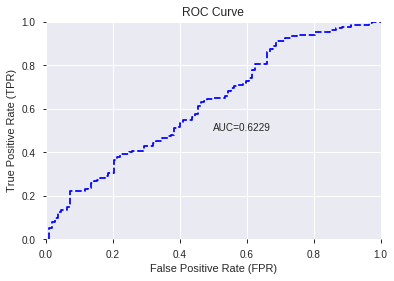

This function is available for GLM models only


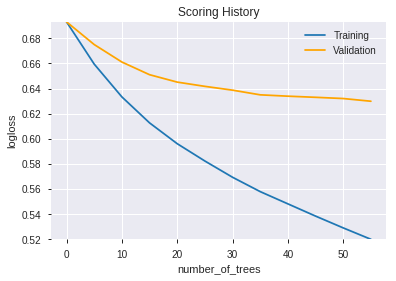

--2019-08-24 17:52:05--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.204.251
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.204.251|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.calculateChildInclusiveNa(SharedTreeNode.java:133)
	at hex.genmodel.algos.tree.SharedTreeNode.setLeftChild(SharedTreeNode.java:207)
	at hex.genmodel.algos.tree.SharedTreeSubgraph.makeLeftEdge(Share

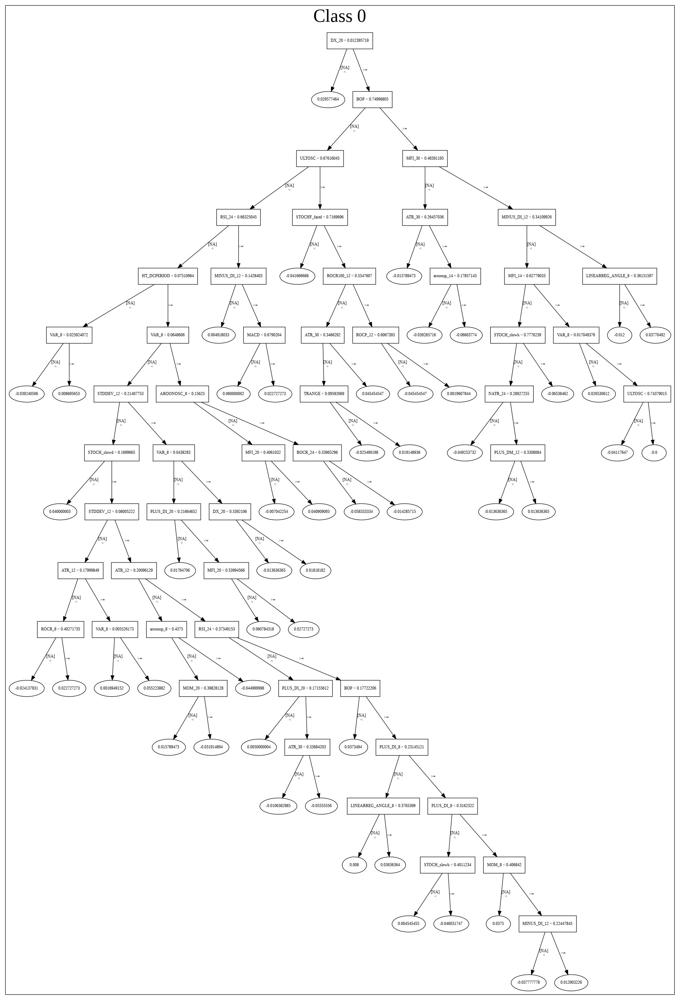

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190824_175151_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190824_175151_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_26_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'SUB',
 'DIV',
 'BETA_30',
 'ULTOSC',
 'ADXR_12',
 'MINUS_DI_8',
 'dayofweek',
 'STOCH_slowd',
 'CCI_8',
 'WILLR_14',
 'DX_8',
 'DX_30',
 'day',
 'TRANGE',
 'CDLCLOSINGMARUBOZU',
 'SAREXT',
 'STOCHF_fastk',
 'CORREL_30',
 'CORREL_24',
 'STOCHRSI_fastk',
 'CORREL_14',
 'HT_DCPERIOD',
 'dayofyear',
 'CORREL_8',
 'weekday_name',
 'aroondown_20',
 'week',
 'weekday',
 'aroondown_24',
 'aroondown_8',
 'CDLLONGLINE',
 'days_in_month',
 'CDLHAMMER',
 'HT_TRENDMODE',
 'weekofyear',
 'month']

In [14]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_175211_model_1,0.640344,0.670057,0.418783,0.488367,0.238502


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.197048,1.000000,3.030709e-02
1,CDLCLOSINGMARUBOZU,0.146304,0.742478,2.250235e-02
2,SUB,0.122639,0.622381,1.886255e-02
3,DIV,0.110639,0.561482,1.701687e-02
4,STOCHRSI_fastk,0.088556,0.449412,1.362036e-02
5,CDLENGULFING,0.086111,0.437004,1.324431e-02
6,STOCHF_fastk,0.083667,0.424603,1.286847e-02
7,CDL3OUTSIDE,0.074343,0.377286,1.143444e-02
8,CDLLONGLINE,0.072602,0.368450,1.116663e-02
9,CDLHAMMER,0.068162,0.345916,1.048372e-02


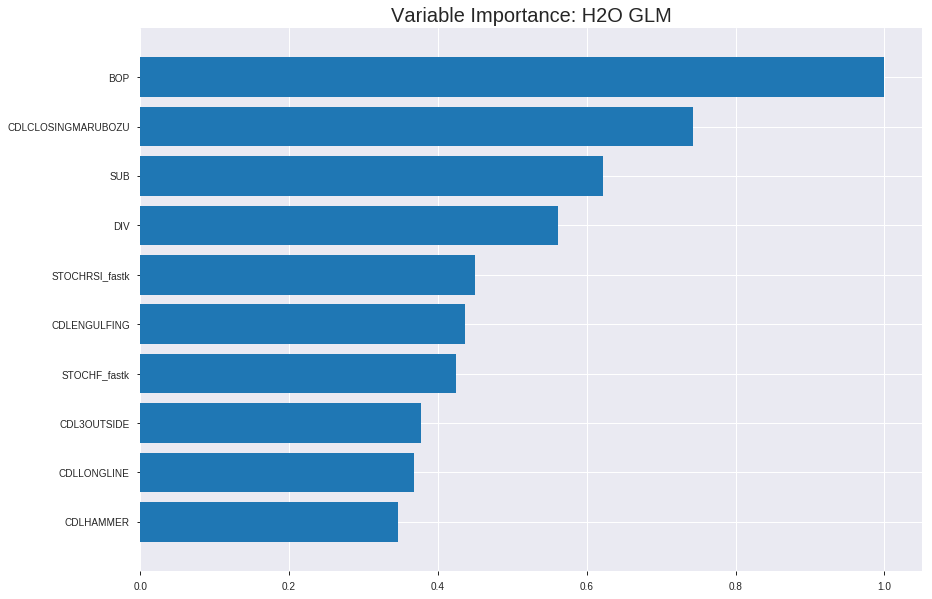

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_175211_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.20510721411319752
RMSE: 0.4528876396118551
LogLoss: 0.5973621004685636
Null degrees of freedom: 1723
Residual degrees of freedom: 693
Null deviance: 2387.7412993239195
Residual deviance: 2059.7045224156072
AIC: 4121.704522415607
AUC: 0.7552241460860847
pr_auc: 0.723933138406254
Gini: 0.5104482921721694
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4074371834788404: 


,0,1,Error,Rate
0,425.0,468.0,0.5241,(468.0/893.0)
1,103.0,728.0,0.1239,(103.0/831.0)
Total,528.0,1196.0,0.3312,(571.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4074372,0.7183029,253.0
max f2,0.2828291,0.8347107,325.0
max f0point5,0.5360179,0.6770982,161.0
max accuracy,0.4582860,0.6867749,215.0
max precision,0.9054879,1.0,0.0
max recall,0.0884790,1.0,394.0
max specificity,0.9054879,1.0,0.0
max absolute_mcc,0.4303258,0.3928499,236.0
max min_per_class_accuracy,0.4944607,0.6799037,189.0
max mean_per_class_accuracy,0.4582860,0.6896277,215.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 48.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.8232332,1.9593529,1.9593529,0.9444444,0.8548977,0.9444444,0.8548977,0.0204573,0.0204573,95.9352855,95.9352855
,2,0.0203016,0.7992697,1.9525731,1.9560598,0.9411765,0.8117028,0.9428571,0.8339173,0.0192539,0.0397112,95.2573087,95.6059825
,3,0.0301624,0.7809401,1.5864656,1.8352310,0.7647059,0.7894624,0.8846154,0.8193840,0.0156438,0.0553550,58.6465633,83.5230954
,4,0.0400232,0.7596050,1.9525731,1.8641413,0.9411765,0.7704278,0.8985507,0.8073223,0.0192539,0.0746089,95.2573087,86.4141335
,5,0.0504640,0.7391485,1.4983287,1.7884560,0.7222222,0.7488297,0.8620690,0.7952204,0.0156438,0.0902527,49.8328654,78.8455953
,6,0.1003480,0.6821537,1.6886352,1.7388341,0.8139535,0.7073404,0.8381503,0.7515344,0.0842359,0.1744886,68.8635155,73.8834053
,7,0.1502320,0.6422662,1.5438950,1.6741053,0.7441860,0.6628805,0.8069498,0.7220972,0.0770156,0.2515042,54.3894999,67.4105255
,8,0.2001160,0.6131909,1.3509081,1.5935402,0.6511628,0.6248627,0.7681159,0.6978590,0.0673887,0.3188929,35.0908124,59.3540173
,9,0.2998840,0.5700702,1.3870932,1.5248576,0.6686047,0.5904752,0.7350097,0.6621336,0.1383875,0.4572804,38.7093163,52.4857609
,10,0.4002320,0.5319521,1.2471637,1.4552329,0.6011561,0.5517361,0.7014493,0.6344543,0.1251504,0.5824308,24.7163735,45.5232913




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.21732023310790477
RMSE: 0.4661761824760085
LogLoss: 0.6292217078515087
Null degrees of freedom: 491
Residual degrees of freedom: -539
Null deviance: 681.9739872837306
Residual deviance: 619.1541605258845
AIC: 2681.1541605258844
AUC: 0.7241325155808301
pr_auc: 0.6748319660540174
Gini: 0.4482650311616603
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4090816061008321: 


,0,1,Error,Rate
0,118.0,133.0,0.5299,(133.0/251.0)
1,37.0,204.0,0.1535,(37.0/241.0)
Total,155.0,337.0,0.3455,(170.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4090816,0.7058824,271.0
max f2,0.2940881,0.8291457,341.0
max f0point5,0.5433614,0.6768101,148.0
max accuracy,0.4595260,0.6768293,230.0
max precision,0.9999885,1.0,0.0
max recall,0.0379389,1.0,398.0
max specificity,0.9999885,1.0,0.0
max absolute_mcc,0.4595260,0.3618528,230.0
max min_per_class_accuracy,0.4939019,0.6573705,198.0
max mean_per_class_accuracy,0.4595260,0.6785555,230.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 48.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.8627019,1.2248963,1.2248963,0.6,0.9071038,0.6,0.9071038,0.0124481,0.0124481,22.4896266,22.4896266
,2,0.0203252,0.8023935,1.2248963,1.2248963,0.6,0.8315574,0.6,0.8693306,0.0124481,0.0248963,22.4896266,22.4896266
,3,0.0304878,0.7882812,1.2248963,1.2248963,0.6,0.7965492,0.6,0.8450702,0.0124481,0.0373444,22.4896266,22.4896266
,4,0.0406504,0.7623006,1.6331950,1.3269710,0.8,0.7777817,0.65,0.8282480,0.0165975,0.0539419,63.3195021,32.6970954
,5,0.0508130,0.7574448,1.6331950,1.3882158,0.8,0.7603551,0.68,0.8146694,0.0165975,0.0705394,63.3195021,38.8215768
,6,0.1016260,0.6764922,1.5515353,1.4698755,0.76,0.7067696,0.72,0.7607195,0.0788382,0.1493776,55.1535270,46.9875519
,7,0.1504065,0.6380846,1.5311203,1.4897387,0.75,0.6576567,0.7297297,0.7272937,0.0746888,0.2240664,53.1120332,48.9738701
,8,0.2012195,0.6106925,1.6331950,1.5259650,0.8,0.6250842,0.7474747,0.7014832,0.0829876,0.3070539,63.3195021,52.5965045
,9,0.3008130,0.5611335,1.5415361,1.5311203,0.7551020,0.5832693,0.75,0.6623448,0.1535270,0.4605809,54.1536117,53.1120332
,10,0.4004065,0.5292609,1.0832416,1.4197190,0.5306122,0.5467101,0.6954315,0.6335829,0.1078838,0.5684647,8.3241595,41.9719022



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 17:52:14,0.000 sec,2,.15E2,989,1.3666575,1.3657546
,2019-08-24 17:52:16,1.976 sec,4,.11E2,1027,1.3612595,1.3602007
,2019-08-24 17:52:18,3.972 sec,6,.79E1,1031,1.3544171,1.3532454
,2019-08-24 17:52:20,5.989 sec,8,.58E1,1031,1.3459609,1.3448356
,2019-08-24 17:52:22,7.942 sec,10,.42E1,1031,1.3357793,1.3350527
,2019-08-24 17:52:24,9.921 sec,12,.31E1,1031,1.3238917,1.3241072
,2019-08-24 17:52:26,11.920 sec,14,.22E1,1031,1.3104737,1.3124054
,2019-08-24 17:52:28,13.981 sec,16,.16E1,1031,1.2958344,1.3005752
,2019-08-24 17:52:31,16.134 sec,18,.12E1,1031,1.2804455,1.2892766
,2019-08-24 17:52:33,18.128 sec,20,.86E0,1031,1.2648062,1.2791880


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6356275303643725)

('F1', 0.7293447293447294)

('auc', 0.6403439153439153)

('logloss', 0.6700570215032555)

('mean_per_class_error', 0.38657407407407407)

('rmse', 0.48836691815634115)

('mse', 0.2385022467495224)

glm prediction progress: |████████████████████████████████████████████████| 100%


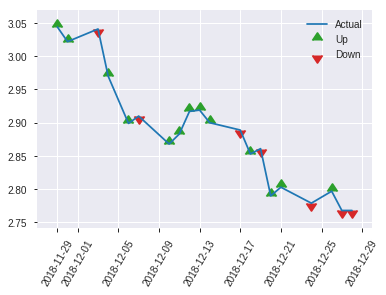


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2385022467495224
RMSE: 0.48836691815634115
LogLoss: 0.6700570215032555
Null degrees of freedom: 246
Residual degrees of freedom: -784
Null deviance: 344.38937217717034
Residual deviance: 331.00816862260825
AIC: 2393.008168622608
AUC: 0.6403439153439153
pr_auc: 0.6540293055063147
Gini: 0.28068783068783065
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2990184976550262: 


,0,1,Error,Rate
0,24.0,88.0,0.7857,(88.0/112.0)
1,7.0,128.0,0.0519,(7.0/135.0)
Total,31.0,216.0,0.3846,(95.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2990185,0.7293447,215.0
max f2,0.1051628,0.8598726,244.0
max f0point5,0.3723872,0.6571429,184.0
max accuracy,0.3723872,0.6356275,184.0
max precision,0.8254263,1.0,0.0
max recall,0.1051628,1.0,244.0
max specificity,0.8254263,1.0,0.0
max absolute_mcc,0.3723872,0.2604573,184.0
max min_per_class_accuracy,0.4793491,0.5982143,125.0
max mean_per_class_accuracy,0.3723872,0.6134259,184.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 47.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7593197,1.2197531,1.2197531,0.6666667,0.7839296,0.6666667,0.7839296,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.7516645,0.9148148,1.0977778,0.5,0.7559638,0.6,0.7727433,0.0074074,0.0222222,-8.5185185,9.7777778
,3,0.0323887,0.7360754,1.8296296,1.3722222,1.0,0.7434423,0.75,0.7617554,0.0222222,0.0444444,82.9629630,37.2222222
,4,0.0404858,0.7296030,0.9148148,1.2807407,0.5,0.7322972,0.7,0.7558638,0.0074074,0.0518519,-8.5185185,28.0740741
,5,0.0526316,0.7230738,1.2197531,1.2666667,0.6666667,0.7280229,0.6923077,0.7494390,0.0148148,0.0666667,21.9753086,26.6666667
,6,0.1012146,0.6622629,1.5246914,1.3905185,0.8333333,0.6944628,0.76,0.7230504,0.0740741,0.1407407,52.4691358,39.0518519
,7,0.1497976,0.6238342,1.0672840,1.2856857,0.5833333,0.6441404,0.7027027,0.6974580,0.0518519,0.1925926,6.7283951,28.5685686
,8,0.2024291,0.5898734,1.2666667,1.2807407,0.6923077,0.6063883,0.7,0.6737799,0.0666667,0.2592593,26.6666667,28.0740741
,9,0.2995951,0.5506466,1.1435185,1.2362362,0.625,0.5686459,0.6756757,0.6396824,0.1111111,0.3703704,14.3518519,23.6236236
,10,0.4008097,0.5053263,1.2441481,1.2382342,0.68,0.5263476,0.6767677,0.6110625,0.1259259,0.4962963,24.4148148,23.8234194


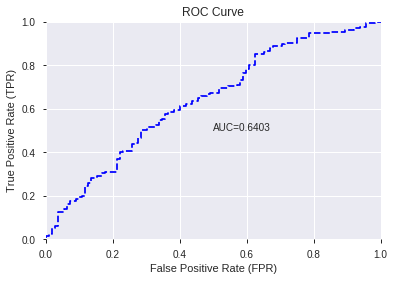

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


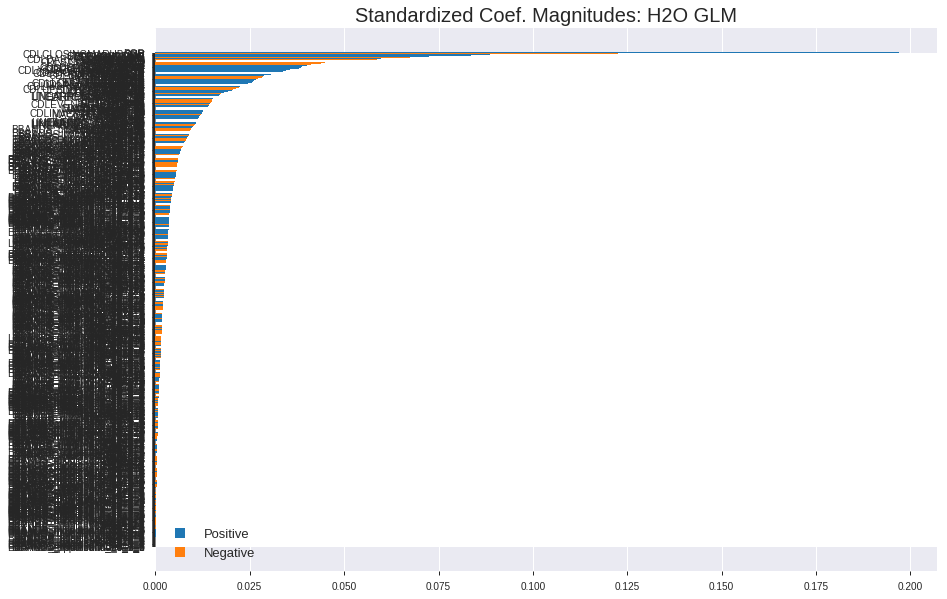

'log_likelihood'
--2019-08-24 17:53:12--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.107.36
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.107.36|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


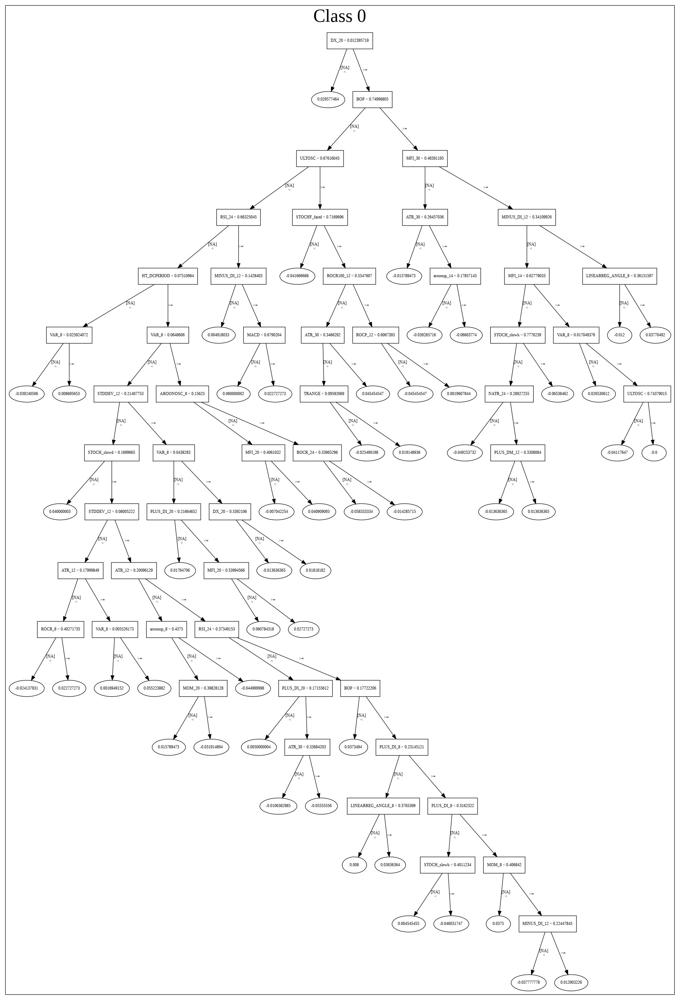

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_175211_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_175211_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_34_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_34_s

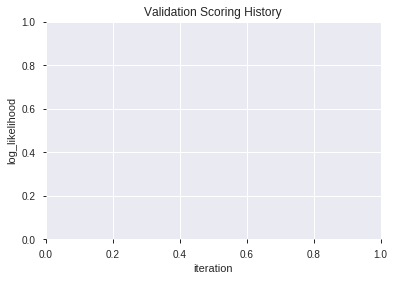

In [15]:
# GLM
glm_features = model_train(feature_name='All',model_algo="GLM")

In [16]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [17]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [18]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_3_AutoML_20190824_175319,0.642725,0.658571,0.458300,0.483286,0.233565
1,XGBoost_grid_1_AutoML_20190824_175319_model_4,0.637831,0.659547,0.444147,0.483688,0.233954
2,XGBoost_grid_1_AutoML_20190824_175319_model_6,0.631151,0.669103,0.443386,0.488247,0.238385
3,XGBoost_grid_1_AutoML_20190824_175319_model_7,0.614947,0.680065,0.467989,0.493474,0.243517
4,XGBoost_grid_1_AutoML_20190824_175319_model_3,0.610847,0.668174,0.443386,0.488161,0.238301
5,XGBoost_grid_1_AutoML_20190824_175319_model_2,0.604828,0.670216,0.420205,0.488869,0.238993
6,XGBoost_2_AutoML_20190824_175319,0.598413,0.677098,0.435979,0.492576,0.242631
7,XGBoost_grid_1_AutoML_20190824_175319_model_1,0.596825,0.681580,0.463525,0.494310,0.244342
8,XGBoost_1_AutoML_20190824_175319,0.595437,0.683792,0.453836,0.495779,0.245797
9,XGBoost_grid_1_AutoML_20190824_175319_model_5,0.556746,0.711905,0.467989,0.508202,0.258270


,variable,relative_importance,scaled_importance,percentage
0,BOP,1166.865479,1.000000,0.143603
1,SUB,499.309692,0.427907,0.061449
2,CDLCLOSINGMARUBOZU,313.715515,0.268853,0.038608
3,DIV,249.179214,0.213546,0.030666
4,dayofweek,197.668030,0.169401,0.024327
5,STDDEV_8,117.592148,0.100776,0.014472
6,STOCHF_fastk,112.208977,0.096163,0.013809
7,CDLLONGLINE,98.624016,0.084520,0.012137
8,BETA_24,96.568512,0.082759,0.011884
9,TRANGE,91.135933,0.078103,0.011216


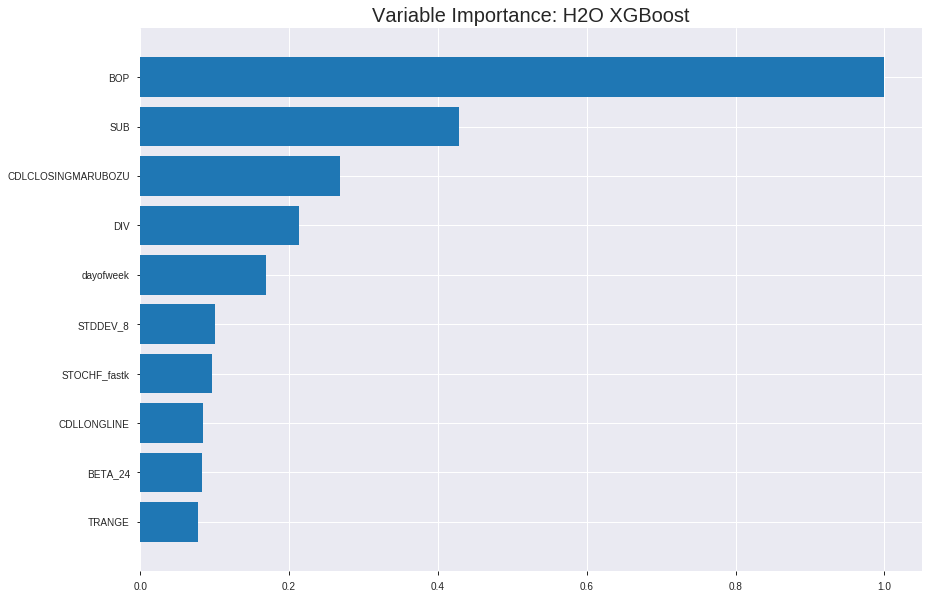

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_3_AutoML_20190824_175319


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.141122202370448
RMSE: 0.37566235154783345
LogLoss: 0.4567432434635277
Mean Per-Class Error: 0.1278839429012657
AUC: 0.9470968880839475
pr_auc: 0.9448548401703668
Gini: 0.8941937761678951
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5146575669447581: 


,0,1,Error,Rate
0,784.0,109.0,0.1221,(109.0/893.0)
1,113.0,718.0,0.136,(113.0/831.0)
Total,897.0,827.0,0.1288,(222.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5146576,0.8661037,177.0
max f2,0.4413738,0.9075264,219.0
max f0point5,0.5657943,0.8982466,147.0
max accuracy,0.5228662,0.8729698,172.0
max precision,0.8845813,1.0,0.0
max recall,0.2165900,1.0,337.0
max specificity,0.8845813,1.0,0.0
max absolute_mcc,0.5228662,0.7458092,172.0
max min_per_class_accuracy,0.5103857,0.8688327,180.0
max mean_per_class_accuracy,0.5228662,0.8721161,172.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 48.31 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.8357071,2.0746089,2.0746089,1.0,0.8565251,1.0,0.8565251,0.0216606,0.0216606,107.4608905,107.4608905
,2,0.0203016,0.8048635,2.0746089,2.0746089,1.0,0.8185814,1.0,0.8380953,0.0204573,0.0421179,107.4608905,107.4608905
,3,0.0301624,0.7907326,2.0746089,2.0746089,1.0,0.7967123,1.0,0.8245663,0.0204573,0.0625752,107.4608905,107.4608905
,4,0.0400232,0.7743927,2.0746089,2.0746089,1.0,0.7808664,1.0,0.8137996,0.0204573,0.0830325,107.4608905,107.4608905
,5,0.0504640,0.7647339,2.0746089,2.0746089,1.0,0.7707666,1.0,0.8048962,0.0216606,0.1046931,107.4608905,107.4608905
,6,0.1003480,0.7278598,2.0746089,2.0746089,1.0,0.7461988,1.0,0.7757172,0.1034898,0.2081829,107.4608905,107.4608905
,7,0.1502320,0.6968886,2.0263622,2.0585888,0.9767442,0.7101520,0.9922780,0.7539465,0.1010830,0.3092659,102.6362186,105.8588759
,8,0.2001160,0.6689788,2.0022388,2.0445421,0.9651163,0.6835050,0.9855072,0.7363872,0.0998797,0.4091456,100.2238827,104.4542109
,9,0.2998840,0.6124461,1.9901771,2.0264555,0.9593023,0.6414900,0.9767892,0.7048160,0.1985560,0.6077016,99.0177147,102.6455507
,10,0.4002320,0.5534179,1.6069225,1.9212682,0.7745665,0.5846296,0.9260870,0.6746823,0.1612515,0.7689531,60.6922504,92.1268247




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.2194325362890786
RMSE: 0.46843626705142993
LogLoss: 0.6292098939651314
Mean Per-Class Error: 0.3194524805342944
AUC: 0.6991205303268255
pr_auc: 0.6363056500375222
Gini: 0.39824106065365106
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38022398948669434: 


,0,1,Error,Rate
0,101.0,150.0,0.5976,(150.0/251.0)
1,27.0,214.0,0.112,(27.0/241.0)
Total,128.0,364.0,0.3598,(177.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3802240,0.7074380,287.0
max f2,0.2256224,0.8386187,365.0
max f0point5,0.4814200,0.6669123,216.0
max accuracy,0.4814200,0.6788618,216.0
max precision,0.8394529,1.0,0.0
max recall,0.1271067,1.0,396.0
max specificity,0.8394529,1.0,0.0
max absolute_mcc,0.4765145,0.3656447,221.0
max min_per_class_accuracy,0.5283276,0.6431535,186.0
max mean_per_class_accuracy,0.4765145,0.6805475,221.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 49.47 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.8139128,1.2248963,1.2248963,0.6,0.8291681,0.6,0.8291681,0.0124481,0.0124481,22.4896266,22.4896266
,2,0.0203252,0.7964253,1.2248963,1.2248963,0.6,0.8043167,0.6,0.8167424,0.0124481,0.0248963,22.4896266,22.4896266
,3,0.0304878,0.7779610,1.6331950,1.3609959,0.8,0.7888404,0.6666667,0.8074417,0.0165975,0.0414938,63.3195021,36.0995851
,4,0.0406504,0.7625356,0.8165975,1.2248963,0.4,0.7700284,0.6,0.7980884,0.0082988,0.0497925,-18.3402490,22.4896266
,5,0.0508130,0.7501791,1.2248963,1.2248963,0.6,0.7558869,0.6,0.7896481,0.0124481,0.0622407,22.4896266,22.4896266
,6,0.1016260,0.7036559,1.7148548,1.4698755,0.84,0.7287281,0.72,0.7591881,0.0871369,0.1493776,71.4854772,46.9875519
,7,0.1504065,0.6660881,1.2759336,1.4069754,0.625,0.6847822,0.6891892,0.7350564,0.0622407,0.2116183,27.5933610,40.6975440
,8,0.2012195,0.6330801,1.1432365,1.3403747,0.56,0.6486022,0.6565657,0.7132246,0.0580913,0.2697095,14.3236515,34.0374701
,9,0.3008130,0.5962202,1.4582098,1.3793877,0.7142857,0.6118385,0.6756757,0.6796576,0.1452282,0.4149378,45.8209840,37.9387686
,10,0.4004065,0.5543258,1.2082310,1.3368157,0.5918367,0.5742186,0.6548223,0.6534316,0.1203320,0.5352697,20.8231010,33.6815721



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 17:53:30,0.016 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5179814,0.5,0.6931472,0.5,0.0,1.0,0.5101626
,2019-08-24 17:53:31,0.652 sec,5.0,0.4780719,0.6500184,0.8308734,0.8039101,1.9708785,0.2465197,0.4897497,0.6727648,0.6745632,0.6324185,1.4582098,0.4085366
,2019-08-24 17:53:31,0.854 sec,10.0,0.4608121,0.6167409,0.8645266,0.8542728,1.9593529,0.2221578,0.4835886,0.6605103,0.6827958,0.6319288,1.2248963,0.3638211
,2019-08-24 17:53:31,1.052 sec,15.0,0.4470126,0.5901113,0.8764282,0.8690026,2.0746089,0.2035963,0.4775966,0.6485423,0.7056256,0.6535451,1.2248963,0.3577236
,2019-08-24 17:53:32,1.259 sec,20.0,0.4355548,0.5681731,0.8885650,0.8853034,2.0746089,0.1966357,0.4757898,0.6447956,0.6989965,0.6441588,1.2248963,0.3191057
,2019-08-24 17:53:32,1.455 sec,25.0,0.4242954,0.5466842,0.9002807,0.8970240,2.0746089,0.1861949,0.4734226,0.6398486,0.6994346,0.6413607,1.2248963,0.3943089
,2019-08-24 17:53:32,1.654 sec,30.0,0.4144489,0.5280315,0.9106279,0.9088775,2.0746089,0.1705336,0.4722491,0.6373589,0.6992528,0.6417864,0.8165975,0.3394309
,2019-08-24 17:53:32,1.850 sec,35.0,0.4056597,0.5112099,0.9166562,0.9166479,2.0746089,0.1687935,0.4702450,0.6331592,0.7020714,0.6450970,0.8165975,0.3658537
,2019-08-24 17:53:32,2.053 sec,40.0,0.3960410,0.4936419,0.9291077,0.9286431,2.0746089,0.1612529,0.4701935,0.6328747,0.6970872,0.6392374,0.8165975,0.3638211
,2019-08-24 17:53:33,2.243 sec,45.0,0.3892668,0.4814896,0.9364963,0.9355277,2.0746089,0.1542923,0.4703350,0.6331097,0.6947232,0.6320356,1.2248963,0.3678862


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1166.8654785,1.0,0.1436032
SUB,499.3096924,0.4279068,0.0614488
CDLCLOSINGMARUBOZU,313.7155151,0.2688532,0.0386082
DIV,249.1792145,0.2135458,0.0306659
dayofweek,197.6680298,0.1694009,0.0243265
---,---,---,---
CDLMARUBOZU,1.6048717,0.0013754,0.0001975
TRIMA_24,1.3614206,0.0011667,0.0001675
BBANDS_upperband_30_7_5,1.2564144,0.0010767,0.0001546
BBANDS_lowerband_30_5_5,0.7687874,0.0006588,0.0000946



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6356275303643725)

('F1', 0.7208672086720866)

('auc', 0.6427248677248677)

('logloss', 0.6585714267497148)

('mean_per_class_error', 0.379728835978836)

('rmse', 0.48328610087318596)

('mse', 0.2335654552972073)

xgboost prediction progress: |████████████████████████████████████████████| 100%


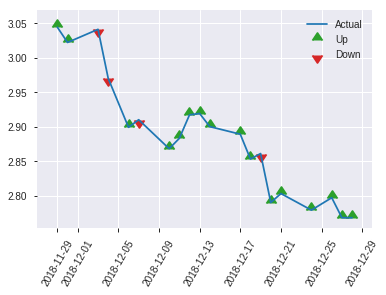


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2335654552972073
RMSE: 0.48328610087318596
LogLoss: 0.6585714267497148
Mean Per-Class Error: 0.379728835978836
AUC: 0.6427248677248677
pr_auc: 0.6637859224190299
Gini: 0.2854497354497354
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2598494291305542: 


,0,1,Error,Rate
0,11.0,101.0,0.9018,(101.0/112.0)
1,2.0,133.0,0.0148,(2.0/135.0)
Total,13.0,234.0,0.417,(103.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2598494,0.7208672,233.0
max f2,0.2174077,0.8653846,239.0
max f0point5,0.4508252,0.6600249,166.0
max accuracy,0.4508252,0.6356275,166.0
max precision,0.8191110,1.0,0.0
max recall,0.2174077,1.0,239.0
max specificity,0.8191110,1.0,0.0
max absolute_mcc,0.4416645,0.2561738,170.0
max min_per_class_accuracy,0.5077037,0.5982143,125.0
max mean_per_class_accuracy,0.4508252,0.6202712,166.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 49.57 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7696993,1.2197531,1.2197531,0.6666667,0.7949770,0.6666667,0.7949770,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.7384070,1.8296296,1.4637037,1.0,0.7684076,0.8,0.7843493,0.0148148,0.0296296,82.9629630,46.3703704
,3,0.0323887,0.7153518,1.8296296,1.6009259,1.0,0.7287805,0.875,0.7635110,0.0222222,0.0518519,82.9629630,60.0925926
,4,0.0404858,0.7042165,1.8296296,1.6466667,1.0,0.7085752,0.9,0.7525239,0.0148148,0.0666667,82.9629630,64.6666667
,5,0.0526316,0.6970968,1.2197531,1.5481481,0.6666667,0.6999605,0.8461538,0.7403938,0.0148148,0.0814815,21.9753086,54.8148148
,6,0.1012146,0.6645033,1.2197531,1.3905185,0.6666667,0.6818457,0.76,0.7122908,0.0592593,0.1407407,21.9753086,39.0518519
,7,0.1497976,0.6264639,1.3722222,1.3845846,0.75,0.6457943,0.7567568,0.6907243,0.0666667,0.2074074,37.2222222,38.4584585
,8,0.2024291,0.6047732,0.7037037,1.2075556,0.3846154,0.6178702,0.66,0.6717823,0.0370370,0.2444444,-29.6296296,20.7555556
,9,0.2995951,0.5753145,1.1435185,1.1867868,0.625,0.5925603,0.6486486,0.6460887,0.1111111,0.3555556,14.3518519,18.6786787
,10,0.4008097,0.5415628,1.3173333,1.2197531,0.72,0.5592066,0.6666667,0.6241487,0.1333333,0.4888889,31.7333333,21.9753086


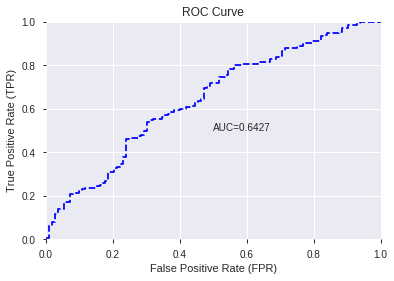

This function is available for GLM models only


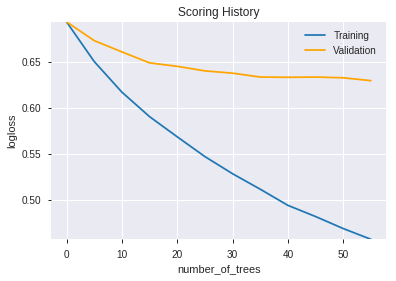

--2019-08-24 17:54:06--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.92.91
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.92.91|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.

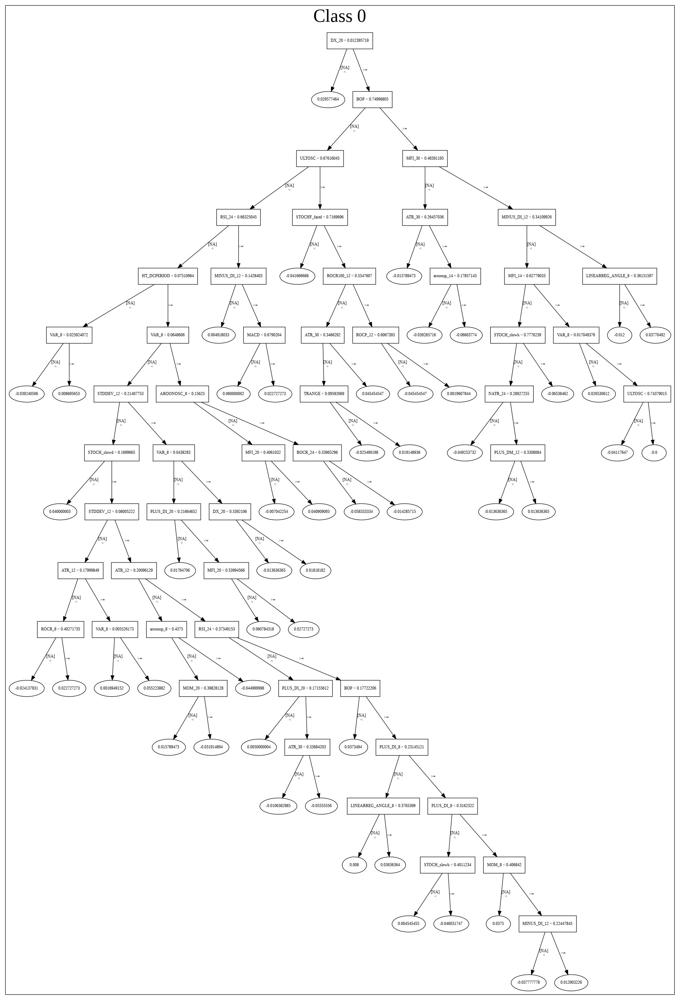

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_3_AutoML_20190824_175319',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_3_AutoML_20190824_175319',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_42_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_42_sid_8acf',
   'type

In [19]:
# XGBoost
xgb_features = model_train(feature_name='All',model_algo="XGBoost")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_175413_model_8,0.618056,0.667438,0.449272,0.487228,0.237391
1,DeepLearning_grid_1_AutoML_20190824_175413_model_9,0.612566,0.669909,0.411276,0.487950,0.238095
2,DeepLearning_grid_1_AutoML_20190824_175413_model_6,0.606944,0.685620,0.436640,0.494221,0.244255
3,DeepLearning_1_AutoML_20190824_175413,0.603836,0.717056,0.426951,0.503330,0.253341
4,DeepLearning_grid_1_AutoML_20190824_175413_model_5,0.603571,0.731282,0.418022,0.511875,0.262016
5,DeepLearning_grid_1_AutoML_20190824_175413_model_7,0.547024,0.995643,0.482143,0.572731,0.328020
6,DeepLearning_grid_1_AutoML_20190824_175413_model_3,0.543849,1.094677,0.495536,0.554611,0.307593
7,DeepLearning_grid_1_AutoML_20190824_175413_model_4,0.504960,1.256056,0.479861,0.583222,0.340148
8,DeepLearning_grid_1_AutoML_20190824_175413_model_1,0.494114,1.623780,0.475397,0.635650,0.404051
9,DeepLearning_grid_1_AutoML_20190824_175413_model_2,0.484524,1.140323,0.500000,0.585579,0.342903


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.034296
1,SUB,0.865728,0.865728,0.029691
2,CDLCLOSINGMARUBOZU,0.824472,0.824472,0.028276
3,MINUS_DI_8,0.742866,0.742866,0.025477
4,DIV,0.714230,0.714230,0.024495
5,weekday_name,0.699712,0.699712,0.023997
6,CCI_8,0.673578,0.673578,0.023101
7,ULTOSC,0.653202,0.653202,0.022402
8,day,0.640876,0.640876,0.021980
9,DX_8,0.603625,0.603625,0.020702


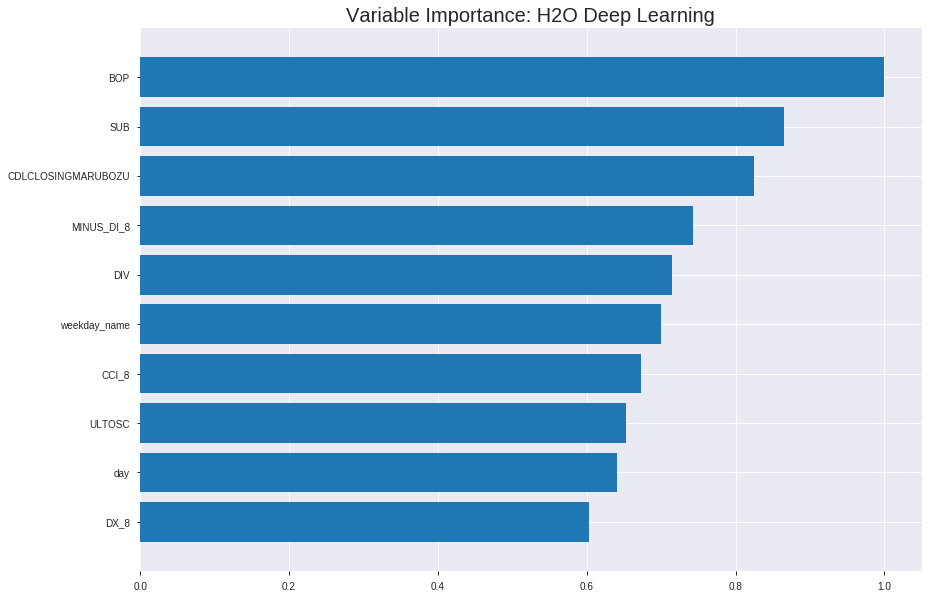

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_175413_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.2089187350728159
RMSE: 0.4570762902107436
LogLoss: 0.6039344248613583
Mean Per-Class Error: 0.3140241724982247
AUC: 0.752043235055917
pr_auc: 0.712890624225126
Gini: 0.5040864701118339
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46069304955272616: 


,0,1,Error,Rate
0,354.0,539.0,0.6036,(539.0/893.0)
1,52.0,779.0,0.0626,(52.0/831.0)
Total,406.0,1318.0,0.3428,(591.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4606930,0.7249884,241.0
max f2,0.3921576,0.8472979,274.0
max f0point5,0.5555525,0.6688840,165.0
max accuracy,0.5430035,0.6832947,181.0
max precision,0.8645421,1.0,0.0
max recall,0.0418176,1.0,392.0
max specificity,0.8645421,1.0,0.0
max absolute_mcc,0.4606930,0.3931386,241.0
max min_per_class_accuracy,0.5525418,0.6774916,169.0
max mean_per_class_accuracy,0.5421447,0.6859758,182.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 52.63 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.8272250,2.0746089,2.0746089,1.0,0.8403921,1.0,0.8403921,0.0216606,0.0216606,107.4608905,107.4608905
,2,0.0203016,0.8161342,1.5864656,1.8375107,0.7647059,0.8209548,0.8857143,0.8309511,0.0156438,0.0373045,58.6465633,83.7510744
,3,0.0301624,0.8022054,1.4644298,1.7155420,0.7058824,0.8094001,0.8269231,0.8239056,0.0144404,0.0517449,46.4429815,71.5541979
,4,0.0400232,0.7791623,1.8305373,1.7438742,0.8823529,0.7910746,0.8405797,0.8158168,0.0180505,0.0697954,83.0537269,74.3874152
,5,0.0504640,0.7691861,1.8440968,1.7646099,0.8888889,0.7748362,0.8505747,0.8073381,0.0192539,0.0890493,84.4096804,76.4609873
,6,0.1003480,0.6932676,1.6162651,1.6908662,0.7790698,0.7255977,0.8150289,0.7667041,0.0806258,0.1696751,61.6265077,69.0866217
,7,0.1502320,0.6501675,1.5197716,1.6340549,0.7325581,0.6701884,0.7876448,0.7346565,0.0758123,0.2454874,51.9771640,63.4054890
,8,0.2001160,0.6295907,1.4232782,1.5815135,0.6860465,0.6392067,0.7623188,0.7108632,0.0709988,0.3164862,42.3278202,58.1513455
,9,0.2998840,0.5978692,1.2905997,1.4847298,0.6220930,0.6115998,0.7156673,0.6778394,0.1287605,0.4452467,29.0599726,48.4729777
,10,0.4002320,0.5689349,1.2591557,1.4281728,0.6069364,0.5838770,0.6884058,0.6542807,0.1263538,0.5716005,25.9155694,42.8172797




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.22342644150742502
RMSE: 0.472680062523717
LogLoss: 0.637717750408483
Mean Per-Class Error: 0.32442842736936073
AUC: 0.7189251293580863
pr_auc: 0.6704164139890763
Gini: 0.43785025871617256
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4400843701830748: 


,0,1,Error,Rate
0,67.0,184.0,0.7331,(184.0/251.0)
1,12.0,229.0,0.0498,(12.0/241.0)
Total,79.0,413.0,0.3984,(196.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4400844,0.7003058,322.0
max f2,0.3875606,0.8422175,350.0
max f0point5,0.5655789,0.6698565,170.0
max accuracy,0.5524918,0.6747967,203.0
max precision,0.8031041,0.8,9.0
max recall,0.2218104,1.0,387.0
max specificity,0.8667541,0.9960159,0.0
max absolute_mcc,0.5522004,0.3519119,205.0
max min_per_class_accuracy,0.5548402,0.6639004,194.0
max mean_per_class_accuracy,0.5522004,0.6755716,205.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 54.42 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.8235706,1.2248963,1.2248963,0.6,0.8416598,0.6,0.8416598,0.0124481,0.0124481,22.4896266,22.4896266
,2,0.0203252,0.7980016,2.0414938,1.6331950,1.0,0.8151532,0.8,0.8284065,0.0207469,0.0331950,104.1493776,63.3195021
,3,0.0304878,0.7853189,0.8165975,1.3609959,0.4,0.7932544,0.6666667,0.8166891,0.0082988,0.0414938,-18.3402490,36.0995851
,4,0.0406504,0.7688441,1.6331950,1.4290456,0.8,0.7755987,0.7,0.8064165,0.0165975,0.0580913,63.3195021,42.9045643
,5,0.0508130,0.7605454,1.6331950,1.4698755,0.8,0.7663480,0.72,0.7984028,0.0165975,0.0746888,63.3195021,46.9875519
,6,0.1016260,0.6717628,1.6331950,1.5515353,0.8,0.7130900,0.76,0.7557464,0.0829876,0.1576763,63.3195021,55.1535270
,7,0.1504065,0.6416651,1.6161826,1.5725020,0.7916667,0.6555422,0.7702703,0.7232478,0.0788382,0.2365145,61.6182573,57.2501963
,8,0.2012195,0.6175815,1.3065560,1.5053439,0.64,0.6320401,0.7373737,0.7002155,0.0663900,0.3029046,30.6556017,50.5343895
,9,0.3008130,0.5913266,1.3332204,1.4483571,0.6530612,0.6038380,0.7094595,0.6683068,0.1327801,0.4356846,33.3220425,44.8357071
,10,0.4004065,0.5673273,1.3332204,1.4197190,0.6530612,0.5794723,0.6954315,0.6462109,0.1327801,0.5684647,33.3220425,41.9719022



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 18:00:19,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 18:00:21,1 min 30.808 sec,596 obs/sec,0.6821346,1,1176.0,0.4695803,0.6328114,0.1168353,0.7027873,0.6596770,1.9593529,0.3921114,0.4744159,0.6451766,0.0993460,0.6915988,0.6507051,1.2248963,0.4491870
,2019-08-24 18:00:36,1 min 45.429 sec,941 obs/sec,8.3004640,12,14310.0,0.4570763,0.6039344,0.1632429,0.7520432,0.7128906,2.0746089,0.3428074,0.4726801,0.6377178,0.1059249,0.7189251,0.6704164,1.2248963,0.3983740
,2019-08-24 18:00:51,2 min 0.269 sec,1043 obs/sec,17.3259861,25,29870.0,0.4426331,0.5725086,0.2152887,0.7697987,0.7372909,1.9593529,0.3277262,0.4729057,0.6435101,0.1050712,0.7018730,0.6525961,1.2248963,0.3699187
,2019-08-24 18:01:05,2 min 14.552 sec,1091 obs/sec,26.2732019,38,45295.0,0.4443964,0.5693738,0.2090243,0.7856729,0.7565383,2.0746089,0.3143852,0.4875272,0.6786287,0.0488758,0.7106429,0.6604704,0.8165975,0.3495935
,2019-08-24 18:01:21,2 min 30.448 sec,1110 obs/sec,35.9686775,52,62010.0,0.4220503,0.5159373,0.2865715,0.8038016,0.7790929,1.9593529,0.3004640,0.4832251,0.6895907,0.0655880,0.6985667,0.6497421,1.2248963,0.3699187
,2019-08-24 18:01:37,2 min 46.280 sec,1139 obs/sec,46.4269142,67,80040.0,0.4146216,0.5016976,0.3114653,0.8343366,0.8088059,2.0746089,0.2819026,0.5028541,0.7428465,-0.0118671,0.6463854,0.5924493,1.2248963,0.3658537
,2019-08-24 18:01:38,2 min 47.752 sec,1139 obs/sec,46.4269142,67,80040.0,0.4570763,0.6039344,0.1632429,0.7520432,0.7128906,2.0746089,0.3428074,0.4726801,0.6377178,0.1059249,0.7189251,0.6704164,1.2248963,0.3983740


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0342961
SUB,0.8657283,0.8657283,0.0296911
CDLCLOSINGMARUBOZU,0.8244717,0.8244717,0.0282762
MINUS_DI_8,0.7428665,0.7428665,0.0254775
DIV,0.7142295,0.7142295,0.0244953
---,---,---,---
CORREL_30,0.4965202,0.4965202,0.0170287
week,0.4877549,0.4877549,0.0167281
CORREL_24,0.4786454,0.4786454,0.0164157
CDLPIERCING,0.4713283,0.4713283,0.0161647



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6194331983805668)

('F1', 0.7134831460674156)

('auc', 0.6180555555555556)

('logloss', 0.6674380368547203)

('mean_per_class_error', 0.39530423280423277)

('rmse', 0.48722801518693737)

('mse', 0.2373911387830025)

deeplearning prediction progress: |███████████████████████████████████████| 100%


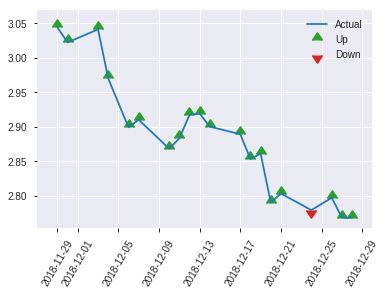


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2373911387830025
RMSE: 0.48722801518693737
LogLoss: 0.6674380368547203
Mean Per-Class Error: 0.39530423280423277
AUC: 0.6180555555555556
pr_auc: 0.6312519934463613
Gini: 0.23611111111111116
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4253826113334385: 


,0,1,Error,Rate
0,18.0,94.0,0.8393,(94.0/112.0)
1,8.0,127.0,0.0593,(8.0/135.0)
Total,26.0,221.0,0.413,(102.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4253826,0.7134831,220.0
max f2,0.2573355,0.8609694,243.0
max f0point5,0.5434931,0.6477987,164.0
max accuracy,0.5434931,0.6194332,164.0
max precision,0.8175115,1.0,0.0
max recall,0.2573355,1.0,243.0
max specificity,0.8175115,1.0,0.0
max absolute_mcc,0.5434931,0.2213534,164.0
max min_per_class_accuracy,0.5557254,0.5777778,123.0
max mean_per_class_accuracy,0.5434931,0.6046958,164.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 56.46 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7891853,1.2197531,1.2197531,0.6666667,0.8055685,0.6666667,0.8055685,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.7778679,0.0,0.7318519,0.0,0.7843328,0.4,0.7970742,0.0,0.0148148,-100.0,-26.8148148
,3,0.0323887,0.7722632,1.8296296,1.1435185,1.0,0.7760928,0.625,0.7892062,0.0222222,0.0370370,82.9629630,14.3518519
,4,0.0404858,0.7666660,1.8296296,1.2807407,1.0,0.7683738,0.7,0.7850397,0.0148148,0.0518519,82.9629630,28.0740741
,5,0.0526316,0.7282212,0.6098765,1.1259259,0.3333333,0.7467190,0.6153846,0.7761965,0.0074074,0.0592593,-39.0123457,12.5925926
,6,0.1012146,0.6896675,1.5246914,1.3173333,0.8333333,0.7041691,0.72,0.7416233,0.0740741,0.1333333,52.4691358,31.7333333
,7,0.1497976,0.6608516,1.2197531,1.2856857,0.6666667,0.6761844,0.7027027,0.7203999,0.0592593,0.1925926,21.9753086,28.5685686
,8,0.2024291,0.6301046,0.9851852,1.2075556,0.5384615,0.6472671,0.66,0.7013854,0.0518519,0.2444444,-1.4814815,20.7555556
,9,0.2995951,0.6072382,1.1435185,1.1867868,0.625,0.6196731,0.6486486,0.6748841,0.1111111,0.3555556,14.3518519,18.6786787
,10,0.4008097,0.5827820,1.0245926,1.1458287,0.56,0.5949788,0.6262626,0.6547060,0.1037037,0.4592593,2.4592593,14.5828657


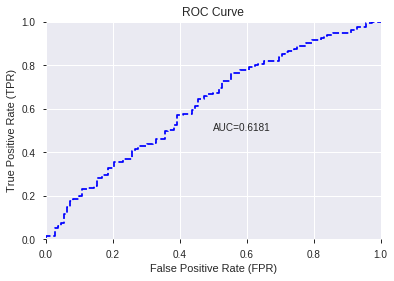

This function is available for GLM models only


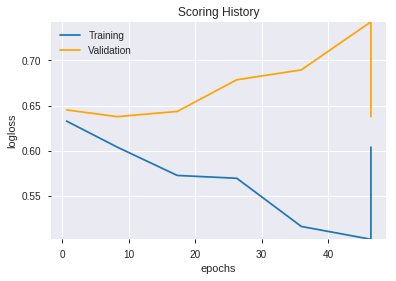

--2019-08-24 18:03:03--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.169.243
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.169.243|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


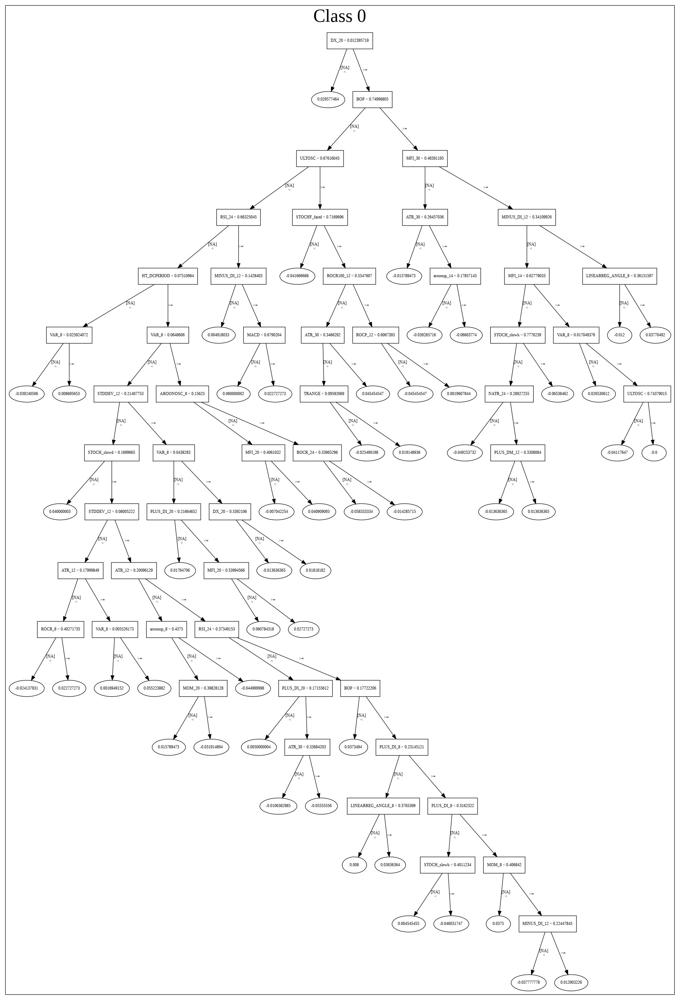

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_175413_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_175413_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'SUB',
 'CDLCLOSINGMARUBOZU',
 'MINUS_DI_8',
 'DIV',
 'weekday_name',
 'CCI_8',
 'ULTOSC',
 'day',
 'DX_8',
 'CORREL_8',
 'ADXR_12',
 'weekday',
 'aroondown_24',
 'CDLLONGLINE',
 'BETA_30',
 'DX_30',
 'CDLENGULFING',
 'dayofweek',
 'HT_DCPERIOD',
 'STOCH_slowd',
 'aroondown_20',
 'CORREL_14',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'dayofyear',
 'SAREXT',
 'CDLLONGLEGGEDDOJI',
 'HT_TRENDMODE',
 'CDL3OUTSIDE',
 'CDLHAMMER',
 'days_in_month',
 'CDLEVENINGDOJISTAR',
 'TRANGE',
 'CDLDOJI',
 'month',
 'aroondown_8',
 'weekofyear',
 'CDLUPSIDEGAP2CROWS',
 'WILLR_14',
 'quarter',
 'CDLBELTHOLD',
 'CDLSHOOTINGSTAR',
 'CDL3LINESTRIKE',
 'CDLEVENINGSTAR',
 'CORREL_30',
 'week',
 'CORREL_24',
 'CDLPIERCING',
 'CDLSTICKSANDWICH']

In [20]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_180315_model_1,0.625,0.677454,0.447851,0.489685,0.239792


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.320831,1.000000,0.092889
1,MINUS_DI_8,0.208426,0.649643,0.060345
2,CDLCLOSINGMARUBOZU,0.207663,0.647265,0.060124
3,SUB,0.196235,0.611645,0.056815
4,CCI_8,0.192331,0.599477,0.055685
5,CDLENGULFING,0.115868,0.361151,0.033547
6,DIV,0.113981,0.355269,0.033001
7,STOCHF_fastk,0.110477,0.344345,0.031986
8,CDLHAMMER,0.110207,0.343505,0.031908
9,STOCHRSI_fastk,0.107758,0.335871,0.031199


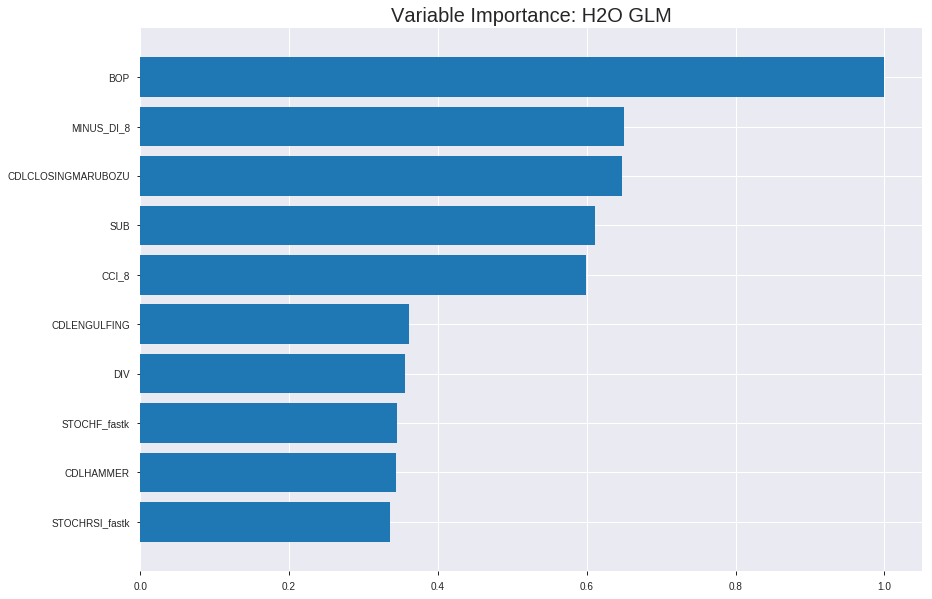

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_180315_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.20838262025290902
RMSE: 0.45648945251003226
LogLoss: 0.6037527689291707
Null degrees of freedom: 1723
Residual degrees of freedom: 1673
Null deviance: 2387.7412993239195
Residual deviance: 2081.739547267781
AIC: 2183.739547267781
AUC: 0.7355396903041843
pr_auc: 0.6989714009316351
Gini: 0.4710793806083686
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3715835548598031: 


,0,1,Error,Rate
0,379.0,514.0,0.5756,(514.0/893.0)
1,87.0,744.0,0.1047,(87.0/831.0)
Total,466.0,1258.0,0.3486,(601.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3715836,0.7123025,269.0
max f2,0.2400311,0.8343609,335.0
max f0point5,0.5525783,0.6625623,155.0
max accuracy,0.4218883,0.6745940,238.0
max precision,0.9512859,1.0,0.0
max recall,0.0555319,1.0,395.0
max specificity,0.9512859,1.0,0.0
max absolute_mcc,0.4073152,0.3736416,246.0
max min_per_class_accuracy,0.4943979,0.6674132,194.0
max mean_per_class_accuracy,0.4218883,0.6797494,238.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 48.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.8383344,1.8440968,1.8440968,0.8888889,0.8728511,0.8888889,0.8728511,0.0192539,0.0192539,84.4096804,84.4096804
,2,0.0203016,0.8136830,1.8305373,1.8375107,0.8823529,0.8238210,0.8857143,0.8490365,0.0180505,0.0373045,83.0537269,83.7510744
,3,0.0301624,0.7963659,1.7085015,1.7953346,0.8235294,0.8041951,0.8653846,0.8343768,0.0168472,0.0541516,70.8501451,79.5334629
,4,0.0400232,0.7777862,1.7085015,1.7739409,0.8235294,0.7865461,0.8550725,0.8225924,0.0168472,0.0709988,70.8501451,77.3940948
,5,0.0504640,0.7680543,1.6135847,1.7407638,0.7777778,0.7733746,0.8390805,0.8124094,0.0168472,0.0878460,61.3584704,74.0763794
,6,0.1003480,0.7012138,1.5921417,1.6668823,0.7674419,0.7316987,0.8034682,0.7722873,0.0794224,0.1672684,59.2141718,66.6882299
,7,0.1502320,0.6649662,1.4232782,1.5859945,0.6860465,0.6812910,0.7644788,0.7420723,0.0709988,0.2382671,42.3278202,58.5994452
,8,0.2001160,0.6398385,1.2785380,1.5093531,0.6162791,0.6516497,0.7275362,0.7195322,0.0637786,0.3020457,27.8538046,50.9353145
,9,0.2998840,0.5891899,1.3870932,1.4686786,0.6686047,0.6132876,0.7079304,0.6841858,0.1383875,0.4404332,38.7093163,46.8678644
,10,0.4002320,0.5419960,1.2591557,1.4161461,0.6069364,0.5639226,0.6826087,0.6540329,0.1263538,0.5667870,25.9155694,41.6146079




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.21232125412507305
RMSE: 0.46078330495480524
LogLoss: 0.6154837997744768
Null degrees of freedom: 491
Residual degrees of freedom: 441
Null deviance: 681.9739872837306
Residual deviance: 605.6360589780851
AIC: 707.6360589780851
AUC: 0.7295713411912516
pr_auc: 0.6886879223422457
Gini: 0.4591426823825031
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.31442073422519834: 


,0,1,Error,Rate
0,70.0,181.0,0.7211,(181.0/251.0)
1,12.0,229.0,0.0498,(12.0/241.0)
Total,82.0,410.0,0.3923,(193.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3144207,0.7035330,325.0
max f2,0.2537942,0.8392603,351.0
max f0point5,0.5874375,0.6889128,135.0
max accuracy,0.5099155,0.6849593,199.0
max precision,0.7367482,0.8095238,38.0
max recall,0.0405878,1.0,398.0
max specificity,0.9025029,0.9960159,0.0
max absolute_mcc,0.5874375,0.3730254,135.0
max min_per_class_accuracy,0.5171733,0.6812749,191.0
max mean_per_class_accuracy,0.5061238,0.6854491,200.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 50.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.8572508,1.2248963,1.2248963,0.6,0.8879080,0.6,0.8879080,0.0124481,0.0124481,22.4896266,22.4896266
,2,0.0203252,0.8197931,1.6331950,1.4290456,0.8,0.8329764,0.7,0.8604422,0.0165975,0.0290456,63.3195021,42.9045643
,3,0.0304878,0.8015165,1.2248963,1.3609959,0.6,0.8096961,0.6666667,0.8435268,0.0124481,0.0414938,22.4896266,36.0995851
,4,0.0406504,0.7868907,1.6331950,1.4290456,0.8,0.7947964,0.7,0.8313442,0.0165975,0.0580913,63.3195021,42.9045643
,5,0.0508130,0.7731415,2.0414938,1.5515353,1.0,0.7805610,0.76,0.8211876,0.0207469,0.0788382,104.1493776,55.1535270
,6,0.1016260,0.7077999,1.6331950,1.5923651,0.8,0.7419342,0.78,0.7815609,0.0829876,0.1618257,63.3195021,59.2365145
,7,0.1504065,0.6831923,1.5311203,1.5725020,0.75,0.6908071,0.7702703,0.7521272,0.0746888,0.2365145,53.1120332,57.2501963
,8,0.2012195,0.6500766,1.4698755,1.5465862,0.72,0.6644443,0.7575758,0.7299851,0.0746888,0.3112033,46.9875519,54.6586194
,9,0.3008130,0.6034431,1.4165467,1.5035326,0.6938776,0.6269112,0.7364865,0.6958592,0.1410788,0.4522822,41.6546702,50.3532578
,10,0.4004065,0.5648624,1.2082310,1.4300819,0.5918367,0.5864831,0.7005076,0.6686540,0.1203320,0.5726141,20.8231010,43.0081934



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 18:03:15,0.000 sec,2,.15E2,51,1.3720094,1.3718894
,2019-08-24 18:03:15,0.012 sec,4,.93E1,51,1.3650811,1.3643854
,2019-08-24 18:03:15,0.025 sec,6,.58E1,51,1.3552023,1.3537808
,2019-08-24 18:03:15,0.037 sec,8,.36E1,51,1.3418959,1.3397186
,2019-08-24 18:03:15,0.049 sec,10,.22E1,51,1.3252363,1.3224782
,2019-08-24 18:03:15,0.061 sec,12,.14E1,51,1.3061431,1.3032652
,2019-08-24 18:03:15,0.073 sec,14,.86E0,51,1.2862241,1.2840012
,2019-08-24 18:03:15,0.085 sec,16,.53E0,51,1.2672246,1.2666245
,2019-08-24 18:03:15,0.097 sec,18,.33E0,51,1.2503649,1.2524932
,2019-08-24 18:03:15,0.109 sec,20,.21E0,51,1.2361107,1.2421175


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6234817813765182)

('F1', 0.7217630853994491)

('auc', 0.625)

('logloss', 0.6774536709587837)

('mean_per_class_error', 0.3912037037037037)

('rmse', 0.4896851737063297)

('mse', 0.2397915693477983)

glm prediction progress: |████████████████████████████████████████████████| 100%


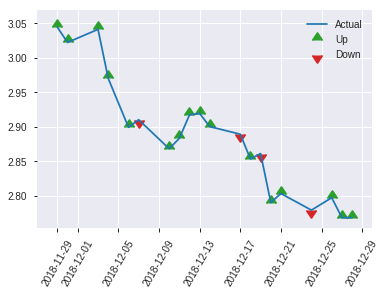


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2397915693477983
RMSE: 0.4896851737063297
LogLoss: 0.6774536709587837
Null degrees of freedom: 246
Residual degrees of freedom: 196
Null deviance: 344.38937217717034
Residual deviance: 334.6621134536391
AIC: 436.6621134536391
AUC: 0.625
pr_auc: 0.6360277561574549
Gini: 0.25
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24636204911565818: 


,0,1,Error,Rate
0,15.0,97.0,0.8661,(97.0/112.0)
1,4.0,131.0,0.0296,(4.0/135.0)
Total,19.0,228.0,0.4089,(101.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2463620,0.7217631,227.0
max f2,0.0577183,0.8587786,245.0
max f0point5,0.4384573,0.6491228,179.0
max accuracy,0.4384573,0.6234818,179.0
max precision,0.8417985,1.0,0.0
max recall,0.0577183,1.0,245.0
max specificity,0.8417985,1.0,0.0
max absolute_mcc,0.4362223,0.2313407,181.0
max min_per_class_accuracy,0.5631840,0.5925926,121.0
max mean_per_class_accuracy,0.5631840,0.6087963,121.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 53.12 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.8278540,1.2197531,1.2197531,0.6666667,0.8376481,0.6666667,0.8376481,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.8134628,0.9148148,1.0977778,0.5,0.8185352,0.6,0.8300030,0.0074074,0.0222222,-8.5185185,9.7777778
,3,0.0323887,0.8092675,1.2197531,1.1435185,0.6666667,0.8126145,0.625,0.8234823,0.0148148,0.0370370,21.9753086,14.3518519
,4,0.0404858,0.7971481,0.9148148,1.0977778,0.5,0.8055378,0.6,0.8198934,0.0074074,0.0444444,-8.5185185,9.7777778
,5,0.0526316,0.7772260,1.8296296,1.2666667,1.0,0.7839758,0.6923077,0.8116047,0.0222222,0.0666667,82.9629630,26.6666667
,6,0.1012146,0.7339771,1.5246914,1.3905185,0.8333333,0.7509129,0.76,0.7824727,0.0740741,0.1407407,52.4691358,39.0518519
,7,0.1497976,0.7077546,1.0672840,1.2856857,0.5833333,0.7199732,0.7027027,0.7622026,0.0518519,0.1925926,6.7283951,28.5685686
,8,0.2024291,0.6737215,1.4074074,1.3173333,0.7692308,0.6855737,0.72,0.7422791,0.0740741,0.2666667,40.7407407,31.7333333
,9,0.2995951,0.6357769,0.6861111,1.1126126,0.375,0.6564551,0.6081081,0.7144443,0.0666667,0.3333333,-31.3888889,11.2612613
,10,0.4008097,0.5948289,1.3905185,1.1827909,0.76,0.6121812,0.6464646,0.6886203,0.1407407,0.4740741,39.0518519,18.2790872


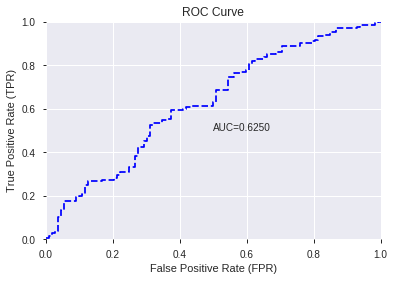

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


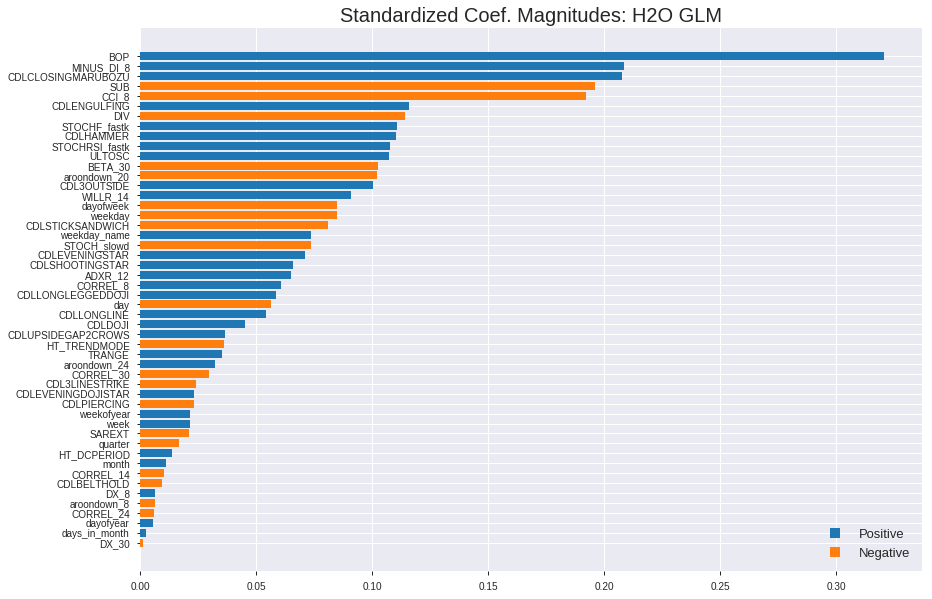

'log_likelihood'
--2019-08-24 18:03:20--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.92.123
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.92.123|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


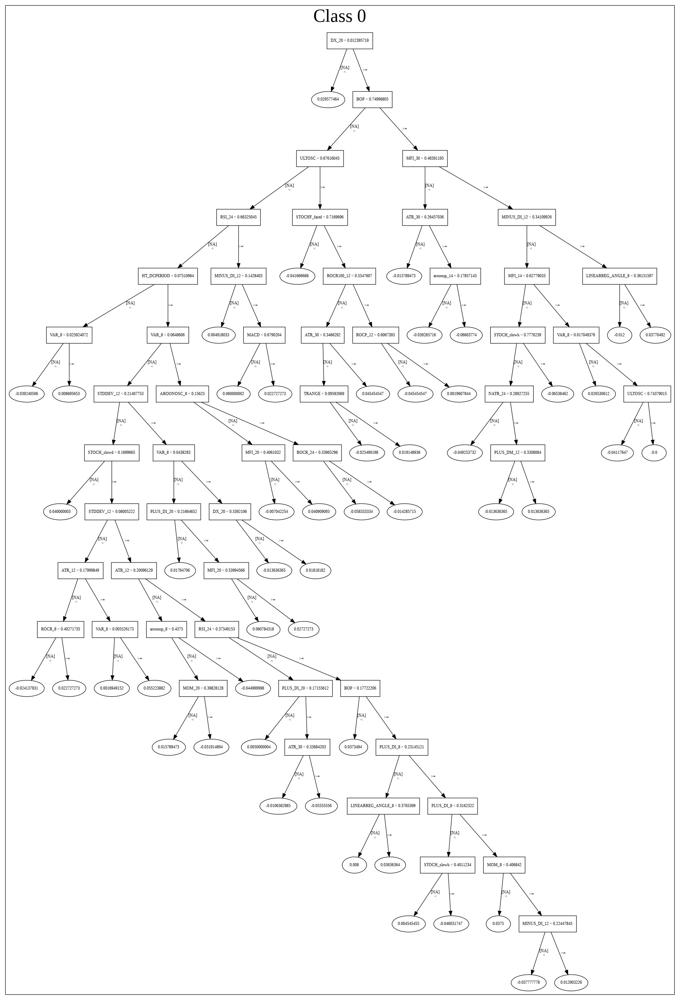

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_180315_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_180315_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_58_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_58_s

['BOP',
 'MINUS_DI_8',
 'CDLCLOSINGMARUBOZU',
 'SUB',
 'CCI_8',
 'CDLENGULFING',
 'DIV',
 'STOCHF_fastk',
 'CDLHAMMER',
 'STOCHRSI_fastk',
 'ULTOSC',
 'BETA_30',
 'aroondown_20',
 'CDL3OUTSIDE',
 'WILLR_14',
 'dayofweek',
 'weekday',
 'CDLSTICKSANDWICH',
 'weekday_name',
 'STOCH_slowd',
 'CDLEVENINGSTAR',
 'CDLSHOOTINGSTAR',
 'ADXR_12',
 'CORREL_8',
 'CDLLONGLEGGEDDOJI',
 'day',
 'CDLLONGLINE',
 'CDLDOJI',
 'CDLUPSIDEGAP2CROWS',
 'HT_TRENDMODE',
 'TRANGE',
 'aroondown_24',
 'CORREL_30',
 'CDL3LINESTRIKE',
 'CDLEVENINGDOJISTAR',
 'CDLPIERCING',
 'weekofyear',
 'week',
 'SAREXT',
 'quarter',
 'HT_DCPERIOD',
 'month',
 'CORREL_14',
 'CDLBELTHOLD',
 'DX_8',
 'aroondown_8',
 'CORREL_24',
 'dayofyear',
 'days_in_month',
 'DX_30']

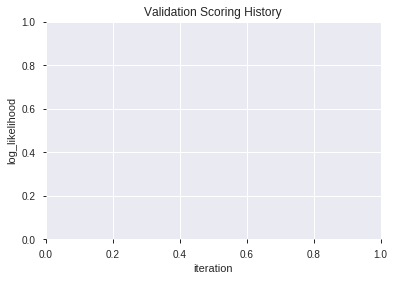

In [21]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190824_180329_model_2,0.622884,0.662377,0.394180,0.484950,0.235177
1,XGBoost_grid_1_AutoML_20190824_180329_model_4,0.616534,0.663293,0.414980,0.485446,0.235658
2,XGBoost_2_AutoML_20190824_180329,0.614550,0.669702,0.384392,0.488672,0.238800
3,XGBoost_1_AutoML_20190824_180329,0.611839,0.673412,0.463525,0.489975,0.240075
4,XGBoost_grid_1_AutoML_20190824_180329_model_3,0.609193,0.670479,0.423247,0.488997,0.239118
5,XGBoost_grid_1_AutoML_20190824_180329_model_7,0.604497,0.675048,0.448611,0.490882,0.240966
6,XGBoost_grid_1_AutoML_20190824_180329_model_6,0.598280,0.676075,0.418022,0.491656,0.241726
7,XGBoost_grid_1_AutoML_20190824_180329_model_1,0.591336,0.671168,0.444907,0.489998,0.240098
8,XGBoost_grid_1_AutoML_20190824_180329_model_5,0.589087,0.693857,0.456779,0.498800,0.248801
9,XGBoost_3_AutoML_20190824_180329,0.588757,0.676069,0.398545,0.492069,0.242132


,variable,relative_importance,scaled_importance,percentage
0,BOP,1524.949707,1.000000,0.220950
1,SUB,530.653748,0.347981,0.076887
2,DIV,422.184875,0.276852,0.061170
3,BETA_30,286.319916,0.187757,0.041485
4,ULTOSC,270.321716,0.177266,0.039167
5,ADXR_12,258.353149,0.169417,0.037433
6,MINUS_DI_8,246.605087,0.161714,0.035731
7,dayofweek,229.144806,0.150264,0.033201
8,STOCH_slowd,215.746323,0.141478,0.031260
9,CCI_8,204.225967,0.133923,0.029590


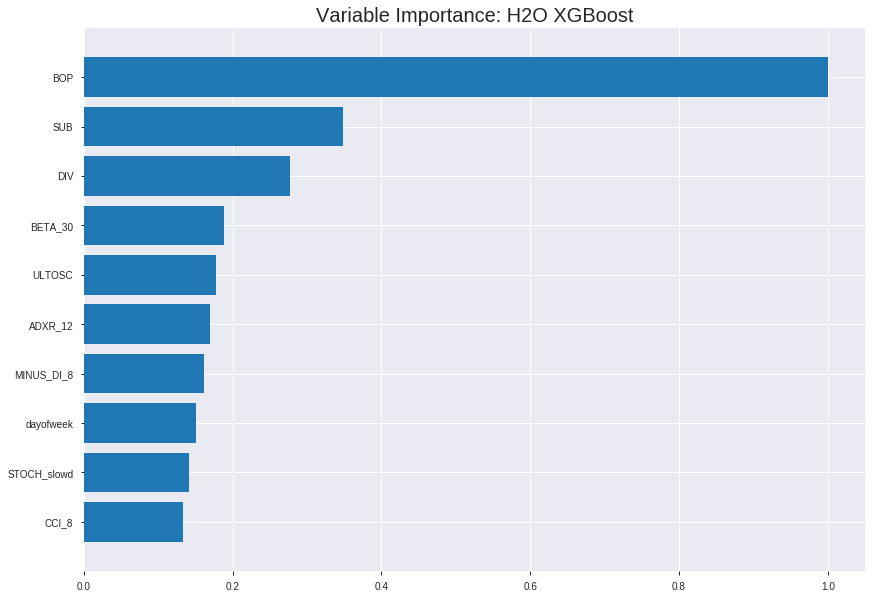

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190824_180329_model_2


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16960772261869395
RMSE: 0.4118345816206963
LogLoss: 0.5200357973093795
Mean Per-Class Error: 0.2103322674148309
AUC: 0.8738193706094871
pr_auc: 0.8707166342510644
Gini: 0.7476387412189742
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49302051961421967: 


,0,1,Error,Rate
0,678.0,215.0,0.2408,(215.0/893.0)
1,151.0,680.0,0.1817,(151.0/831.0)
Total,829.0,895.0,0.2123,(366.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4930205,0.7879490,190.0
max f2,0.3655899,0.8613171,269.0
max f0point5,0.5748060,0.8070926,133.0
max accuracy,0.5206582,0.7900232,172.0
max precision,0.8312148,1.0,0.0
max recall,0.1841238,1.0,361.0
max specificity,0.8312148,1.0,0.0
max absolute_mcc,0.5454967,0.5797498,154.0
max min_per_class_accuracy,0.5090026,0.7872340,180.0
max mean_per_class_accuracy,0.5161989,0.7896677,175.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 48.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.7926064,2.0746089,2.0746089,1.0,0.8066154,1.0,0.8066154,0.0216606,0.0216606,107.4608905,107.4608905
,2,0.0203016,0.7704502,2.0746089,2.0746089,1.0,0.7800220,1.0,0.7936986,0.0204573,0.0421179,107.4608905,107.4608905
,3,0.0301624,0.7585634,2.0746089,2.0746089,1.0,0.7658820,1.0,0.7846047,0.0204573,0.0625752,107.4608905,107.4608905
,4,0.0400232,0.7487738,2.0746089,2.0746089,1.0,0.7535258,1.0,0.7769476,0.0204573,0.0830325,107.4608905,107.4608905
,5,0.0504640,0.7324991,1.9593529,2.0507628,0.9444444,0.7414380,0.9885057,0.7696008,0.0204573,0.1034898,95.9352855,105.0762826
,6,0.1003480,0.6995487,2.0022388,2.0266411,0.9651163,0.7149410,0.9768786,0.7424289,0.0998797,0.2033694,100.2238827,102.6641069
,7,0.1502320,0.6716978,1.9539921,2.0025182,0.9418605,0.6843335,0.9652510,0.7231385,0.0974729,0.3008424,95.3992108,100.2518248
,8,0.2001160,0.6468575,1.9057454,1.9783952,0.9186047,0.6587876,0.9536232,0.7070974,0.0950662,0.3959085,90.5745389,97.8395159
,9,0.2998840,0.6012392,1.5680184,1.8418675,0.7558140,0.6228895,0.8878143,0.6790824,0.1564380,0.5523466,56.8018358,84.1867480
,10,0.4002320,0.5533926,1.3550914,1.7198207,0.6531792,0.5762171,0.8289855,0.6532916,0.1359807,0.6883273,35.5091366,71.9820715




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.21963097548744945
RMSE: 0.46864802942874884
LogLoss: 0.6299507739698602
Mean Per-Class Error: 0.3233538873551437
AUC: 0.7067662958126002
pr_auc: 0.6423731379347081
Gini: 0.4135325916252004
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4595556855201721: 


,0,1,Error,Rate
0,115.0,136.0,0.5418,(136.0/251.0)
1,33.0,208.0,0.1369,(33.0/241.0)
Total,148.0,344.0,0.3435,(169.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4595557,0.7111111,267.0
max f2,0.2595201,0.8374384,366.0
max f0point5,0.5195807,0.6623770,216.0
max accuracy,0.5082744,0.6747967,228.0
max precision,0.7959056,1.0,0.0
max recall,0.1621444,1.0,397.0
max specificity,0.7959056,1.0,0.0
max absolute_mcc,0.5059598,0.3587422,230.0
max min_per_class_accuracy,0.5395793,0.6533865,196.0
max mean_per_class_accuracy,0.5059598,0.6766461,230.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 51.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.7806164,1.6331950,1.6331950,0.8,0.7886535,0.8,0.7886535,0.0165975,0.0165975,63.3195021,63.3195021
,2,0.0203252,0.7579000,0.8165975,1.2248963,0.4,0.7682598,0.6,0.7784566,0.0082988,0.0248963,-18.3402490,22.4896266
,3,0.0304878,0.7454243,1.2248963,1.2248963,0.6,0.7521137,0.6,0.7696757,0.0124481,0.0373444,22.4896266,22.4896266
,4,0.0406504,0.7364633,1.6331950,1.3269710,0.8,0.7406225,0.65,0.7624124,0.0165975,0.0539419,63.3195021,32.6970954
,5,0.0508130,0.7276076,0.8165975,1.2248963,0.4,0.7332525,0.6,0.7565804,0.0082988,0.0622407,-18.3402490,22.4896266
,6,0.1016260,0.6916046,1.3065560,1.2657261,0.64,0.7089618,0.62,0.7327711,0.0663900,0.1286307,30.6556017,26.5726141
,7,0.1504065,0.6629920,1.5311203,1.3517999,0.75,0.6772496,0.6621622,0.7147641,0.0746888,0.2033195,53.1120332,35.1799933
,8,0.2012195,0.6386391,1.7148548,1.4434804,0.84,0.6503291,0.7070707,0.6984926,0.0871369,0.2904564,71.4854772,44.3480448
,9,0.3008130,0.6015032,1.2082310,1.3655938,0.5918367,0.6171204,0.6689189,0.6715518,0.1203320,0.4107884,20.8231010,36.5593810
,10,0.4004065,0.5714447,1.3748836,1.3679045,0.6734694,0.5860454,0.6700508,0.6502837,0.1369295,0.5477178,37.4883563,36.7904459



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 18:03:33,0.683 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5179814,0.5,0.6931472,0.5,0.0,1.0,0.5101626
,2019-08-24 18:03:33,0.773 sec,5.0,0.4829517,0.6595098,0.7983500,0.7566081,2.0005157,0.2720418,0.4909135,0.6750753,0.6798615,0.6140175,1.2248963,0.3780488
,2019-08-24 18:03:33,0.839 sec,10.0,0.4695288,0.6333976,0.8071584,0.7720304,1.9844085,0.2819026,0.4839074,0.6611606,0.6967400,0.6372343,1.3609959,0.3699187
,2019-08-24 18:03:34,0.909 sec,15.0,0.4589025,0.6127250,0.8178694,0.7949653,2.0746089,0.2743619,0.4788679,0.6510746,0.7037245,0.6431944,1.6331950,0.3414634
,2019-08-24 18:03:34,0.982 sec,20.0,0.4504453,0.5961430,0.8248208,0.8096245,2.0746089,0.2679814,0.4759467,0.6451768,0.7045924,0.6423946,1.6331950,0.3333333
,2019-08-24 18:03:34,1.048 sec,25.0,0.4434088,0.5823484,0.8351229,0.8218583,2.0746089,0.2511601,0.4742951,0.6417946,0.7056670,0.6404091,1.6331950,0.3739837
,2019-08-24 18:03:34,1.102 sec,30.0,0.4368321,0.5694184,0.8435849,0.8352567,2.0746089,0.2418794,0.4728119,0.6387636,0.7070308,0.6390889,1.2248963,0.3577236
,2019-08-24 18:03:34,1.175 sec,35.0,0.4310599,0.5579882,0.8500296,0.8409971,2.0746089,0.2436195,0.4709939,0.6350488,0.7090559,0.6399795,1.2248963,0.3678862
,2019-08-24 18:03:34,1.234 sec,40.0,0.4261841,0.5482415,0.8560444,0.8490111,2.0746089,0.2343387,0.4704850,0.6339757,0.7078904,0.6397713,1.2248963,0.3739837
,2019-08-24 18:03:34,1.294 sec,45.0,0.4212673,0.5385076,0.8616152,0.8560579,2.0746089,0.2349188,0.4701365,0.6330777,0.7048900,0.6355189,1.2248963,0.3434959


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1524.9497070,1.0,0.2209504
SUB,530.6537476,0.3479811,0.0768866
DIV,422.1848755,0.2768517,0.0611705
BETA_30,286.3199158,0.1877570,0.0414850
ULTOSC,270.3217163,0.1772660,0.0391670
---,---,---,---
days_in_month,11.6991873,0.0076719,0.0016951
CDLHAMMER,7.1222363,0.0046705,0.0010319
HT_TRENDMODE,6.3737631,0.0041797,0.0009235
weekofyear,1.8876601,0.0012379,0.0002735



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6396761133603239)

('F1', 0.7352941176470589)

('auc', 0.6228835978835978)

('logloss', 0.662377038403334)

('mean_per_class_error', 0.3881944444444445)

('rmse', 0.4849502139648824)

('mse', 0.23517671002458526)

xgboost prediction progress: |████████████████████████████████████████████| 100%


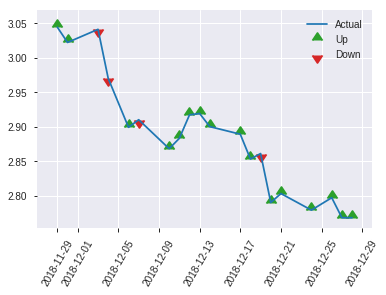


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.23517671002458526
RMSE: 0.4849502139648824
LogLoss: 0.662377038403334
Mean Per-Class Error: 0.3881944444444445
AUC: 0.6228835978835978
pr_auc: 0.6499837491834779
Gini: 0.24576719576719563
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43982619047164917: 


,0,1,Error,Rate
0,32.0,80.0,0.7143,(80.0/112.0)
1,10.0,125.0,0.0741,(10.0/135.0)
Total,42.0,205.0,0.3644,(90.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4398262,0.7352941,204.0
max f2,0.2674770,0.8609694,243.0
max f0point5,0.4451444,0.6577540,199.0
max accuracy,0.4451444,0.6396761,199.0
max precision,0.7318996,0.875,7.0
max recall,0.2674770,1.0,243.0
max specificity,0.7940953,0.9910714,0.0
max absolute_mcc,0.4451444,0.2835994,199.0
max min_per_class_accuracy,0.5458059,0.5625,124.0
max mean_per_class_accuracy,0.4451444,0.6118056,199.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 54.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7612246,1.2197531,1.2197531,0.6666667,0.7845050,0.6666667,0.7845050,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.7379468,1.8296296,1.4637037,1.0,0.7453700,0.8,0.7688510,0.0148148,0.0296296,82.9629630,46.3703704
,3,0.0323887,0.7291583,1.8296296,1.6009259,1.0,0.7341634,0.875,0.7558432,0.0222222,0.0518519,82.9629630,60.0925926
,4,0.0404858,0.7162765,0.9148148,1.4637037,0.5,0.7216991,0.8,0.7490143,0.0074074,0.0592593,-8.5185185,46.3703704
,5,0.0526316,0.7072348,1.8296296,1.5481481,1.0,0.7121660,0.8461538,0.7405109,0.0222222,0.0814815,82.9629630,54.8148148
,6,0.1012146,0.6807897,1.0672840,1.3173333,0.5833333,0.6949161,0.72,0.7186254,0.0518519,0.1333333,6.7283951,31.7333333
,7,0.1497976,0.6708929,1.6771605,1.4340340,0.9166667,0.6755771,0.7837838,0.7046638,0.0814815,0.2148148,67.7160494,43.4034034
,8,0.2024291,0.6486763,0.8444444,1.2807407,0.4615385,0.6615833,0.7,0.6934628,0.0444444,0.2592593,-15.5555556,28.0740741
,9,0.2995951,0.6210606,1.1435185,1.2362362,0.625,0.6350153,0.6756757,0.6745069,0.1111111,0.3703704,14.3518519,23.6236236
,10,0.4008097,0.5931612,0.8050370,1.1273475,0.44,0.6064447,0.6161616,0.6573195,0.0814815,0.4518519,-19.4962963,12.7347550


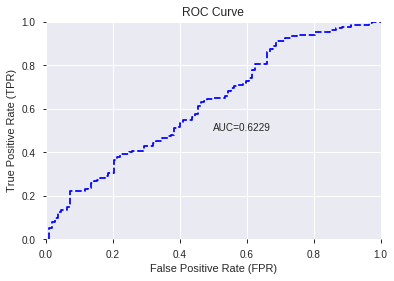

This function is available for GLM models only


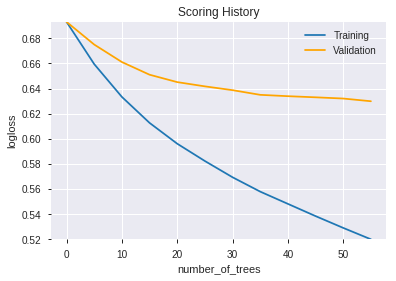

--2019-08-24 18:03:45--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.104.179
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.104.179|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

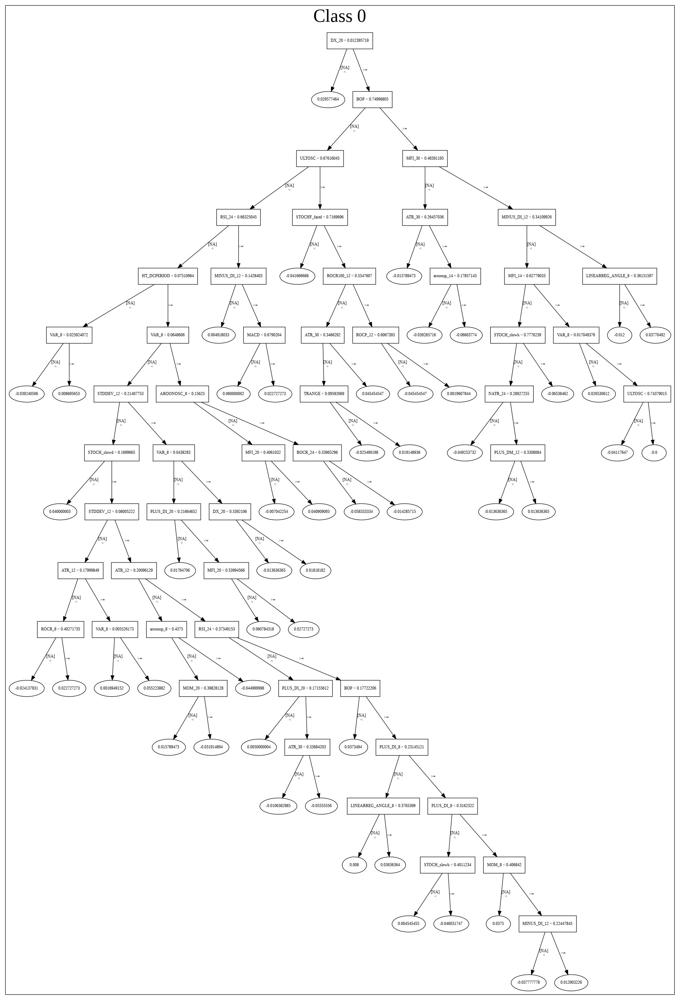

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190824_180329_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190824_180329_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_66_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'SUB',
 'DIV',
 'BETA_30',
 'ULTOSC',
 'ADXR_12',
 'MINUS_DI_8',
 'dayofweek',
 'STOCH_slowd',
 'CCI_8',
 'WILLR_14',
 'DX_8',
 'DX_30',
 'day',
 'TRANGE',
 'CDLCLOSINGMARUBOZU',
 'SAREXT',
 'STOCHF_fastk',
 'CORREL_30',
 'CORREL_24',
 'STOCHRSI_fastk',
 'CORREL_14',
 'HT_DCPERIOD',
 'dayofyear',
 'CORREL_8',
 'weekday_name',
 'aroondown_20',
 'week',
 'weekday',
 'aroondown_24',
 'aroondown_8',
 'CDLLONGLINE',
 'days_in_month',
 'CDLHAMMER',
 'HT_TRENDMODE',
 'weekofyear',
 'month']

In [22]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del xgb_features,glm_features,dl_features
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [24]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [25]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [26]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [28]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [29]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [30]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [32]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [33]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [34]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [36]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [37]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [38]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [40]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [41]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [42]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [44]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [45]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [46]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [47]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [882 923] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


13

['dayofweek',
 'weekday',
 'BOP',
 'WILLR_8',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLENGULFING',
 'CDLLONGLINE',
 'CDLMARUBOZU',
 'DIV',
 'SUB']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_180352_model_8,0.664749,0.672757,0.398743,0.488014,0.238158
1,DeepLearning_grid_1_AutoML_20190824_180352_model_9,0.662169,0.648043,0.440443,0.478151,0.228628
2,DeepLearning_grid_1_AutoML_20190824_180352_model_6,0.650397,0.646539,0.445668,0.477996,0.228480
3,DeepLearning_grid_1_AutoML_20190824_180352_model_7,0.621362,0.685561,0.403770,0.494531,0.244561
4,DeepLearning_1_AutoML_20190824_180352,0.615013,0.667597,0.425529,0.486544,0.236725
5,DeepLearning_grid_1_AutoML_20190824_180352_model_5,0.609358,0.665615,0.438161,0.486497,0.236679
6,DeepLearning_grid_1_AutoML_20190824_180352_model_3,0.599074,0.743892,0.454497,0.506058,0.256094
7,DeepLearning_grid_1_AutoML_20190824_180352_model_1,0.584325,0.815939,0.436541,0.515432,0.265670
8,DeepLearning_grid_1_AutoML_20190824_180352_model_4,0.567989,0.738393,0.472454,0.512288,0.262438
9,DeepLearning_grid_1_AutoML_20190824_180352_model_2,0.546098,0.723697,0.473214,0.510903,0.261022


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.086765
1,CDLLONGLINE,0.935887,0.935887,0.081203
2,SUB,0.924464,0.924464,0.080212
3,weekday,0.901855,0.901855,0.078250
4,dayofweek,0.896213,0.896213,0.077760
5,CDLCLOSINGMARUBOZU,0.894268,0.894268,0.077592
6,CDLBELTHOLD,0.890056,0.890056,0.077226
7,STOCHF_fastk,0.886922,0.886922,0.076954
8,CDLENGULFING,0.868437,0.868437,0.075350
9,DIV,0.846722,0.846722,0.073466


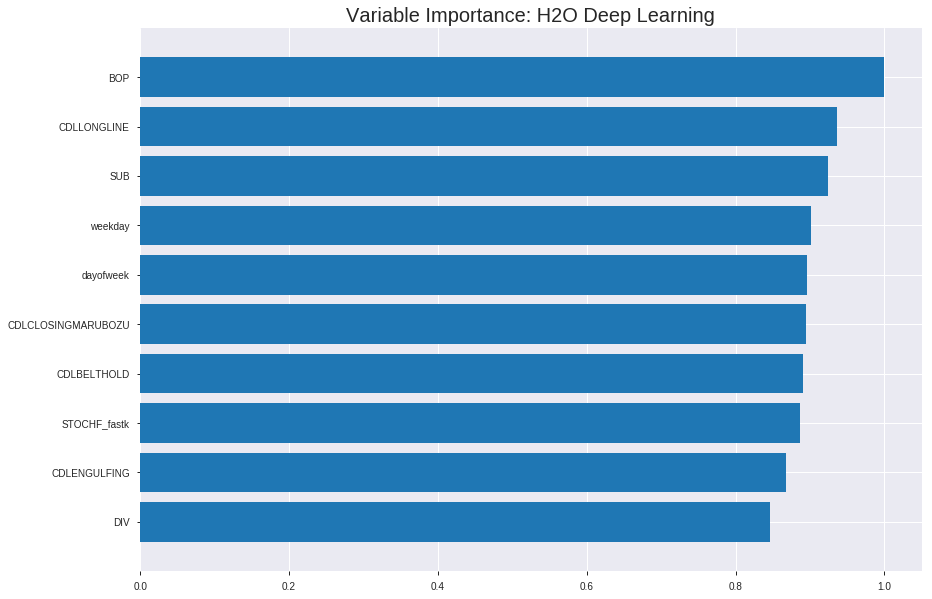

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_180352_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.22611174834492795
RMSE: 0.47551209064010974
LogLoss: 0.6483105886067394
Mean Per-Class Error: 0.3525575980045359
AUC: 0.6970359110773323
pr_auc: 0.6579618207480106
Gini: 0.39407182215466463
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.22195953188844053: 


,0,1,Error,Rate
0,297.0,596.0,0.6674,(596.0/893.0)
1,68.0,763.0,0.0818,(68.0/831.0)
Total,365.0,1359.0,0.3852,(664.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2219595,0.6968037,307.0
max f2,0.1439583,0.8266004,343.0
max f0point5,0.4126845,0.6300152,218.0
max accuracy,0.4126845,0.6438515,218.0
max precision,0.9350589,1.0,0.0
max recall,0.0245684,1.0,398.0
max specificity,0.9350589,1.0,0.0
max absolute_mcc,0.2219595,0.3067074,307.0
max min_per_class_accuracy,0.4600539,0.6405375,197.0
max mean_per_class_accuracy,0.3754863,0.6474424,235.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 45.41 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.9194057,1.8440968,1.8440968,0.8888889,0.9262268,0.8888889,0.9262268,0.0192539,0.0192539,84.4096804,84.4096804
,2,0.0203016,0.8935141,1.9525731,1.8967853,0.9411765,0.9098142,0.9142857,0.9182549,0.0192539,0.0385078,95.2573087,89.6785285
,3,0.0301624,0.8717927,1.5864656,1.7953346,0.7647059,0.8823410,0.8653846,0.9065138,0.0156438,0.0541516,58.6465633,79.5334629
,4,0.0400232,0.8540365,1.4644298,1.7138074,0.7058824,0.8620432,0.8260870,0.8955573,0.0144404,0.0685921,46.4429815,71.3807356
,5,0.0504640,0.8336172,1.4983287,1.6692256,0.7222222,0.8439273,0.8045977,0.8848752,0.0156438,0.0842359,49.8328654,66.9225556
,6,0.1003480,0.7823035,1.3750315,1.5229788,0.6627907,0.8061336,0.7341040,0.8457320,0.0685921,0.1528279,37.5031484,52.2978791
,7,0.1502320,0.7385227,1.5197716,1.5219139,0.7325581,0.7571974,0.7335907,0.8163344,0.0758123,0.2286402,51.9771640,52.1913868
,8,0.2001160,0.6979057,1.2061680,1.4432062,0.5813953,0.7193697,0.6956522,0.7921635,0.0601685,0.2888087,20.6167968,44.3206195
,9,0.2998840,0.6162906,1.2182296,1.3683591,0.5872093,0.6552421,0.6595745,0.7466113,0.1215403,0.4103490,21.8229648,36.8359065
,10,0.4002320,0.5362468,1.2231798,1.3319591,0.5895954,0.5770699,0.6420290,0.7041031,0.1227437,0.5330927,22.3179817,33.1959051




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.2168216731726911
RMSE: 0.4656411420532888
LogLoss: 0.6289551019095886
Mean Per-Class Error: 0.3315534542328611
AUC: 0.7200244664495544
pr_auc: 0.67815481066288
Gini: 0.44004893289910885
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33534494591675285: 


,0,1,Error,Rate
0,108.0,143.0,0.5697,(143.0/251.0)
1,35.0,206.0,0.1452,(35.0/241.0)
Total,143.0,349.0,0.3618,(178.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3353449,0.6983051,281.0
max f2,0.0742094,0.8379888,379.0
max f0point5,0.6054864,0.6731757,146.0
max accuracy,0.6054864,0.6707317,146.0
max precision,0.9368544,1.0,0.0
max recall,0.0488514,1.0,396.0
max specificity,0.9368544,1.0,0.0
max absolute_mcc,0.6054864,0.3479308,146.0
max min_per_class_accuracy,0.5027405,0.6533865,197.0
max mean_per_class_accuracy,0.5970419,0.6684465,150.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 49.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.9295805,1.2248963,1.2248963,0.6,0.9340765,0.6,0.9340765,0.0124481,0.0124481,22.4896266,22.4896266
,2,0.0203252,0.9112210,1.2248963,1.2248963,0.6,0.9257683,0.6,0.9299224,0.0124481,0.0248963,22.4896266,22.4896266
,3,0.0304878,0.8816120,1.6331950,1.3609959,0.8,0.8953133,0.6666667,0.9183860,0.0165975,0.0414938,63.3195021,36.0995851
,4,0.0406504,0.8668535,1.6331950,1.4290456,0.8,0.8743753,0.7,0.9073833,0.0165975,0.0580913,63.3195021,42.9045643
,5,0.0508130,0.8583649,1.6331950,1.4698755,0.8,0.8633073,0.72,0.8985681,0.0165975,0.0746888,63.3195021,46.9875519
,6,0.1016260,0.7964243,1.7148548,1.5923651,0.84,0.8227050,0.78,0.8606366,0.0871369,0.1618257,71.4854772,59.2365145
,7,0.1504065,0.7604165,1.7863071,1.6552652,0.875,0.7760451,0.8108108,0.8332015,0.0871369,0.2489627,78.6307054,65.5265224
,8,0.2012195,0.7306430,1.2248963,1.5465862,0.6,0.7434371,0.7575758,0.8105337,0.0622407,0.3112033,22.4896266,54.6586194
,9,0.3008130,0.6613400,1.2498941,1.4483571,0.6122449,0.6957027,0.7094595,0.7725154,0.1244813,0.4356846,24.9894149,44.8357071
,10,0.4004065,0.5747216,1.2915573,1.4093561,0.6326531,0.6226836,0.6903553,0.7352476,0.1286307,0.5643154,29.1557287,40.9356109



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 18:09:44,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 18:09:46,1 min 19.324 sec,639 obs/sec,0.6972158,1,1202.0,0.4755121,0.6483106,0.0943817,0.6970359,0.6579618,1.8440968,0.3851508,0.4656411,0.6289551,0.1323549,0.7200245,0.6781548,1.2248963,0.3617886
,2019-08-24 18:10:00,1 min 33.289 sec,1106 obs/sec,9.2824826,13,16003.0,0.4658720,0.6217325,0.1307287,0.7115222,0.6799243,2.0746089,0.3816705,0.4758552,0.6422337,0.0938729,0.6972855,0.6454401,1.2248963,0.3983740
,2019-08-24 18:10:15,1 min 47.965 sec,1148 obs/sec,18.5185615,26,31926.0,0.4669671,0.6234638,0.1266374,0.7160277,0.6784561,1.8440968,0.3886311,0.4809092,0.6576034,0.0745231,0.6984179,0.6451621,1.2248963,0.3739837
,2019-08-24 18:10:28,2 min 1.824 sec,1186 obs/sec,27.7627610,39,47863.0,0.4616350,0.6117822,0.1464687,0.7170047,0.6838282,2.0746089,0.3892111,0.4719566,0.6325454,0.1086598,0.7035592,0.6521622,1.2248963,0.3780488
,2019-08-24 18:10:42,2 min 15.577 sec,1234 obs/sec,37.7674014,53,65111.0,0.4642536,0.6164055,0.1367578,0.7232095,0.6869164,1.9593529,0.3509281,0.4814887,0.6545324,0.0722914,0.6787952,0.6163890,0.8165975,0.3800813
,2019-08-24 18:10:56,2 min 29.351 sec,1282 obs/sec,48.4854988,68,83589.0,0.4583255,0.6038737,0.1586629,0.7250557,0.6841206,1.8440968,0.3602088,0.4770807,0.6498688,0.0891997,0.6807707,0.6202350,1.2248963,0.3841463
,2019-08-24 18:10:57,2 min 30.764 sec,1281 obs/sec,48.4854988,68,83589.0,0.4755121,0.6483106,0.0943817,0.6970359,0.6579618,1.8440968,0.3851508,0.4656411,0.6289551,0.1323549,0.7200245,0.6781548,1.2248963,0.3617886


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0867655
CDLLONGLINE,0.9358874,0.9358874,0.0812027
SUB,0.9244641,0.9244641,0.0802116
weekday,0.9018552,0.9018552,0.0782499
dayofweek,0.8962126,0.8962126,0.0777603
CDLCLOSINGMARUBOZU,0.8942681,0.8942681,0.0775916
CDLBELTHOLD,0.8900560,0.8900560,0.0772262
STOCHF_fastk,0.8869225,0.8869225,0.0769543
CDLENGULFING,0.8684372,0.8684372,0.0753504
DIV,0.8467223,0.8467223,0.0734663


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6437246963562753)

('F1', 0.7443181818181818)

('auc', 0.6647486772486773)

('logloss', 0.6727566074338596)

('mean_per_class_error', 0.3616732804232804)

('rmse', 0.48801409881689284)

('mse', 0.23815776064406405)

deeplearning prediction progress: |███████████████████████████████████████| 100%


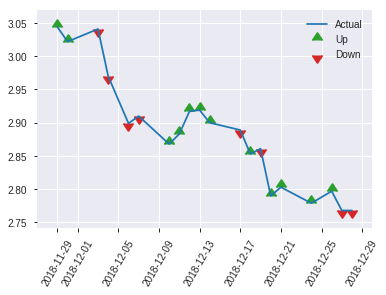


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.23815776064406405
RMSE: 0.48801409881689284
LogLoss: 0.6727566074338596
Mean Per-Class Error: 0.3616732804232804
AUC: 0.6647486772486773
pr_auc: 0.6879234473730126
Gini: 0.3294973544973545
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.1893168513843103: 


,0,1,Error,Rate
0,26.0,86.0,0.7679,(86.0/112.0)
1,4.0,131.0,0.0296,(4.0/135.0)
Total,30.0,217.0,0.3644,(90.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1893169,0.7443182,216.0
max f2,0.1256038,0.8690013,230.0
max f0point5,0.4870741,0.6723891,140.0
max accuracy,0.4870741,0.6437247,140.0
max precision,0.9304992,1.0,0.0
max recall,0.0605546,1.0,245.0
max specificity,0.9304992,1.0,0.0
max absolute_mcc,0.1893169,0.3086305,216.0
max min_per_class_accuracy,0.5572748,0.6222222,124.0
max mean_per_class_accuracy,0.4870741,0.6383267,140.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 52.27 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.9204439,1.8296296,1.8296296,1.0,0.9263077,1.0,0.9263077,0.0222222,0.0222222,82.9629630,82.9629630
,2,0.0202429,0.9035806,1.8296296,1.8296296,1.0,0.9190849,1.0,0.9234186,0.0148148,0.0370370,82.9629630,82.9629630
,3,0.0323887,0.8929999,1.8296296,1.8296296,1.0,0.8977169,1.0,0.9137805,0.0222222,0.0592593,82.9629630,82.9629630
,4,0.0404858,0.8802047,0.9148148,1.6466667,0.5,0.8869619,0.9,0.9084168,0.0074074,0.0666667,-8.5185185,64.6666667
,5,0.0526316,0.8736213,1.8296296,1.6888889,1.0,0.8769306,0.9230769,0.9011507,0.0222222,0.0888889,82.9629630,68.8888889
,6,0.1012146,0.8197024,0.7623457,1.2441481,0.4166667,0.8440902,0.68,0.8737617,0.0370370,0.1259259,-23.7654321,24.4148148
,7,0.1497976,0.7795683,1.2197531,1.2362362,0.6666667,0.7994747,0.6756757,0.8496686,0.0592593,0.1851852,21.9753086,23.6236236
,8,0.2024291,0.7627713,1.4074074,1.2807407,0.7692308,0.7708219,0.7,0.8291684,0.0740741,0.2592593,40.7407407,28.0740741
,9,0.2995951,0.7076653,1.4484568,1.3351351,0.7916667,0.7322004,0.7297297,0.7977193,0.1407407,0.4,44.8456790,33.5135135
,10,0.4008097,0.6292554,0.9514074,1.2382342,0.52,0.6657325,0.6767677,0.7643893,0.0962963,0.4962963,-4.8592593,23.8234194


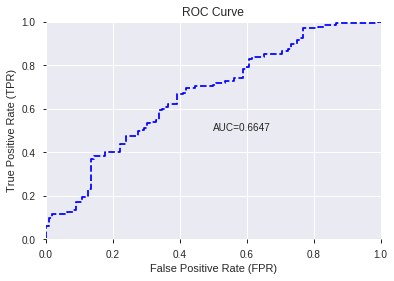

This function is available for GLM models only


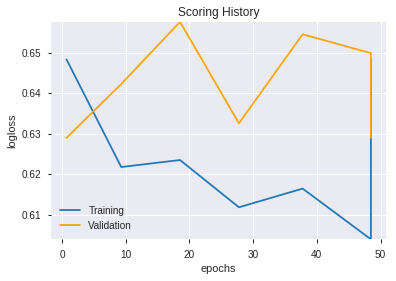

--2019-08-24 18:12:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.185.219
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.185.219|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


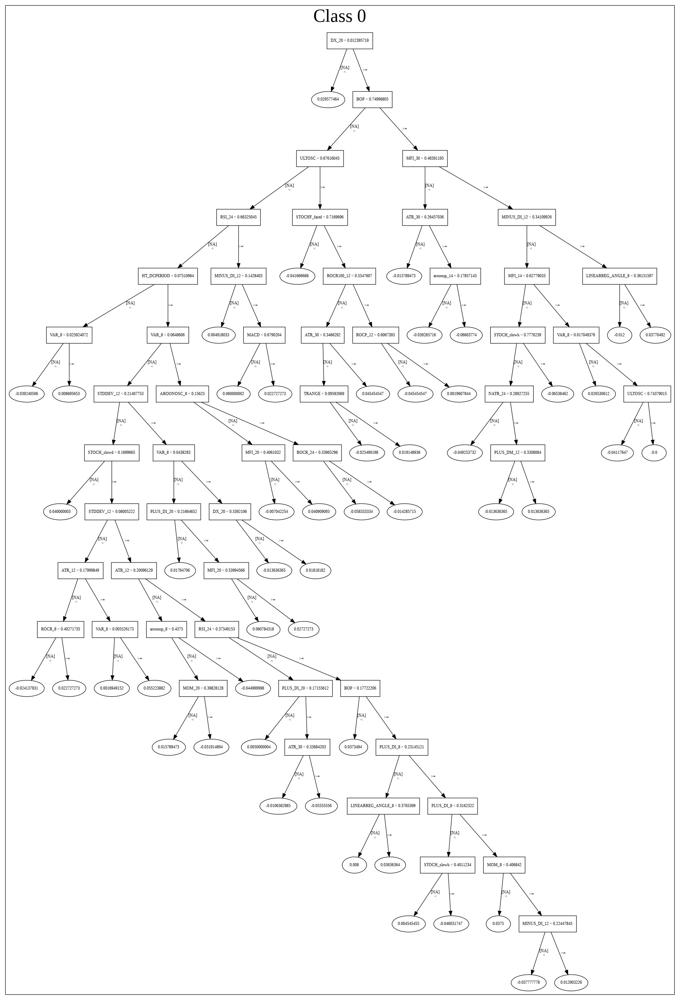

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_180352_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_180352_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_74_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLLONGLINE',
 'SUB',
 'weekday',
 'dayofweek',
 'CDLCLOSINGMARUBOZU',
 'CDLBELTHOLD',
 'STOCHF_fastk',
 'CDLENGULFING',
 'DIV',
 'CDLMARUBOZU',
 'WILLR_8',
 'STOCHRSI_fastk']

In [48]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_181240_model_1,0.663955,0.646362,0.42705,0.477106,0.22763


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.410648,1.000000,0.245109
1,CDLCLOSINGMARUBOZU,0.269674,0.656704,0.160964
2,SUB,0.228664,0.556838,0.136486
3,CDLENGULFING,0.130807,0.318538,0.078077
4,WILLR_8,0.112814,0.274723,0.067337
5,dayofweek,0.091165,0.222003,0.054415
6,weekday,0.090798,0.221109,0.054196
7,DIV,0.080320,0.195593,0.047942
8,STOCHF_fastk,0.077551,0.188851,0.046289
9,CDLLONGLINE,0.071005,0.172910,0.042382


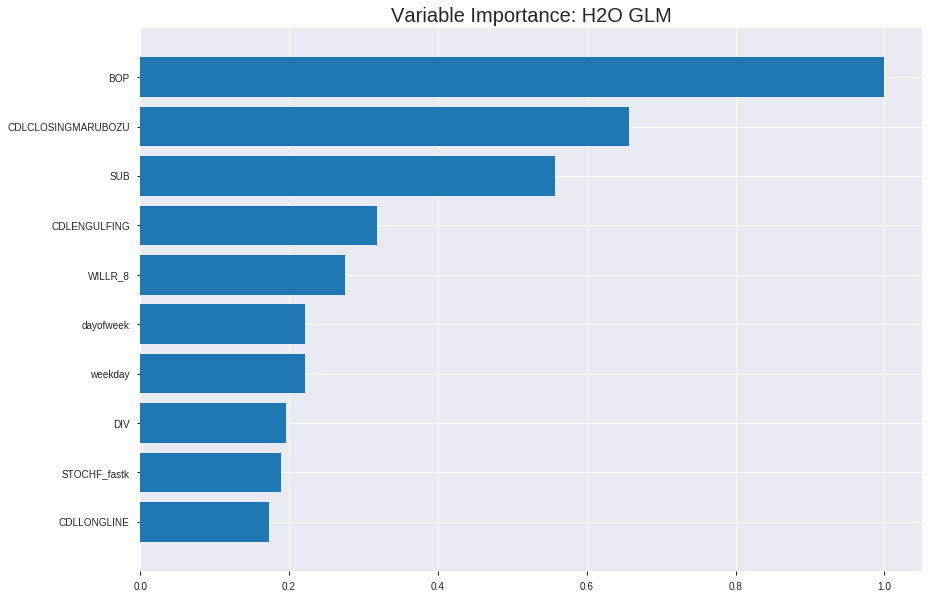

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_181240_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.21665610316716502
RMSE: 0.46546332096865056
LogLoss: 0.6221127690081246
Null degrees of freedom: 1723
Residual degrees of freedom: 1710
Null deviance: 2387.7412993239195
Residual deviance: 2145.0448275400136
AIC: 2173.0448275400136
AUC: 0.7071062131863957
pr_auc: 0.6715268507633432
Gini: 0.4142124263727913
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38934751086768477: 


,0,1,Error,Rate
0,371.0,522.0,0.5845,(522.0/893.0)
1,104.0,727.0,0.1252,(104.0/831.0)
Total,475.0,1249.0,0.3631,(626.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3893475,0.6990385,261.0
max f2,0.3112551,0.8282595,305.0
max f0point5,0.4784687,0.6386083,200.0
max accuracy,0.4784687,0.6525522,200.0
max precision,0.8987439,1.0,0.0
max recall,0.0749739,1.0,394.0
max specificity,0.8987439,1.0,0.0
max absolute_mcc,0.3907988,0.3246909,260.0
max min_per_class_accuracy,0.4928394,0.6450168,191.0
max mean_per_class_accuracy,0.4754512,0.6538359,202.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 48.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.8375500,1.6135847,1.6135847,0.7777778,0.8612019,0.7777778,0.8612019,0.0168472,0.0168472,61.3584704,61.3584704
,2,0.0203016,0.8163617,2.0746089,1.8375107,1.0,0.8244604,0.8857143,0.8433561,0.0204573,0.0373045,107.4608905,83.7510744
,3,0.0301624,0.7906441,1.8305373,1.8352310,0.8823529,0.8036192,0.8846154,0.8303652,0.0180505,0.0553550,83.0537269,83.5230954
,4,0.0400232,0.7778685,1.8305373,1.8340745,0.8823529,0.7838453,0.8840580,0.8189038,0.0180505,0.0734055,83.0537269,83.4074539
,5,0.0504640,0.7552390,1.3830726,1.7407638,0.6666667,0.7620826,0.8390805,0.8071477,0.0144404,0.0878460,38.3072603,74.0763794
,6,0.1003480,0.6880040,1.4232782,1.5829386,0.6860465,0.7211442,0.7630058,0.7643945,0.0709988,0.1588448,42.3278202,58.2938586
,7,0.1502320,0.6544369,1.4232782,1.5299239,0.6860465,0.6700927,0.7374517,0.7330819,0.0709988,0.2298436,42.3278202,52.9923941
,8,0.2001160,0.6192626,1.1820446,1.4432062,0.5697674,0.6363620,0.6956522,0.7089720,0.0589651,0.2888087,18.2044609,44.3206195
,9,0.2998840,0.5760571,1.2302913,1.3723718,0.5930233,0.5973727,0.6615087,0.6718442,0.1227437,0.4115523,23.0291327,37.2371848
,10,0.4002320,0.5313103,1.3071235,1.3560125,0.6300578,0.5552114,0.6536232,0.6426015,0.1311673,0.5427196,30.7123530,35.6012487




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.21553073311606835
RMSE: 0.46425287626041517
LogLoss: 0.6214468824035403
Null degrees of freedom: 491
Residual degrees of freedom: 478
Null deviance: 681.9739872837306
Residual deviance: 611.5037322850836
AIC: 639.5037322850836
AUC: 0.7197186358301235
pr_auc: 0.6751539709219495
Gini: 0.43943727166024704
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3036800992801501: 


,0,1,Error,Rate
0,53.0,198.0,0.7888,(198.0/251.0)
1,7.0,234.0,0.029,(7.0/241.0)
Total,60.0,432.0,0.4167,(205.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3036801,0.6953938,347.0
max f2,0.2617650,0.8398299,362.0
max f0point5,0.5213733,0.6734694,198.0
max accuracy,0.5213733,0.6808943,198.0
max precision,0.9068574,1.0,0.0
max recall,0.1355305,1.0,391.0
max specificity,0.9068574,1.0,0.0
max absolute_mcc,0.5213733,0.3618634,198.0
max min_per_class_accuracy,0.5240238,0.6772908,197.0
max mean_per_class_accuracy,0.5213733,0.6809691,198.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 51.07 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.8573327,1.2248963,1.2248963,0.6,0.8877912,0.6,0.8877912,0.0124481,0.0124481,22.4896266,22.4896266
,2,0.0203252,0.8436458,1.2248963,1.2248963,0.6,0.8522203,0.6,0.8700057,0.0124481,0.0248963,22.4896266,22.4896266
,3,0.0304878,0.8220850,1.6331950,1.3609959,0.8,0.8332229,0.6666667,0.8577448,0.0165975,0.0414938,63.3195021,36.0995851
,4,0.0406504,0.7936676,1.6331950,1.4290456,0.8,0.8106913,0.7,0.8459814,0.0165975,0.0580913,63.3195021,42.9045643
,5,0.0508130,0.7752295,1.6331950,1.4698755,0.8,0.7835219,0.72,0.8334895,0.0165975,0.0746888,63.3195021,46.9875519
,6,0.1016260,0.7050339,1.7148548,1.5923651,0.84,0.7402645,0.78,0.7868770,0.0871369,0.1618257,71.4854772,59.2365145
,7,0.1504065,0.6687249,1.4460581,1.5449142,0.7083333,0.6897008,0.7567568,0.7553604,0.0705394,0.2323651,44.6058091,54.4914209
,8,0.2012195,0.6433161,1.6331950,1.5672073,0.8,0.6554026,0.7676768,0.7301185,0.0829876,0.3153527,63.3195021,56.7207343
,9,0.3008130,0.5991602,1.3332204,1.4897387,0.6530612,0.6178036,0.7297297,0.6929332,0.1327801,0.4481328,33.3220425,48.9738701
,10,0.4004065,0.5589575,1.2082310,1.4197190,0.5918367,0.5792972,0.6954315,0.6646684,0.1203320,0.5684647,20.8231010,41.9719022



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 18:12:40,0.000 sec,2,.15E2,14,1.3731908,1.3725484
,2019-08-24 18:12:40,0.006 sec,4,.93E1,14,1.3669748,1.3654100
,2019-08-24 18:12:40,0.012 sec,6,.58E1,14,1.3582352,1.3553907
,2019-08-24 18:12:40,0.018 sec,8,.36E1,14,1.3467016,1.3422085
,2019-08-24 18:12:40,0.023 sec,10,.22E1,14,1.3326717,1.3262770
,2019-08-24 18:12:40,0.029 sec,12,.14E1,14,1.3171489,1.3088682
,2019-08-24 18:12:40,0.034 sec,14,.86E0,14,1.3015877,1.2918202
,2019-08-24 18:12:40,0.039 sec,16,.53E0,14,1.2872338,1.2766914
,2019-08-24 18:12:40,0.044 sec,18,.33E0,14,1.2748837,1.2644441
,2019-08-24 18:12:40,0.050 sec,20,.21E0,14,1.2647927,1.2552954


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6437246963562753)

('F1', 0.734806629834254)

('auc', 0.6639550264550265)

('logloss', 0.646361638099393)

('mean_per_class_error', 0.35558862433862437)

('rmse', 0.4771057159467758)

('mse', 0.22762986418908554)

glm prediction progress: |████████████████████████████████████████████████| 100%


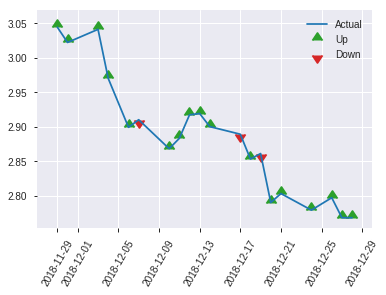


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.22762986418908554
RMSE: 0.4771057159467758
LogLoss: 0.646361638099393
Null degrees of freedom: 246
Residual degrees of freedom: 233
Null deviance: 344.38937217717034
Residual deviance: 319.30264922110024
AIC: 347.30264922110024
AUC: 0.6639550264550265
pr_auc: 0.675957549832755
Gini: 0.32791005291005293
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26329699415513663: 


,0,1,Error,Rate
0,18.0,94.0,0.8393,(94.0/112.0)
1,2.0,133.0,0.0148,(2.0/135.0)
Total,20.0,227.0,0.3887,(96.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2632970,0.7348066,226.0
max f2,0.2593108,0.8701299,229.0
max f0point5,0.5455541,0.6771654,124.0
max accuracy,0.5455541,0.6437247,124.0
max precision,0.8039867,0.9166667,11.0
max recall,0.2193006,1.0,238.0
max specificity,0.8736535,0.9910714,0.0
max absolute_mcc,0.5455541,0.2875891,124.0
max min_per_class_accuracy,0.5455541,0.6370370,124.0
max mean_per_class_accuracy,0.5455541,0.6444114,124.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 52.96 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.8534733,1.2197531,1.2197531,0.6666667,0.8654652,0.6666667,0.8654652,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.8267184,1.8296296,1.4637037,1.0,0.8427372,0.8,0.8563740,0.0148148,0.0296296,82.9629630,46.3703704
,3,0.0323887,0.8101475,1.8296296,1.6009259,1.0,0.8182391,0.875,0.8420734,0.0222222,0.0518519,82.9629630,60.0925926
,4,0.0404858,0.8074002,1.8296296,1.6466667,1.0,0.8094179,0.9,0.8355423,0.0148148,0.0666667,82.9629630,64.6666667
,5,0.0526316,0.7912904,1.2197531,1.5481481,0.6666667,0.8010229,0.8461538,0.8275763,0.0148148,0.0814815,21.9753086,54.8148148
,6,0.1012146,0.7349497,0.9148148,1.2441481,0.5,0.7577493,0.68,0.7940594,0.0444444,0.1259259,-8.5185185,24.4148148
,7,0.1497976,0.6910433,1.5246914,1.3351351,0.8333333,0.7111792,0.7297297,0.7671793,0.0740741,0.2,52.4691358,33.5135135
,8,0.2024291,0.6569225,1.2666667,1.3173333,0.6923077,0.6743203,0.72,0.7430360,0.0666667,0.2666667,26.6666667,31.7333333
,9,0.2995951,0.6166968,1.1435185,1.2609610,0.625,0.6381132,0.6891892,0.7090070,0.1111111,0.3777778,14.3518519,26.0960961
,10,0.4008097,0.5771343,1.1709630,1.2382342,0.64,0.5960948,0.6767677,0.6804938,0.1185185,0.4962963,17.0962963,23.8234194


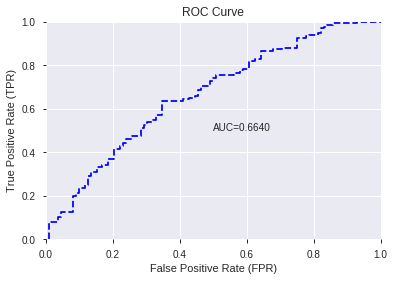

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


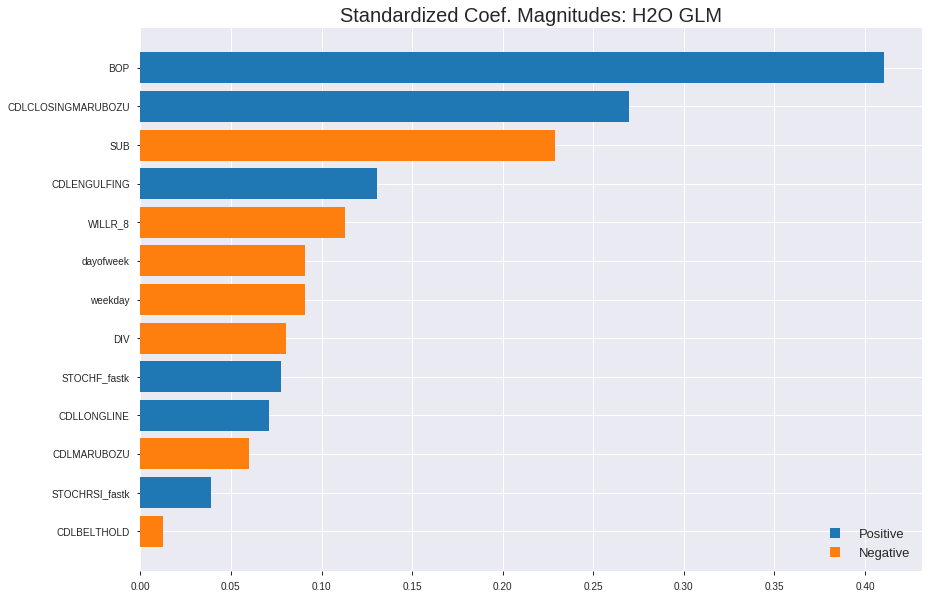

'log_likelihood'
--2019-08-24 18:12:44--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.130.179
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.130.179|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


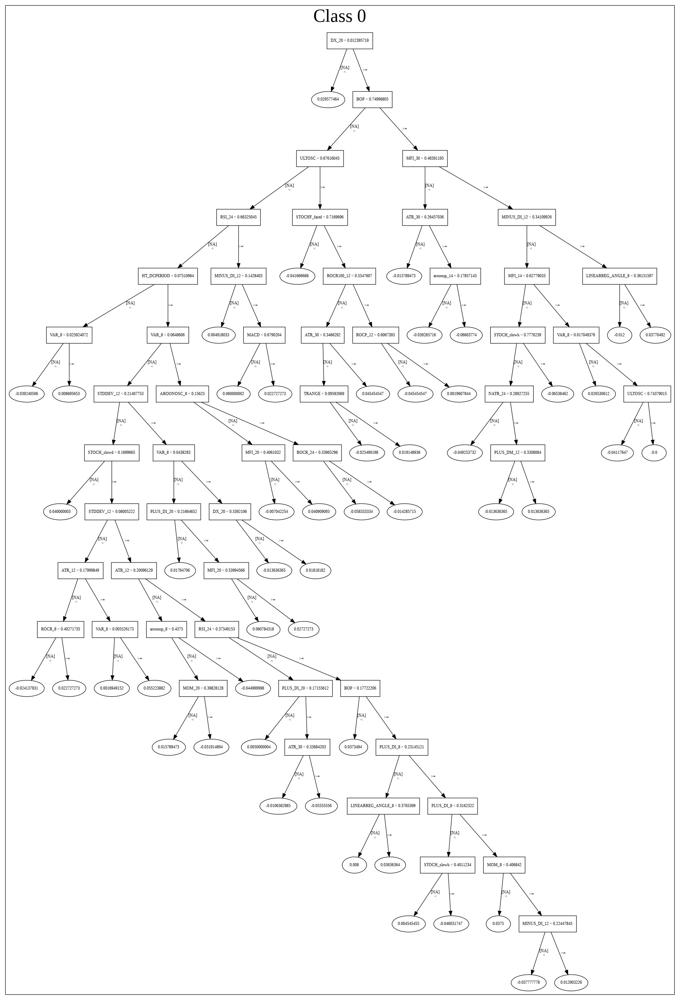

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_181240_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_181240_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_82_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_82_s

['BOP',
 'CDLCLOSINGMARUBOZU',
 'SUB',
 'CDLENGULFING',
 'WILLR_8',
 'dayofweek',
 'weekday',
 'DIV',
 'STOCHF_fastk',
 'CDLLONGLINE',
 'CDLMARUBOZU',
 'STOCHRSI_fastk',
 'CDLBELTHOLD']

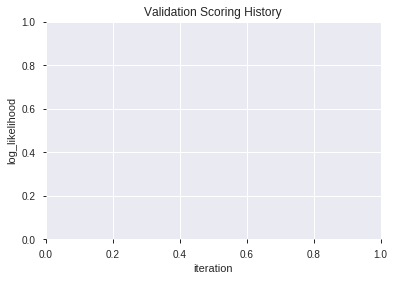

In [49]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190824_181251_model_4,0.640476,0.653307,0.408333,0.480738,0.231109
1,XGBoost_2_AutoML_20190824_181251,0.631878,0.657277,0.411276,0.482325,0.232637
2,XGBoost_grid_1_AutoML_20190824_181251_model_2,0.629630,0.660015,0.455357,0.483810,0.234072
3,XGBoost_3_AutoML_20190824_181251,0.627447,0.659109,0.450132,0.483593,0.233862
4,XGBoost_grid_1_AutoML_20190824_181251_model_7,0.618849,0.663464,0.444147,0.485688,0.235893
5,XGBoost_grid_1_AutoML_20190824_181251_model_1,0.616799,0.666677,0.443386,0.487055,0.237222
6,XGBoost_1_AutoML_20190824_181251,0.614352,0.662159,0.441865,0.485285,0.235501
7,XGBoost_grid_1_AutoML_20190824_181251_model_3,0.613294,0.664145,0.455357,0.486104,0.236297
8,XGBoost_grid_1_AutoML_20190824_181251_model_6,0.605688,0.667357,0.446429,0.487644,0.237797
9,XGBoost_grid_1_AutoML_20190824_181251_model_5,0.593915,0.691002,0.468750,0.497714,0.247719


,variable,relative_importance,scaled_importance,percentage
0,BOP,1433.031860,1.000000,0.442845
1,SUB,533.879883,0.372553,0.164983
2,DIV,383.939819,0.267921,0.118648
3,dayofweek,248.542084,0.173438,0.076806
4,STOCHF_fastk,207.019226,0.144462,0.063974
5,WILLR_8,205.723831,0.143558,0.063574
6,STOCHRSI_fastk,123.930992,0.086482,0.038298
7,CDLCLOSINGMARUBOZU,54.330769,0.037913,0.016790
8,CDLLONGLINE,18.712742,0.013058,0.005783
9,weekday,16.157440,0.011275,0.004993


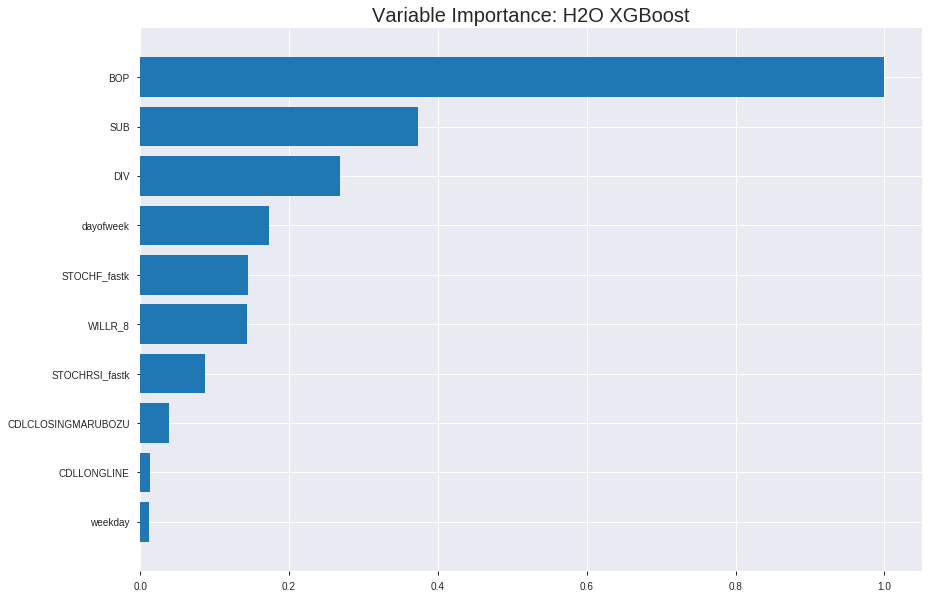

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190824_181251_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.20307793629877308
RMSE: 0.45064169391965175
LogLoss: 0.5918784046917225
Mean Per-Class Error: 0.30595095157819274
AUC: 0.7553359934131357
pr_auc: 0.7223564584224893
Gini: 0.5106719868262715
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4514373689889908: 


,0,1,Error,Rate
0,496.0,397.0,0.4446,(397.0/893.0)
1,149.0,682.0,0.1793,(149.0/831.0)
Total,645.0,1079.0,0.3167,(546.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4514374,0.7141361,224.0
max f2,0.1979180,0.8398038,357.0
max f0point5,0.5137744,0.6804941,179.0
max accuracy,0.5137744,0.6937355,179.0
max precision,0.8132937,1.0,0.0
max recall,0.1359059,1.0,393.0
max specificity,0.8132937,1.0,0.0
max absolute_mcc,0.4580152,0.3895902,220.0
max min_per_class_accuracy,0.5183517,0.6886898,176.0
max mean_per_class_accuracy,0.5137744,0.6940490,179.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 48.53 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.7801910,2.0746089,2.0746089,1.0,0.7908247,1.0,0.7908247,0.0216606,0.0216606,107.4608905,107.4608905
,2,0.0208817,0.7696944,1.9593529,2.0169809,0.9444444,0.7728195,0.9722222,0.7818221,0.0204573,0.0421179,95.9352855,101.6980880
,3,0.0301624,0.7621964,1.9449458,1.9948163,0.9375,0.7656638,0.9615385,0.7768503,0.0180505,0.0601685,94.4945848,99.4816255
,4,0.0400232,0.7486395,1.5864656,1.8942081,0.7647059,0.7567333,0.9130435,0.7718939,0.0156438,0.0758123,58.6465633,89.4208131
,5,0.0504640,0.7313148,1.3830726,1.7884560,0.6666667,0.7420550,0.8620690,0.7657204,0.0144404,0.0902527,38.3072603,78.8455953
,6,0.1003480,0.6899408,1.4956483,1.6428984,0.7209302,0.7072355,0.7919075,0.7366470,0.0746089,0.1648616,49.5648280,64.2898381
,7,0.1502320,0.6587538,1.6645118,1.6500750,0.8023256,0.6732233,0.7953668,0.7155874,0.0830325,0.2478941,66.4511796,65.0075036
,8,0.2001160,0.6373206,1.4232782,1.5935402,0.6860465,0.6475773,0.7681159,0.6986341,0.0709988,0.3188929,42.3278202,59.3540173
,9,0.2998840,0.5990735,1.4474016,1.5449215,0.6976744,0.6192542,0.7446809,0.6722253,0.1444043,0.4632972,44.7401562,54.4921525
,10,0.4002320,0.5587316,1.2111879,1.4612463,0.5838150,0.5792009,0.7043478,0.6489018,0.1215403,0.5848375,21.1187858,46.1246272




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.22076499814289544
RMSE: 0.46985635905337647
LogLoss: 0.6315799455373144
Mean Per-Class Error: 0.33239655485940056
AUC: 0.6994759551007588
pr_auc: 0.6422694054293233
Gini: 0.39895191020151755
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.48097002506256104: 


,0,1,Error,Rate
0,131.0,120.0,0.4781,(120.0/251.0)
1,49.0,192.0,0.2033,(49.0/241.0)
Total,180.0,312.0,0.3435,(169.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4809700,0.6943942,247.0
max f2,0.2259924,0.8391854,370.0
max f0point5,0.5687579,0.6627592,169.0
max accuracy,0.5687579,0.6666667,169.0
max precision,0.7938220,1.0,0.0
max recall,0.1949909,1.0,384.0
max specificity,0.7938220,1.0,0.0
max absolute_mcc,0.5205628,0.3363655,210.0
max min_per_class_accuracy,0.5455124,0.6556017,190.0
max mean_per_class_accuracy,0.5205628,0.6676034,210.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 51.86 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.7654684,1.6331950,1.6331950,0.8,0.7803216,0.8,0.7803216,0.0165975,0.0165975,63.3195021,63.3195021
,2,0.0203252,0.7551277,1.2248963,1.4290456,0.6,0.7594931,0.7,0.7699073,0.0124481,0.0290456,22.4896266,42.9045643
,3,0.0304878,0.7432834,0.4082988,1.0887967,0.2,0.7508734,0.5333333,0.7635627,0.0041494,0.0331950,-59.1701245,8.8796680
,4,0.0406504,0.7388294,1.6331950,1.2248963,0.8,0.7412842,0.6,0.7579930,0.0165975,0.0497925,63.3195021,22.4896266
,5,0.0508130,0.7309013,1.6331950,1.3065560,0.8,0.7357382,0.64,0.7535421,0.0165975,0.0663900,63.3195021,30.6556017
,6,0.1016260,0.6965008,1.4698755,1.3882158,0.72,0.7162511,0.68,0.7348966,0.0746888,0.1410788,46.9875519,38.8215768
,7,0.1504065,0.6780174,1.2759336,1.3517999,0.625,0.6879968,0.6621622,0.7196859,0.0622407,0.2033195,27.5933610,35.1799933
,8,0.2012195,0.6528382,1.1432365,1.2991324,0.56,0.6626109,0.6363636,0.7052730,0.0580913,0.2614108,14.3236515,29.9132403
,9,0.3008130,0.6183082,1.7081887,1.4345632,0.8367347,0.6315723,0.7027027,0.6808721,0.1701245,0.4315353,70.8188670,43.4563194
,10,0.4004065,0.5812660,1.2498941,1.3886303,0.6122449,0.5997476,0.6802030,0.6606939,0.1244813,0.5560166,24.9894149,38.8630284



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 18:12:56,1.775 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5179814,0.5,0.6931472,0.5,0.0,1.0,0.5101626
,2019-08-24 18:12:56,1.820 sec,5.0,0.4857843,0.6649668,0.7221908,0.6741176,1.4983287,0.3642691,0.4901965,0.6736699,0.6919790,0.6462472,1.4582098,0.3861789
,2019-08-24 18:12:56,1.854 sec,10.0,0.4763582,0.6462265,0.7276012,0.6828985,1.7782362,0.3619490,0.4827867,0.6589501,0.7007985,0.6424970,1.0207469,0.3617886
,2019-08-24 18:12:56,1.895 sec,15.0,0.4696035,0.6324808,0.7320455,0.6912635,1.8440968,0.3532483,0.4776237,0.6485462,0.7087831,0.6509073,1.2248963,0.3577236
,2019-08-24 18:12:56,1.929 sec,20.0,0.4648346,0.6225415,0.7359285,0.6977184,1.8671480,0.3491879,0.4745681,0.6422508,0.7088245,0.6495276,1.2248963,0.3678862
,2019-08-24 18:12:56,1.971 sec,25.0,0.4612981,0.6149411,0.7383817,0.7018970,1.8942081,0.3544084,0.4728012,0.6383405,0.7037906,0.6465318,1.3609959,0.3658537
,2019-08-24 18:12:56,2.010 sec,30.0,0.4587175,0.6093318,0.7419878,0.7078575,2.0746089,0.3457077,0.4720027,0.6367428,0.7031542,0.6529662,1.6331950,0.3414634
,2019-08-24 18:12:56,2.055 sec,35.0,0.4567006,0.6049948,0.7454523,0.7123992,2.0746089,0.3549884,0.4707283,0.6340858,0.7044436,0.6488814,2.0414938,0.3475610
,2019-08-24 18:12:56,2.097 sec,40.0,0.4548920,0.6010083,0.7476219,0.7149060,1.9758180,0.3358469,0.4700191,0.6323529,0.7030467,0.6476102,2.0414938,0.3658537
,2019-08-24 18:12:56,2.140 sec,45.0,0.4534722,0.5978640,0.7494910,0.7163729,2.0746089,0.3358469,0.4698973,0.6318894,0.7017656,0.6452167,1.6331950,0.3739837


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1433.0318604,1.0,0.4428453
SUB,533.8798828,0.3725527,0.1649832
DIV,383.9398193,0.2679213,0.1186477
dayofweek,248.5420837,0.1734379,0.0768062
STOCHF_fastk,207.0192261,0.1444624,0.0639745
WILLR_8,205.7238312,0.1435584,0.0635742
STOCHRSI_fastk,123.9309921,0.0864817,0.0382980
CDLCLOSINGMARUBOZU,54.3307686,0.0379132,0.0167897
CDLLONGLINE,18.7127419,0.0130581,0.0057827
weekday,16.1574402,0.0112750,0.0049931


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6275303643724697)

('F1', 0.7304347826086957)

('auc', 0.6404761904761905)

('logloss', 0.6533066941455387)

('mean_per_class_error', 0.3965277777777778)

('rmse', 0.48073802779113833)

('mse', 0.2311090513645133)

xgboost prediction progress: |████████████████████████████████████████████| 100%


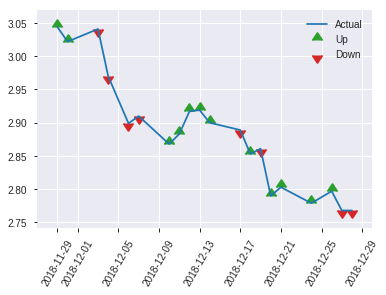


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2311090513645133
RMSE: 0.48073802779113833
LogLoss: 0.6533066941455387
Mean Per-Class Error: 0.3965277777777778
AUC: 0.6404761904761905
pr_auc: 0.6683162676700942
Gini: 0.28095238095238106
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4028095602989197: 


,0,1,Error,Rate
0,28.0,84.0,0.75,(84.0/112.0)
1,9.0,126.0,0.0667,(9.0/135.0)
Total,37.0,210.0,0.3765,(93.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4028096,0.7304348,207.0
max f2,0.3164910,0.8676093,235.0
max f0point5,0.4331301,0.6504961,190.0
max accuracy,0.4331301,0.6275304,190.0
max precision,0.7808841,1.0,0.0
max recall,0.3164910,1.0,235.0
max specificity,0.7808841,1.0,0.0
max absolute_mcc,0.4028096,0.2557448,207.0
max min_per_class_accuracy,0.5773205,0.5982143,123.0
max mean_per_class_accuracy,0.5651755,0.6034722,133.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 55.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7764341,1.8296296,1.8296296,1.0,0.7805604,1.0,0.7805604,0.0222222,0.0222222,82.9629630,82.9629630
,2,0.0202429,0.7698283,0.9148148,1.4637037,0.5,0.7717080,0.8,0.7770194,0.0074074,0.0296296,-8.5185185,46.3703704
,3,0.0323887,0.7679674,1.8296296,1.6009259,1.0,0.7690657,0.875,0.7740368,0.0222222,0.0518519,82.9629630,60.0925926
,4,0.0404858,0.7550494,1.8296296,1.6466667,1.0,0.7660015,0.9,0.7724297,0.0148148,0.0666667,82.9629630,64.6666667
,5,0.0526316,0.7456622,1.8296296,1.6888889,1.0,0.7496499,0.9230769,0.7671728,0.0222222,0.0888889,82.9629630,68.8888889
,6,0.1012146,0.7123437,1.0672840,1.3905185,0.5833333,0.7217425,0.76,0.7453663,0.0518519,0.1407407,6.7283951,39.0518519
,7,0.1497976,0.6793616,1.0672840,1.2856857,0.5833333,0.6951627,0.7027027,0.7290841,0.0518519,0.1925926,6.7283951,28.5685686
,8,0.2024291,0.6556774,1.1259259,1.2441481,0.6153846,0.6655987,0.68,0.7125779,0.0592593,0.2518519,12.5925926,24.4148148
,9,0.2995951,0.6298078,1.2959877,1.2609610,0.7083333,0.6428623,0.6891892,0.6899674,0.1259259,0.3777778,29.5987654,26.0960961
,10,0.4008097,0.6051814,1.0245926,1.2012720,0.56,0.6190049,0.6565657,0.6720476,0.1037037,0.4814815,2.4592593,20.1271979


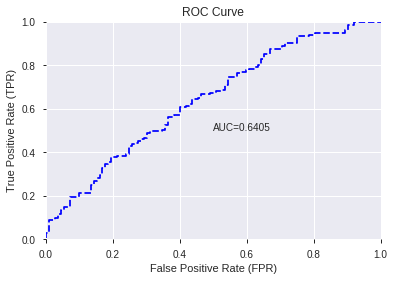

This function is available for GLM models only


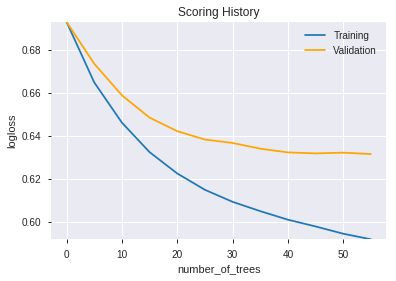

--2019-08-24 18:13:05--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.205.243
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.205.243|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at he

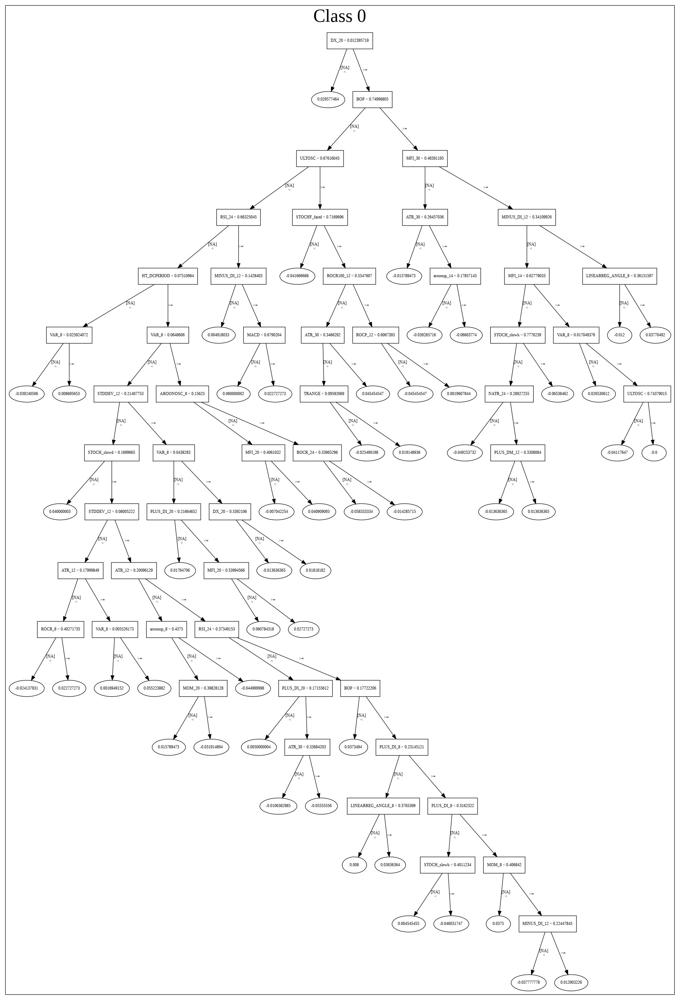

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190824_181251_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190824_181251_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_90_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'SUB',
 'DIV',
 'dayofweek',
 'STOCHF_fastk',
 'WILLR_8',
 'STOCHRSI_fastk',
 'CDLCLOSINGMARUBOZU',
 'CDLLONGLINE',
 'weekday',
 'CDLBELTHOLD']

In [50]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [51]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=5).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

305

['BBANDS_middleband_14_0_5',
 'BBANDS_lowerband_14_0_5',
 'MA_14_1',
 'MAVP_14_1',
 'BBANDS_upperband_14_1_2',
 'BBANDS_middleband_14_1_2',
 'BBANDS_lowerband_14_1_2',
 'BBANDS_upperband_14_1_3',
 'BBANDS_middleband_14_1_3',
 'BBANDS_lowerband_14_1_3',
 'BBANDS_upperband_14_1_4',
 'BBANDS_middleband_14_1_4',
 'BBANDS_upperband_14_1_5',
 'BBANDS_middleband_14_1_5',
 'BBANDS_lowerband_14_1_5',
 'MAVP_14_2',
 'BBANDS_upperband_14_2_2',
 'BBANDS_middleband_14_2_2',
 'BBANDS_lowerband_14_2_2',
 'BBANDS_upperband_14_2_3',
 'BBANDS_middleband_14_2_3',
 'BBANDS_lowerband_14_2_3',
 'BBANDS_upperband_14_2_4',
 'BBANDS_middleband_14_2_4',
 'BBANDS_upperband_14_2_5',
 'BBANDS_middleband_14_2_5',
 'BBANDS_lowerband_14_2_5',
 'MA_14_3',
 'BBANDS_lowerband_14_3_2',
 'BBANDS_middleband_14_3_3',
 'BBANDS_lowerband_14_3_3',
 'BBANDS_middleband_14_3_4',
 'BBANDS_upperband_14_3_5',
 'BBANDS_middleband_14_3_5',
 'BBANDS_lowerband_14_3_5',
 'MA_14_4',
 'MAVP_14_4',
 'BBANDS_upperband_14_4_2',
 'BBANDS_upper

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_181451_model_2,0.621429,0.747798,0.429894,0.518876,0.269232
1,DeepLearning_grid_1_AutoML_20190824_181451_model_9,0.602116,0.675362,0.473214,0.491006,0.241087
2,DeepLearning_grid_1_AutoML_20190824_181451_model_6,0.592460,0.677095,0.471693,0.492045,0.242108
3,DeepLearning_grid_1_AutoML_20190824_181451_model_8,0.569841,0.693232,0.480622,0.497926,0.247930
4,DeepLearning_grid_1_AutoML_20190824_181451_model_5,0.569511,0.724732,0.472454,0.512905,0.263072
5,DeepLearning_grid_1_AutoML_20190824_181451_model_7,0.568254,0.696408,0.472454,0.500517,0.250517
6,DeepLearning_grid_1_AutoML_20190824_181451_model_3,0.562566,0.816435,0.456779,0.530354,0.281275
7,DeepLearning_grid_1_AutoML_20190824_181451_model_1,0.561772,2.097561,0.473214,0.654091,0.427835
8,DeepLearning_grid_1_AutoML_20190824_181451_model_4,0.537368,1.459451,0.500000,0.625921,0.391777
9,DeepLearning_1_AutoML_20190824_181451,0.535384,0.864542,0.489550,0.544555,0.296541


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.006583
1,CDLEVENINGSTAR,0.839569,0.839569,0.005527
2,TRANGE,0.813564,0.813564,0.005356
3,CDLCLOSINGMARUBOZU,0.673076,0.673076,0.004431
4,aroondown_20,0.669541,0.669541,0.004408
5,STOCHF_fastk,0.636524,0.636524,0.004190
6,CORREL_8,0.611722,0.611722,0.004027
7,aroonup_8,0.604411,0.604411,0.003979
8,CORREL_14,0.583862,0.583862,0.003844
9,ADXR_14,0.582444,0.582444,0.003834


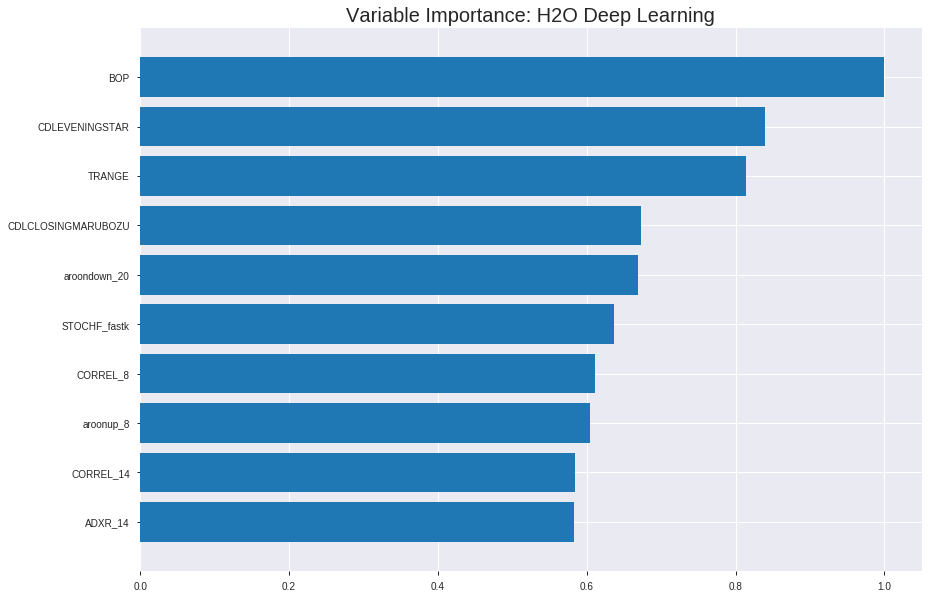

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_181451_model_2


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.22556026428743314
RMSE: 0.4749318522561244
LogLoss: 0.6466104369635006
Mean Per-Class Error: 0.34545394517863903
AUC: 0.7037622476192017
pr_auc: 0.6760893573168391
Gini: 0.4075244952384034
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.21356602037025038: 


,0,1,Error,Rate
0,287.0,606.0,0.6786,(606.0/893.0)
1,84.0,747.0,0.1011,(84.0/831.0)
Total,371.0,1353.0,0.4002,(690.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2135660,0.6840659,313.0
max f2,0.0683941,0.8271654,381.0
max f0point5,0.3854767,0.6389592,228.0
max accuracy,0.3854767,0.6525522,228.0
max precision,0.9861846,1.0,0.0
max recall,0.0259705,1.0,397.0
max specificity,0.9861846,1.0,0.0
max absolute_mcc,0.3365568,0.3134558,253.0
max min_per_class_accuracy,0.3939544,0.6472564,224.0
max mean_per_class_accuracy,0.3653020,0.6545461,238.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 41.32 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.9277197,1.9593529,1.9593529,0.9444444,0.9448938,0.9444444,0.9448938,0.0204573,0.0204573,95.9352855,95.9352855
,2,0.0203016,0.8916654,1.5864656,1.7782362,0.7647059,0.9089164,0.8571429,0.9274191,0.0156438,0.0361011,58.6465633,77.8236204
,3,0.0301624,0.8639562,1.7085015,1.7554383,0.8235294,0.8787909,0.8461538,0.9115214,0.0168472,0.0529483,70.8501451,75.5438304
,4,0.0400232,0.8347498,1.8305373,1.7739409,0.8823529,0.8467548,0.8550725,0.8955644,0.0180505,0.0709988,83.0537269,77.3940948
,5,0.0504640,0.8185149,1.4983287,1.7169177,0.7222222,0.8276903,0.8275862,0.8815215,0.0156438,0.0866426,49.8328654,71.6917714
,6,0.1003480,0.7274501,1.3991548,1.5589547,0.6744186,0.7695756,0.7514451,0.8258721,0.0697954,0.1564380,39.9154843,55.8954668
,7,0.1502320,0.6612169,1.5197716,1.5459441,0.7325581,0.6939919,0.7451737,0.7820818,0.0758123,0.2322503,51.9771640,54.5944087
,8,0.2001160,0.6158816,1.3750315,1.5033398,0.6627907,0.6379948,0.7246377,0.7461644,0.0685921,0.3008424,37.5031484,50.3339786
,9,0.2998840,0.5296529,1.3509081,1.4526275,0.6511628,0.5741734,0.7001934,0.6889450,0.1347774,0.4356197,35.0908124,45.2627512
,10,0.4002320,0.4552530,1.0313085,1.3469924,0.4971098,0.4893640,0.6492754,0.6389051,0.1034898,0.5391095,3.1308473,34.6992448




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.2546307255249383
RMSE: 0.5046094782353363
LogLoss: 0.7325155180670618
Mean Per-Class Error: 0.3597807938370998
AUC: 0.6790514291382189
pr_auc: 0.635071739136582
Gini: 0.35810285827643784
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.17970551017104452: 


,0,1,Error,Rate
0,100.0,151.0,0.6016,(151.0/251.0)
1,37.0,204.0,0.1535,(37.0/241.0)
Total,137.0,355.0,0.3821,(188.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1797055,0.6845638,297.0
max f2,0.0356790,0.8327550,385.0
max f0point5,0.3304939,0.6330197,197.0
max accuracy,0.3304939,0.6402439,197.0
max precision,0.9408446,1.0,0.0
max recall,0.0152568,1.0,397.0
max specificity,0.9408446,1.0,0.0
max absolute_mcc,0.3235605,0.2803897,205.0
max min_per_class_accuracy,0.3235605,0.6390041,205.0
max mean_per_class_accuracy,0.3235605,0.6402192,205.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 34.25 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.9023017,0.8165975,0.8165975,0.4,0.9245061,0.4,0.9245061,0.0082988,0.0082988,-18.3402490,-18.3402490
,2,0.0203252,0.8720623,1.6331950,1.2248963,0.8,0.8917124,0.6,0.9081092,0.0165975,0.0248963,63.3195021,22.4896266
,3,0.0304878,0.8282435,2.0414938,1.4970954,1.0,0.8506200,0.7333333,0.8889461,0.0207469,0.0456432,104.1493776,49.7095436
,4,0.0406504,0.8019021,1.2248963,1.4290456,0.6,0.8119371,0.7,0.8696939,0.0124481,0.0580913,22.4896266,42.9045643
,5,0.0508130,0.7905026,1.2248963,1.3882158,0.6,0.7982725,0.68,0.8554096,0.0124481,0.0705394,22.4896266,38.8215768
,6,0.1016260,0.6592658,1.5515353,1.4698755,0.76,0.7177630,0.72,0.7865863,0.0788382,0.1493776,55.1535270,46.9875519
,7,0.1504065,0.5838296,1.3609959,1.4345632,0.6666667,0.6140503,0.7027027,0.7306287,0.0663900,0.2157676,36.0995851,43.4563194
,8,0.2012195,0.5285663,1.4698755,1.4434804,0.72,0.5521135,0.7070707,0.6855491,0.0746888,0.2904564,46.9875519,44.3480448
,9,0.3008130,0.4375455,1.2498941,1.3793877,0.6122449,0.4841470,0.6756757,0.6188687,0.1244813,0.4149378,24.9894149,37.9387686
,10,0.4004065,0.3751128,1.0832416,1.3057270,0.5306122,0.4058266,0.6395939,0.5658785,0.1078838,0.5228216,8.3241595,30.5726984



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 18:15:49,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 18:15:51,59.516 sec,1309 obs/sec,1.7616009,1,3037.0,0.5494028,1.1554727,-0.2089372,0.6458179,0.5949987,1.2678166,0.4878190,0.5619612,1.2955912,-0.2637238,0.6210015,0.6003183,1.2248963,0.5
,2019-08-24 18:15:57,1 min 4.946 sec,1255 obs/sec,5.3230858,3,9177.0,0.4749319,0.6466104,0.0965905,0.7037622,0.6760894,1.9593529,0.4002320,0.5046095,0.7325155,-0.0189438,0.6790514,0.6350717,0.8165975,0.3821138
,2019-08-24 18:16:02,1 min 9.957 sec,1288 obs/sec,8.8810905,5,15311.0,0.4896721,0.6925468,0.0396427,0.6982272,0.6693917,1.9593529,0.4257541,0.5251498,0.8291201,-0.1035853,0.6770181,0.6119562,0.0,0.3760163
,2019-08-24 18:16:08,1 min 16.609 sec,1350 obs/sec,14.1821346,8,24450.0,0.5166315,0.8468671,-0.0690150,0.6526130,0.6415359,1.8440968,0.4837587,0.5809889,1.1712548,-0.3507506,0.5932949,0.5773313,1.2248963,0.4939024
,2019-08-24 18:16:14,1 min 22.802 sec,1410 obs/sec,19.5034803,11,33624.0,0.5081717,0.8025448,-0.0342915,0.6838885,0.6648403,1.9593529,0.4141531,0.5413151,0.9774080,-0.1725725,0.6612306,0.6254005,1.6331950,0.4552846
,2019-08-24 18:16:20,1 min 28.470 sec,1470 obs/sec,24.8074246,14,42768.0,0.5105693,0.7909039,-0.0440744,0.6705577,0.6387463,1.8440968,0.4733179,0.5221687,0.8836512,-0.0910912,0.6650824,0.6056001,0.4082988,0.3821138
,2019-08-24 18:16:25,1 min 33.902 sec,1525 obs/sec,30.1548724,17,51987.0,0.4992048,0.7574146,0.0018875,0.7200266,0.6728914,1.8440968,0.3596288,0.5356731,0.9862531,-0.1482572,0.6717032,0.6047136,0.4082988,0.3963415
,2019-08-24 18:16:26,1 min 34.337 sec,1525 obs/sec,30.1548724,17,51987.0,0.4749319,0.6466104,0.0965905,0.7037622,0.6760894,1.9593529,0.4002320,0.5046095,0.7325155,-0.0189438,0.6790514,0.6350717,0.8165975,0.3821138


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0065829
CDLEVENINGSTAR,0.8395689,0.8395689,0.0055268
TRANGE,0.8135635,0.8135635,0.0053556
CDLCLOSINGMARUBOZU,0.6730759,0.6730759,0.0044308
aroondown_20,0.6695410,0.6695410,0.0044076
---,---,---,---
BBANDS_upperband_14_1_2,0.4381077,0.4381077,0.0028840
BBANDS_upperband_30_1_3,0.4363542,0.4363542,0.0028725
BBANDS_upperband_20_6_3,0.4328388,0.4328388,0.0028494
BBANDS_upperband_20_0_5,0.4326502,0.4326502,0.0028481



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6275303643724697)

('F1', 0.7183908045977012)

('auc', 0.6214285714285713)

('logloss', 0.7477979796836695)

('mean_per_class_error', 0.38561507936507944)

('rmse', 0.5188761538405385)

('mse', 0.2692324630243502)

deeplearning prediction progress: |███████████████████████████████████████| 100%


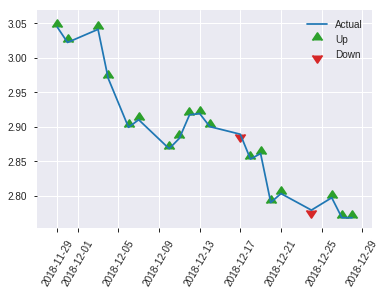


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2692324630243502
RMSE: 0.5188761538405385
LogLoss: 0.7477979796836695
Mean Per-Class Error: 0.38561507936507944
AUC: 0.6214285714285713
pr_auc: 0.6318739371014759
Gini: 0.24285714285714266
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.19504473146447027: 


,0,1,Error,Rate
0,24.0,88.0,0.7857,(88.0/112.0)
1,10.0,125.0,0.0741,(10.0/135.0)
Total,34.0,213.0,0.3968,(98.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1950447,0.7183908,212.0
max f2,0.0210644,0.8598726,244.0
max f0point5,0.3101795,0.6546855,160.0
max accuracy,0.3101795,0.6275304,160.0
max precision,0.8627029,1.0,0.0
max recall,0.0210644,1.0,244.0
max specificity,0.8627029,1.0,0.0
max absolute_mcc,0.3101795,0.2390631,160.0
max min_per_class_accuracy,0.3635785,0.5625,124.0
max mean_per_class_accuracy,0.3101795,0.6143849,160.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 37.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7966966,1.2197531,1.2197531,0.6666667,0.8503304,0.6666667,0.8503304,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.7351140,0.9148148,1.0977778,0.5,0.7412615,0.6,0.8067028,0.0074074,0.0222222,-8.5185185,9.7777778
,3,0.0323887,0.7056277,1.8296296,1.3722222,1.0,0.7251277,0.75,0.7761122,0.0222222,0.0444444,82.9629630,37.2222222
,4,0.0404858,0.6882986,0.9148148,1.2807407,0.5,0.6998262,0.7,0.7608550,0.0074074,0.0518519,-8.5185185,28.0740741
,5,0.0526316,0.6735899,0.6098765,1.1259259,0.3333333,0.6823551,0.6153846,0.7427396,0.0074074,0.0592593,-39.0123457,12.5925926
,6,0.1012146,0.6219782,1.3722222,1.2441481,0.75,0.6474758,0.68,0.6970130,0.0666667,0.1259259,37.2222222,24.4148148
,7,0.1497976,0.5545965,1.5246914,1.3351351,0.8333333,0.5974693,0.7297297,0.6647285,0.0740741,0.2,52.4691358,33.5135135
,8,0.2024291,0.5012236,1.1259259,1.2807407,0.6153846,0.5227870,0.7,0.6278237,0.0592593,0.2592593,12.5925926,28.0740741
,9,0.2995951,0.4501606,0.9148148,1.1620621,0.5,0.4738340,0.6351351,0.5778811,0.0888889,0.3481481,-8.5185185,16.2062062
,10,0.4008097,0.4018906,1.0977778,1.1458287,0.6,0.4233431,0.6262626,0.5388564,0.1111111,0.4592593,9.7777778,14.5828657


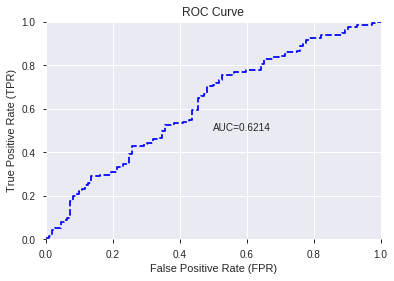

This function is available for GLM models only


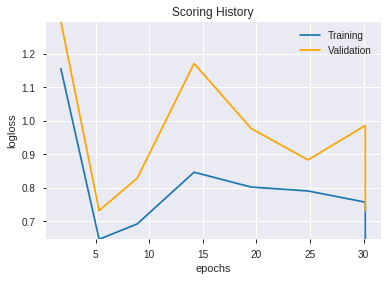

--2019-08-24 18:30:18--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.32.132
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.32.132|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


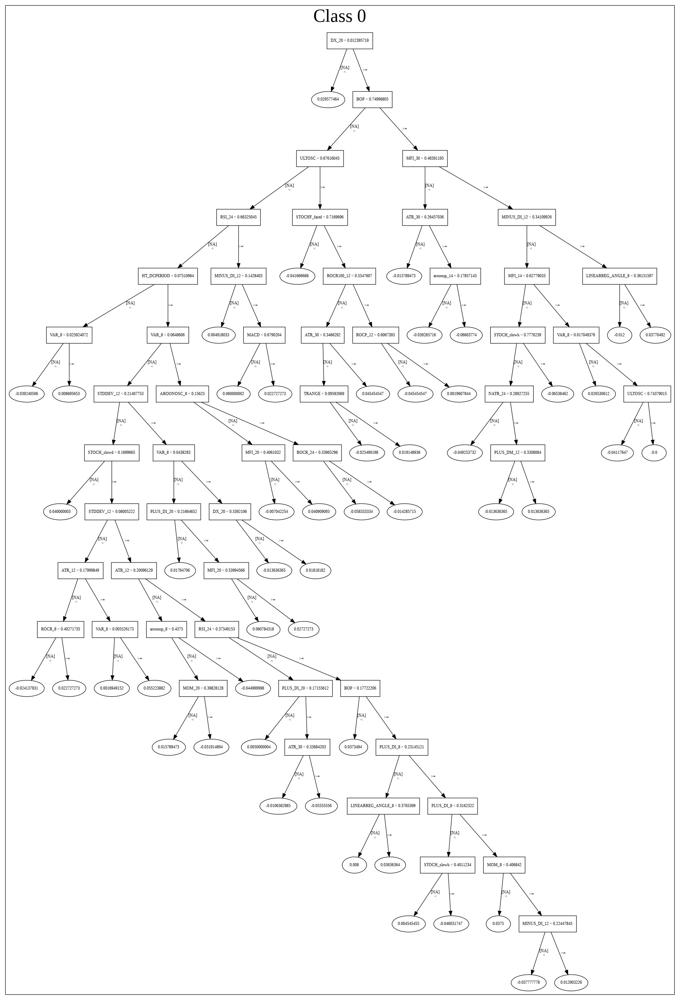

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_181451_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_181451_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_98_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLEVENINGSTAR',
 'TRANGE',
 'CDLCLOSINGMARUBOZU',
 'aroondown_20',
 'STOCHF_fastk',
 'CORREL_8',
 'aroonup_8',
 'CORREL_14',
 'ADXR_14',
 'CDLLONGLINE',
 'ADX_14',
 'BETA_12',
 'HT_PHASOR_quadrature',
 'HT_DCPERIOD',
 'DX_30',
 'HT_PHASOR_inphase',
 'DX_20',
 'BETA_14',
 'WILLR_8',
 'CDLLADDERBOTTOM',
 'ADX_20',
 'ULTOSC',
 'aroondown_30',
 'BETA_8',
 'MACDFIX_signal_14',
 'aroonup_30',
 'DX_24',
 'CDLHIKKAKE',
 'AROONOSC_24',
 'MACDFIX_signal_24',
 'ATR_8',
 'DX_12',
 'AROONOSC_14',
 'aroonup_14',
 'ATR_12',
 'STOCH_slowk',
 'CORREL_12',
 'CDLLONGLEGGEDDOJI',
 'STOCH_slowd',
 'CDLENGULFING',
 'MINUS_DM_14',
 'aroonup_24',
 'MINUS_DI_8',
 'HT_TRENDMODE',
 'MINUS_DI_24',
 'aroondown_8',
 'ADXR_8',
 'DX_14',
 'PLUS_DM_14',
 'CDLTHRUSTING',
 'CDLPIERCING',
 'MINUS_DI_14',
 'CCI_14',
 'AROONOSC_20',
 'STDDEV_8',
 'MACDFIX_signal_20',
 'AROONOSC_12',
 'CCI_12',
 'CDLINVERTEDHAMMER',
 'PLUS_DI_24',
 'STOCHF_fastd',
 'CDLHANGINGMAN',
 'APO',
 'CDLSHORTLINE',
 'MOM_14',
 'CDLBELTHOL

In [52]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_183026_model_1,0.628307,0.676646,0.461243,0.490896,0.240979


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.269713,1.000000,0.053847
1,TRANGE,0.190883,0.707727,0.038109
2,CDLCLOSINGMARUBOZU,0.188344,0.698313,0.037602
3,STOCHF_fastk,0.135464,0.502254,0.027045
4,MINUS_DI_8,0.095252,0.353162,0.019017
5,CDLENGULFING,0.094019,0.348588,0.018770
6,CDLHAMMER,0.091537,0.339388,0.018275
7,BETA_14,0.076722,0.284457,0.015317
8,CDLDARKCLOUDCOVER,0.076439,0.283410,0.015261
9,CDLTAKURI,0.076248,0.282702,0.015223


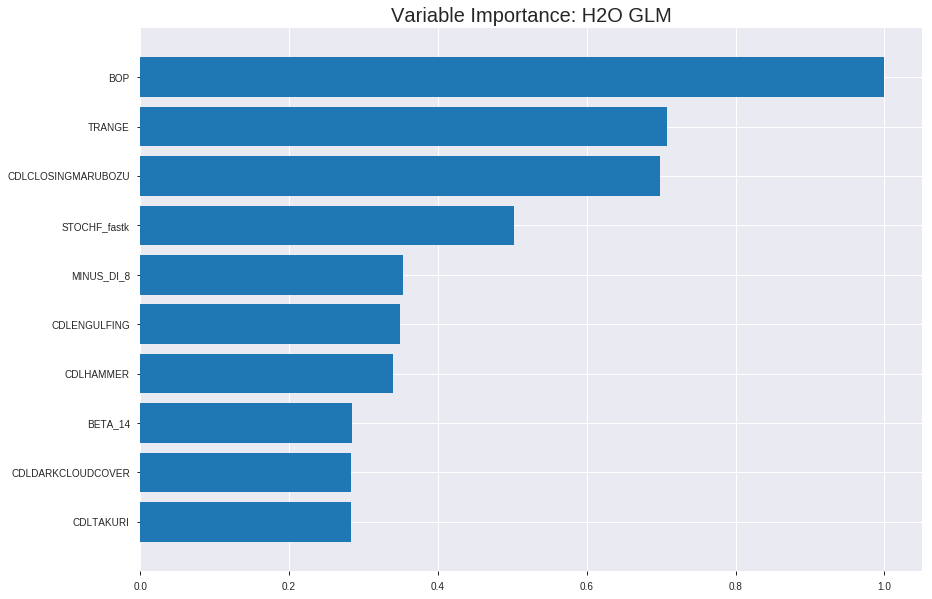

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_183026_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.21094342684164516
RMSE: 0.4592857790544414
LogLoss: 0.610075995674493
Null degrees of freedom: 1723
Residual degrees of freedom: 1418
Null deviance: 2387.7412993239195
Residual deviance: 2103.542033085652
AIC: 2715.542033085652
AUC: 0.7329247537000578
pr_auc: 0.7031527657763856
Gini: 0.46584950740011566
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36070500299221464: 


,0,1,Error,Rate
0,319.0,574.0,0.6428,(574.0/893.0)
1,67.0,764.0,0.0806,(67.0/831.0)
Total,386.0,1338.0,0.3718,(641.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3607050,0.7044721,284.0
max f2,0.1929815,0.8269848,368.0
max f0point5,0.4779521,0.6602093,205.0
max accuracy,0.4779521,0.6751740,205.0
max precision,0.8996644,1.0,0.0
max recall,0.1098533,1.0,394.0
max specificity,0.8996644,1.0,0.0
max absolute_mcc,0.4346177,0.3599185,235.0
max min_per_class_accuracy,0.4920149,0.6696529,194.0
max mean_per_class_accuracy,0.4504340,0.6765241,226.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 48.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.8304747,1.8440968,1.8440968,0.8888889,0.8489517,0.8888889,0.8489517,0.0192539,0.0192539,84.4096804,84.4096804
,2,0.0203016,0.7986724,2.0746089,1.9560598,1.0,0.8128039,0.9428571,0.8313942,0.0204573,0.0397112,107.4608905,95.6059825
,3,0.0301624,0.7804864,1.4644298,1.7953346,0.7058824,0.7877868,0.8653846,0.8171379,0.0144404,0.0541516,46.4429815,79.5334629
,4,0.0400232,0.7687898,1.8305373,1.8040077,0.8823529,0.7742474,0.8695652,0.8065707,0.0180505,0.0722022,83.0537269,80.4007743
,5,0.0504640,0.7514673,1.7288408,1.7884560,0.8333333,0.7603071,0.8620690,0.7969989,0.0180505,0.0902527,72.8840754,78.8455953
,6,0.1003480,0.6852603,1.6403884,1.7148501,0.7906977,0.7178987,0.8265896,0.7576774,0.0818291,0.1720818,64.0388436,71.4850135
,7,0.1502320,0.6434498,1.3750315,1.6020146,0.6627907,0.6619638,0.7722008,0.7258961,0.0685921,0.2406739,37.5031484,60.2014598
,8,0.2001160,0.6100376,1.3509081,1.5394199,0.6511628,0.6249151,0.7420290,0.7007240,0.0673887,0.3080626,35.0908124,53.9419941
,9,0.2998840,0.5662021,1.3026614,1.4606531,0.6279070,0.5874317,0.7040619,0.6630329,0.1299639,0.4380265,30.2661405,46.0653078
,10,0.4002320,0.5264866,1.2471637,1.4071260,0.6011561,0.5456505,0.6782609,0.6336023,0.1251504,0.5631769,24.7163735,40.7126040




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2207341522252583
RMSE: 0.46982353306880903
LogLoss: 0.6318347441656705
Null degrees of freedom: 491
Residual degrees of freedom: 186
Null deviance: 681.9739872837306
Residual deviance: 621.72538825902
AIC: 1233.7253882590198
AUC: 0.6965498999851217
pr_auc: 0.6476539556665782
Gini: 0.39309979997024347
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38137663884157785: 


,0,1,Error,Rate
0,93.0,158.0,0.6295,(158.0/251.0)
1,25.0,216.0,0.1037,(25.0/241.0)
Total,118.0,374.0,0.372,(183.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3813766,0.7024390,295.0
max f2,0.2876559,0.8351178,350.0
max f0point5,0.4249653,0.6390495,261.0
max accuracy,0.4249653,0.6504065,261.0
max precision,0.6442731,0.7846154,58.0
max recall,0.1235959,1.0,395.0
max specificity,0.8695697,0.9960159,0.0
max absolute_mcc,0.4249653,0.3269032,261.0
max min_per_class_accuracy,0.4890500,0.6307054,195.0
max mean_per_class_accuracy,0.4249653,0.6538989,261.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 48.11 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.8247674,0.8165975,0.8165975,0.4,0.8508371,0.4,0.8508371,0.0082988,0.0082988,-18.3402490,-18.3402490
,2,0.0203252,0.8112996,1.2248963,1.0207469,0.6,0.8160903,0.5,0.8334637,0.0124481,0.0207469,22.4896266,2.0746888
,3,0.0304878,0.7910047,2.0414938,1.3609959,1.0,0.8056060,0.6666667,0.8241778,0.0207469,0.0414938,104.1493776,36.0995851
,4,0.0406504,0.7686162,1.6331950,1.4290456,0.8,0.7791185,0.7,0.8129130,0.0165975,0.0580913,63.3195021,42.9045643
,5,0.0508130,0.7384623,0.8165975,1.3065560,0.4,0.7514300,0.64,0.8006164,0.0082988,0.0663900,-18.3402490,30.6556017
,6,0.1016260,0.6853393,1.7148548,1.5107054,0.84,0.7183420,0.74,0.7594792,0.0871369,0.1535270,71.4854772,51.0705394
,7,0.1504065,0.6295407,1.7012448,1.5725020,0.8333333,0.6512296,0.7702703,0.7243712,0.0829876,0.2365145,70.1244813,57.2501963
,8,0.2012195,0.5922763,1.2248963,1.4847227,0.6,0.6106840,0.7272727,0.6956623,0.0622407,0.2987552,22.4896266,48.4722746
,9,0.3008130,0.5568921,1.1665679,1.3793877,0.5714286,0.5742477,0.6756757,0.6554643,0.1161826,0.4149378,16.6567872,37.9387686
,10,0.4004065,0.5224097,1.2498941,1.3471786,0.6122449,0.5400159,0.6598985,0.6267487,0.1244813,0.5394191,24.9894149,34.7178634



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 18:30:26,0.000 sec,2,.15E2,302,1.3717032,1.3715483
,2019-08-24 18:30:26,0.214 sec,4,.11E2,302,1.3677088,1.3673129
,2019-08-24 18:30:27,0.415 sec,6,.79E1,306,1.3626493,1.3620591
,2019-08-24 18:30:27,0.624 sec,8,.58E1,306,1.3563312,1.3556245
,2019-08-24 18:30:27,0.825 sec,10,.42E1,306,1.3486317,1.3479900
---,---,---,---,---,---,---,---
,2019-08-24 18:30:30,3.627 sec,36,.68E-1,306,1.2129541,1.2640382
,2019-08-24 18:30:30,3.839 sec,38,.49E-1,306,1.2063134,1.2654609
,2019-08-24 18:30:30,4.050 sec,40,.36E-1,306,1.2002688,1.2676335
,2019-08-24 18:30:30,4.261 sec,42,.26E-1,306,1.1946951,1.2708289



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6153846153846154)

('F1', 0.715846994535519)

('auc', 0.6283068783068783)

('logloss', 0.6766460349790959)

('mean_per_class_error', 0.38075396825396823)

('rmse', 0.49089588177978755)

('mse', 0.24097876674835517)

glm prediction progress: |████████████████████████████████████████████████| 100%


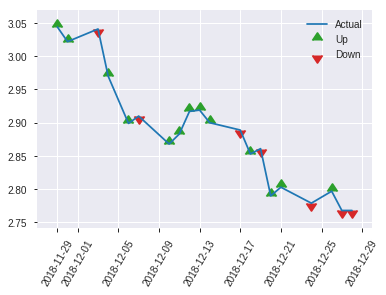


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.24097876674835517
RMSE: 0.49089588177978755
LogLoss: 0.6766460349790959
Null degrees of freedom: 246
Residual degrees of freedom: -59
Null deviance: 344.38937217717034
Residual deviance: 334.2631412796734
AIC: 946.2631412796734
AUC: 0.6283068783068783
pr_auc: 0.6445464318162015
Gini: 0.2566137566137565
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.21950725394686177: 


,0,1,Error,Rate
0,12.0,100.0,0.8929,(100.0/112.0)
1,4.0,131.0,0.0296,(4.0/135.0)
Total,16.0,231.0,0.4211,(104.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2195073,0.7158470,230.0
max f2,0.1261266,0.8609694,243.0
max f0point5,0.4935586,0.6510851,115.0
max accuracy,0.4935586,0.6153846,115.0
max precision,0.6668994,0.7878788,32.0
max recall,0.1261266,1.0,243.0
max specificity,0.8204423,0.9910714,0.0
max absolute_mcc,0.4935586,0.2378949,115.0
max min_per_class_accuracy,0.4861920,0.5851852,122.0
max mean_per_class_accuracy,0.4935586,0.6192460,115.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 48.03 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7880432,1.2197531,1.2197531,0.6666667,0.8089812,0.6666667,0.8089812,0.0148148,0.0148148,21.9753086,21.9753086
,2,0.0202429,0.7801229,0.9148148,1.0977778,0.5,0.7817966,0.6,0.7981074,0.0074074,0.0222222,-8.5185185,9.7777778
,3,0.0323887,0.7529086,0.6098765,0.9148148,0.3333333,0.7708796,0.5,0.7878970,0.0074074,0.0296296,-39.0123457,-8.5185185
,4,0.0404858,0.7363667,1.8296296,1.0977778,1.0,0.7422707,0.6,0.7787717,0.0148148,0.0444444,82.9629630,9.7777778
,5,0.0526316,0.7325050,1.8296296,1.2666667,1.0,0.7345666,0.6923077,0.7685705,0.0222222,0.0666667,82.9629630,26.6666667
,6,0.1012146,0.6828951,1.3722222,1.3173333,0.75,0.7096090,0.72,0.7402690,0.0666667,0.1333333,37.2222222,31.7333333
,7,0.1497976,0.6402368,1.6771605,1.4340340,0.9166667,0.6682413,0.7837838,0.7169086,0.0814815,0.2148148,67.7160494,43.4034034
,8,0.2024291,0.6076449,0.7037037,1.2441481,0.3846154,0.6204224,0.68,0.6918222,0.0370370,0.2518519,-29.6296296,24.4148148
,9,0.2995951,0.5523029,1.3722222,1.2856857,0.75,0.5810348,0.7027027,0.6558912,0.1333333,0.3851852,37.2222222,28.5685686
,10,0.4008097,0.5154699,0.9514074,1.2012720,0.52,0.5334479,0.6565657,0.6249711,0.0962963,0.4814815,-4.8592593,20.1271979


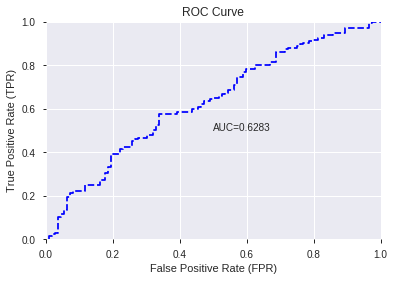

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


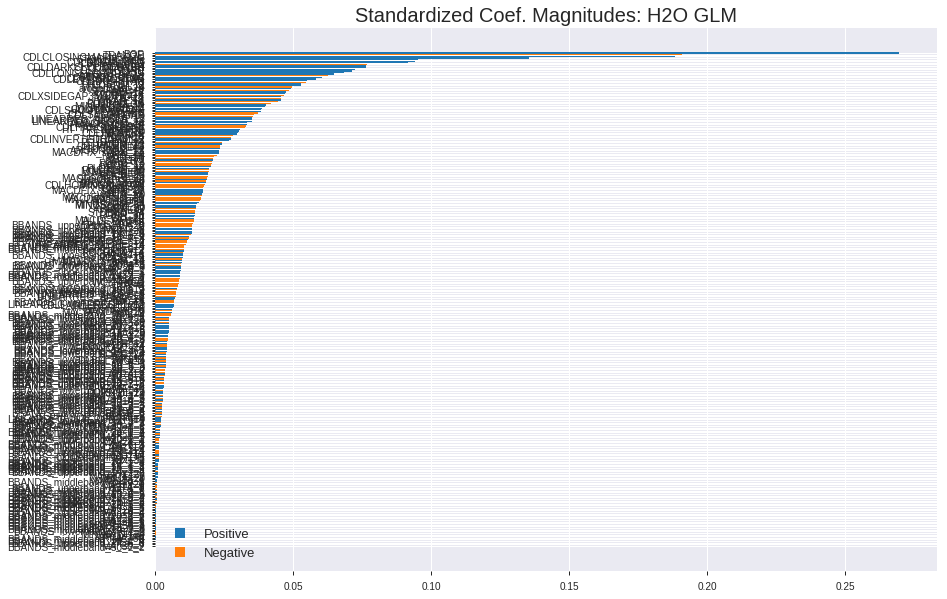

'log_likelihood'
--2019-08-24 18:30:39--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.106.19
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.106.19|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


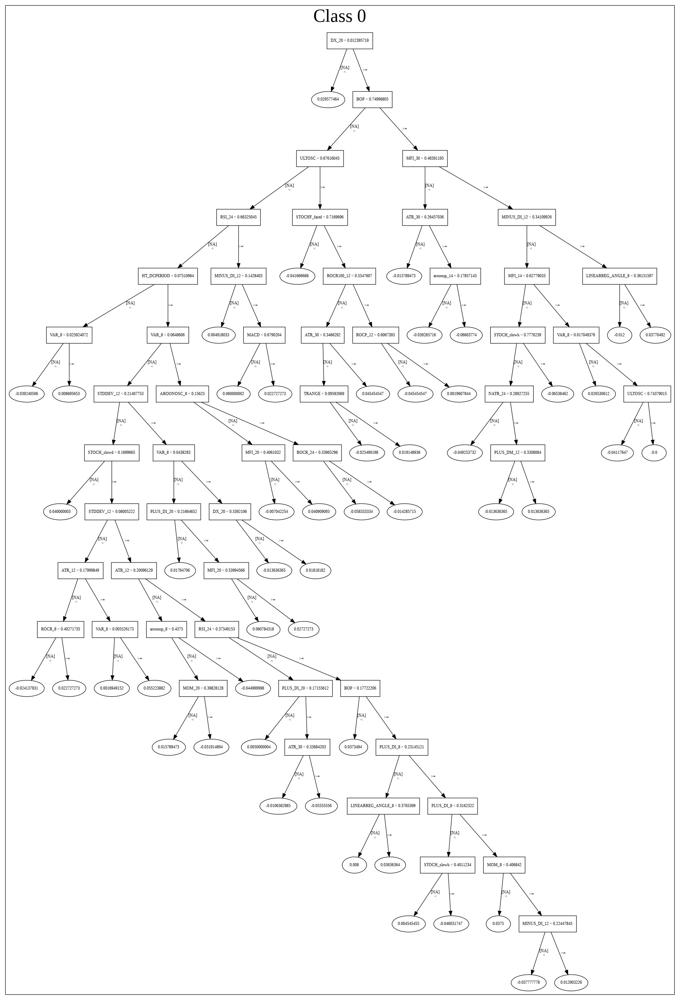

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_183026_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_183026_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_106_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_106

['BOP',
 'TRANGE',
 'CDLCLOSINGMARUBOZU',
 'STOCHF_fastk',
 'MINUS_DI_8',
 'CDLENGULFING',
 'CDLHAMMER',
 'BETA_14',
 'CDLDARKCLOUDCOVER',
 'CDLTAKURI',
 'CDLLONGLINE',
 'ULTOSC',
 'CDLLONGLEGGEDDOJI',
 'MINUS_DI_12',
 'STOCH_slowd',
 'CDLTHRUSTING',
 'CDLEVENINGSTAR',
 'CDLDOJISTAR',
 'PLUS_DI_12',
 'CORREL_8',
 'MINUS_DI_14',
 'aroondown_20',
 'VAR_8',
 'CCI_12',
 'aroonup_14',
 'STDDEV_8',
 'CDLXSIDEGAP3METHODS',
 'WILLR_12',
 'VAR_12',
 'WILLR_14',
 'PLUS_DI_14',
 'CDLINNECK',
 'MINUS_DM_12',
 'CORREL_14',
 'CDLHIGHWAVE',
 'CDLSHOOTINGSTAR',
 'MOM_8',
 'CDLSHORTLINE',
 'CDLTASUKIGAP',
 'BETA_12',
 'LINEARREG_ANGLE_12',
 'LINEARREG_SLOPE_12',
 'AROONOSC_20',
 'MINUS_DM_14',
 'WILLR_8',
 'CDLHANGINGMAN',
 'HT_TRENDMODE',
 'NATR_30',
 'MOM_14',
 'CDLHIKKAKE',
 'ADXR_8',
 'CCI_14',
 'STDDEV_12',
 'CDLINVERTEDHAMMER',
 'PLUS_DM_24',
 'MOM_12',
 'WILLR_20',
 'CDLPIERCING',
 'PLUS_DM_12',
 'AROONOSC_12',
 'ADX_12',
 'MACDFIX_signal_24',
 'NATR_24',
 'VAR_14',
 'CCI_30',
 'PPO',
 'SAR_0.2'

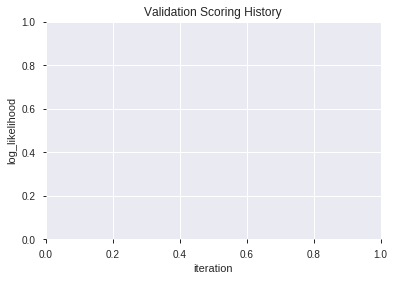

In [53]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_3_AutoML_20190824_183045,0.627315,0.660550,0.449372,0.484528,0.234767
1,XGBoost_2_AutoML_20190824_183045,0.626455,0.672882,0.430655,0.489718,0.239823
2,XGBoost_grid_1_AutoML_20190824_183045_model_4,0.619974,0.669449,0.435218,0.488345,0.238481
3,XGBoost_grid_1_AutoML_20190824_183045_model_1,0.611111,0.678710,0.457540,0.492814,0.242866
4,XGBoost_1_AutoML_20190824_183045,0.610450,0.685682,0.432937,0.496150,0.246165
5,XGBoost_grid_1_AutoML_20190824_183045_model_3,0.608862,0.673746,0.452315,0.490846,0.240930
6,XGBoost_grid_1_AutoML_20190824_183045_model_2,0.603505,0.677023,0.447090,0.492229,0.242290
7,XGBoost_grid_1_AutoML_20190824_183045_model_6,0.596693,0.688847,0.433598,0.497147,0.247155
8,XGBoost_grid_1_AutoML_20190824_183045_model_5,0.596495,0.693856,0.438161,0.497936,0.247940
9,XGBoost_grid_1_AutoML_20190824_183045_model_7,0.591468,0.699250,0.432937,0.501644,0.251647


,variable,relative_importance,scaled_importance,percentage
0,BOP,1108.393921,1.000000,0.171482
1,TRANGE,395.993256,0.357268,0.061265
2,CDLCLOSINGMARUBOZU,337.256042,0.304275,0.052178
3,MINUS_DI_8,158.630554,0.143117,0.024542
4,STOCHF_fastk,147.677963,0.133236,0.022848
5,ULTOSC,132.126831,0.119206,0.020442
6,BETA_20,106.173439,0.095790,0.016426
7,CDLLONGLINE,105.759552,0.095417,0.016362
8,ADXR_14,96.196808,0.086789,0.014883
9,STOCH_slowk,95.291054,0.085972,0.014743


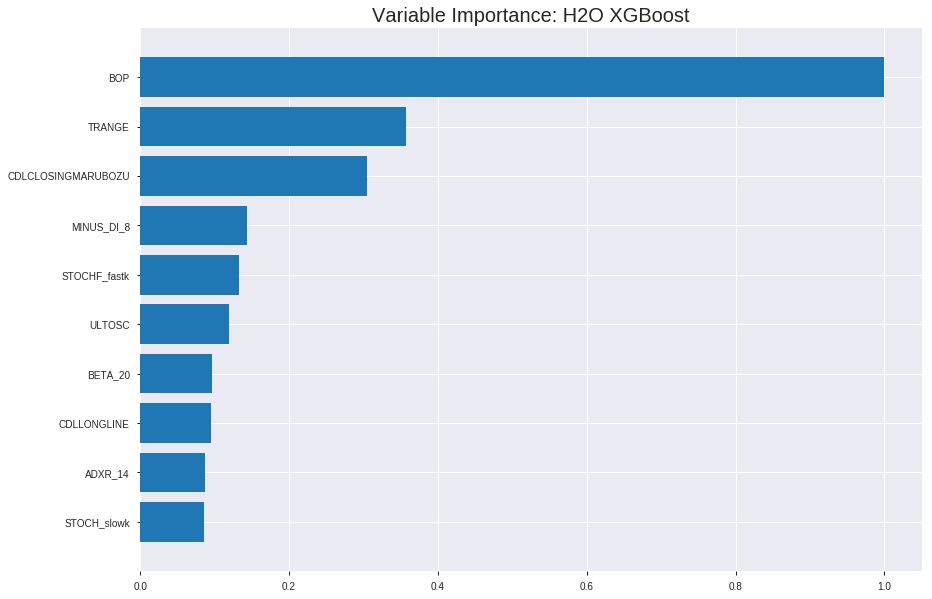

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_3_AutoML_20190824_183045


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16168347016719428
RMSE: 0.4020988313427363
LogLoss: 0.5042943890369759
Mean Per-Class Error: 0.1638098433733154
AUC: 0.9114674504064909
pr_auc: 0.9162828988661686
Gini: 0.8229349008129818
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5103004149028233: 


,0,1,Error,Rate
0,758.0,135.0,0.1512,(135.0/893.0)
1,148.0,683.0,0.1781,(148.0/831.0)
Total,906.0,818.0,0.1642,(283.0/1724.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5103004,0.8283808,183.0
max f2,0.3655134,0.8767361,277.0
max f0point5,0.5471111,0.8611676,154.0
max accuracy,0.5130018,0.8370070,181.0
max precision,0.8536323,1.0,0.0
max recall,0.2310532,1.0,351.0
max specificity,0.8536323,1.0,0.0
max absolute_mcc,0.5130018,0.6735791,181.0
max min_per_class_accuracy,0.5063072,0.8303249,186.0
max mean_per_class_accuracy,0.5130018,0.8361902,181.0


Gains/Lift Table: Avg response rate: 48.20 %, avg score: 48.26 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0104408,0.8084028,2.0746089,2.0746089,1.0,0.8268425,1.0,0.8268425,0.0216606,0.0216606,107.4608905,107.4608905
,2,0.0203016,0.7820317,2.0746089,2.0746089,1.0,0.7955584,1.0,0.8116474,0.0204573,0.0421179,107.4608905,107.4608905
,3,0.0301624,0.7715558,2.0746089,2.0746089,1.0,0.7766708,1.0,0.8002127,0.0204573,0.0625752,107.4608905,107.4608905
,4,0.0400232,0.7573920,2.0746089,2.0746089,1.0,0.7646497,1.0,0.7914508,0.0204573,0.0830325,107.4608905,107.4608905
,5,0.0504640,0.7454312,2.0746089,2.0746089,1.0,0.7510598,1.0,0.7830940,0.0216606,0.1046931,107.4608905,107.4608905
,6,0.1003480,0.6979566,2.0746089,2.0746089,1.0,0.7200062,1.0,0.7517325,0.1034898,0.2081829,107.4608905,107.4608905
,7,0.1502320,0.6592813,2.0746089,2.0746089,1.0,0.6770758,1.0,0.7269430,0.1034898,0.3116727,107.4608905,107.4608905
,8,0.2001160,0.6324693,1.9781155,2.0505555,0.9534884,0.6473365,0.9884058,0.7070990,0.0986763,0.4103490,97.8115467,105.0555468
,9,0.2998840,0.5876232,1.7971903,1.9662638,0.8662791,0.6099770,0.9477756,0.6747876,0.1793020,0.5896510,79.7190272,96.6263759
,10,0.4002320,0.5378465,1.4989949,1.8491079,0.7225434,0.5621347,0.8913043,0.6465428,0.1504212,0.7400722,49.8994874,84.9107937




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.22848093038900516
RMSE: 0.47799678909905363
LogLoss: 0.6486555599153974
Mean Per-Class Error: 0.36601312591955826
AUC: 0.6666942189747236
pr_auc: 0.6099329215300504
Gini: 0.33338843794944717
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36589059233665466: 


,0,1,Error,Rate
0,73.0,178.0,0.7092,(178.0/251.0)
1,19.0,222.0,0.0788,(19.0/241.0)
Total,92.0,400.0,0.4004,(197.0/492.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3658906,0.6926677,313.0
max f2,0.2288372,0.8339124,382.0
max f0point5,0.4858116,0.6245539,225.0
max accuracy,0.4990106,0.6321138,208.0
max precision,0.7613522,0.7333333,14.0
max recall,0.1972412,1.0,391.0
max specificity,0.8322254,0.9960159,0.0
max absolute_mcc,0.4401526,0.2820893,259.0
max min_per_class_accuracy,0.5141007,0.6141079,192.0
max mean_per_class_accuracy,0.4858116,0.6339869,225.0


Gains/Lift Table: Avg response rate: 48.98 %, avg score: 49.94 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101626,0.8067886,1.2248963,1.2248963,0.6,0.8215561,0.6,0.8215561,0.0124481,0.0124481,22.4896266,22.4896266
,2,0.0203252,0.7857651,1.2248963,1.2248963,0.6,0.7973913,0.6,0.8094737,0.0124481,0.0248963,22.4896266,22.4896266
,3,0.0304878,0.7608527,2.0414938,1.4970954,1.0,0.7760171,0.7333333,0.7983215,0.0207469,0.0456432,104.1493776,49.7095436
,4,0.0406504,0.7542903,0.8165975,1.3269710,0.4,0.7568811,0.65,0.7879614,0.0082988,0.0539419,-18.3402490,32.6970954
,5,0.0508130,0.7464378,1.2248963,1.3065560,0.6,0.7511685,0.64,0.7806028,0.0124481,0.0663900,22.4896266,30.6556017
,6,0.1016260,0.6845668,1.4698755,1.3882158,0.72,0.7103456,0.68,0.7454742,0.0746888,0.1410788,46.9875519,38.8215768
,7,0.1504065,0.6490041,1.1908714,1.3242122,0.5833333,0.6654627,0.6486486,0.7195245,0.0580913,0.1991701,19.0871369,32.4212179
,8,0.2012195,0.6164226,1.1432365,1.2785113,0.56,0.6332028,0.6262626,0.6977261,0.0580913,0.2572614,14.3236515,27.8511254
,9,0.3008130,0.5800917,1.3332204,1.2966244,0.6530612,0.5958126,0.6351351,0.6639845,0.1327801,0.3900415,33.3220425,29.6624425
,10,0.4004065,0.5471670,1.2915573,1.2953641,0.6326531,0.5644144,0.6345178,0.6392183,0.1286307,0.5186722,29.1557287,29.5364071



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 18:30:51,0.005 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5179814,0.5,0.6931472,0.5,0.0,1.0,0.5101626
,2019-08-24 18:30:51,0.196 sec,5.0,0.4823757,0.6583620,0.8004037,0.7835959,2.0746089,0.3178654,0.4924150,0.6780292,0.6410210,0.5952757,1.6331950,0.3963415
,2019-08-24 18:30:51,0.278 sec,10.0,0.4679976,0.6303394,0.8290515,0.8186086,2.0746089,0.2656613,0.4868953,0.6670222,0.6657933,0.6095899,1.6331950,0.4065041
,2019-08-24 18:30:51,0.361 sec,15.0,0.4550805,0.6053778,0.8478910,0.8422187,2.0746089,0.2349188,0.4831222,0.6594299,0.6696368,0.6121623,1.2248963,0.4166667
,2019-08-24 18:30:51,0.448 sec,20.0,0.4436412,0.5832004,0.8579216,0.8560227,2.0746089,0.2163573,0.4806509,0.6544643,0.6698187,0.6113058,1.2248963,0.4126016
,2019-08-24 18:30:51,0.528 sec,25.0,0.4350743,0.5667693,0.8698360,0.8711642,2.0746089,0.2279582,0.4789071,0.6508421,0.6718437,0.6153142,1.2248963,0.4146341
,2019-08-24 18:30:51,0.608 sec,30.0,0.4274653,0.5520542,0.8793497,0.8822623,2.0746089,0.2198376,0.4779767,0.6488072,0.6722488,0.6138188,1.2248963,0.4146341
,2019-08-24 18:30:52,0.693 sec,35.0,0.4214986,0.5405669,0.8848161,0.8879016,2.0746089,0.2186775,0.4778629,0.6486608,0.6713478,0.6109544,0.8165975,0.4105691
,2019-08-24 18:30:52,0.774 sec,40.0,0.4152342,0.5285473,0.8924352,0.8960934,2.0746089,0.2053364,0.4774616,0.6476966,0.6689921,0.6051631,0.8165975,0.4186992
,2019-08-24 18:30:52,0.857 sec,45.0,0.4082057,0.5155096,0.9019988,0.9072764,2.0746089,0.1844548,0.4776998,0.6479819,0.6675043,0.6092511,1.2248963,0.3983740


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1108.3939209,1.0,0.1714824
TRANGE,395.9932556,0.3572676,0.0612651
CDLCLOSINGMARUBOZU,337.2560425,0.3042745,0.0521777
MINUS_DI_8,158.6305542,0.1431175,0.0245421
STOCHF_fastk,147.6779633,0.1332360,0.0228476
---,---,---,---
BBANDS_upperband_20_0_4,2.2593265,0.0020384,0.0003495
MA_14_3,2.0740528,0.0018712,0.0003209
BBANDS_lowerband_20_2_5,1.8856425,0.0017012,0.0002917
VAR_14,1.3859959,0.0012505,0.0002144



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.631578947368421)

('F1', 0.7247956403269755)

('auc', 0.6273148148148148)

('logloss', 0.6605499900384667)

('mean_per_class_error', 0.3917989417989418)

('rmse', 0.4845275999500363)

('mse', 0.2347669951133424)

xgboost prediction progress: |████████████████████████████████████████████| 100%


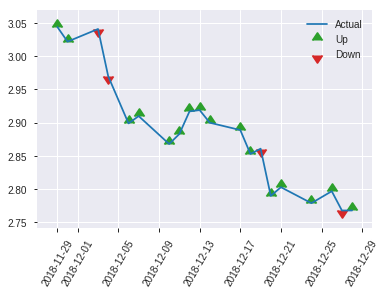


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2347669951133424
RMSE: 0.4845275999500363
LogLoss: 0.6605499900384667
Mean Per-Class Error: 0.3917989417989418
AUC: 0.6273148148148148
pr_auc: 0.652782182161927
Gini: 0.25462962962962954
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.27448219060897827: 


,0,1,Error,Rate
0,13.0,99.0,0.8839,(99.0/112.0)
1,2.0,133.0,0.0148,(2.0/135.0)
Total,15.0,232.0,0.4089,(101.0/247.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2744822,0.7247956,231.0
max f2,0.2350528,0.8664955,238.0
max f0point5,0.4044118,0.6538895,187.0
max accuracy,0.4044118,0.6315789,187.0
max precision,0.8351290,1.0,0.0
max recall,0.2350528,1.0,238.0
max specificity,0.8351290,1.0,0.0
max absolute_mcc,0.4044118,0.2526577,187.0
max min_per_class_accuracy,0.5200868,0.5892857,125.0
max mean_per_class_accuracy,0.4044118,0.6082011,187.0


Gains/Lift Table: Avg response rate: 54.66 %, avg score: 50.62 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0121457,0.7930051,1.8296296,1.8296296,1.0,0.8151172,1.0,0.8151172,0.0222222,0.0222222,82.9629630,82.9629630
,2,0.0202429,0.7737969,1.8296296,1.8296296,1.0,0.7831683,1.0,0.8023376,0.0148148,0.0370370,82.9629630,82.9629630
,3,0.0323887,0.7554596,0.6098765,1.3722222,0.3333333,0.7625697,0.75,0.7874247,0.0074074,0.0444444,-39.0123457,37.2222222
,4,0.0404858,0.7499802,1.8296296,1.4637037,1.0,0.7529749,0.8,0.7805347,0.0148148,0.0592593,82.9629630,46.3703704
,5,0.0526316,0.7247490,1.8296296,1.5481481,1.0,0.7409758,0.8461538,0.7714057,0.0222222,0.0814815,82.9629630,54.8148148
,6,0.1012146,0.6798937,1.0672840,1.3173333,0.5833333,0.6989783,0.72,0.7366406,0.0518519,0.1333333,6.7283951,31.7333333
,7,0.1497976,0.6417408,1.2197531,1.2856857,0.6666667,0.6566742,0.7027027,0.7107055,0.0592593,0.1925926,21.9753086,28.5685686
,8,0.2024291,0.6214725,1.1259259,1.2441481,0.6153846,0.6286978,0.68,0.6893835,0.0592593,0.2518519,12.5925926,24.4148148
,9,0.2995951,0.5761994,0.9910494,1.1620621,0.5416667,0.5951510,0.6351351,0.6588216,0.0962963,0.3481481,-0.8950617,16.2062062
,10,0.4008097,0.5502638,1.0977778,1.1458287,0.6,0.5650720,0.6262626,0.6351475,0.1111111,0.4592593,9.7777778,14.5828657


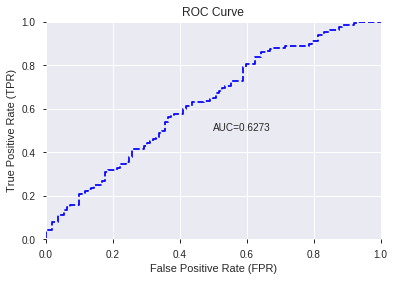

This function is available for GLM models only


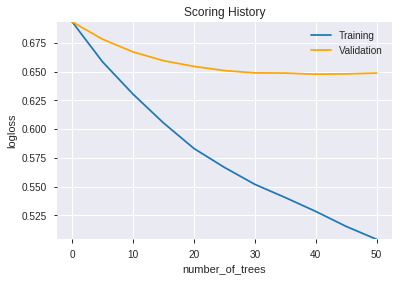

--2019-08-24 18:31:09--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.96.11
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.96.11|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.

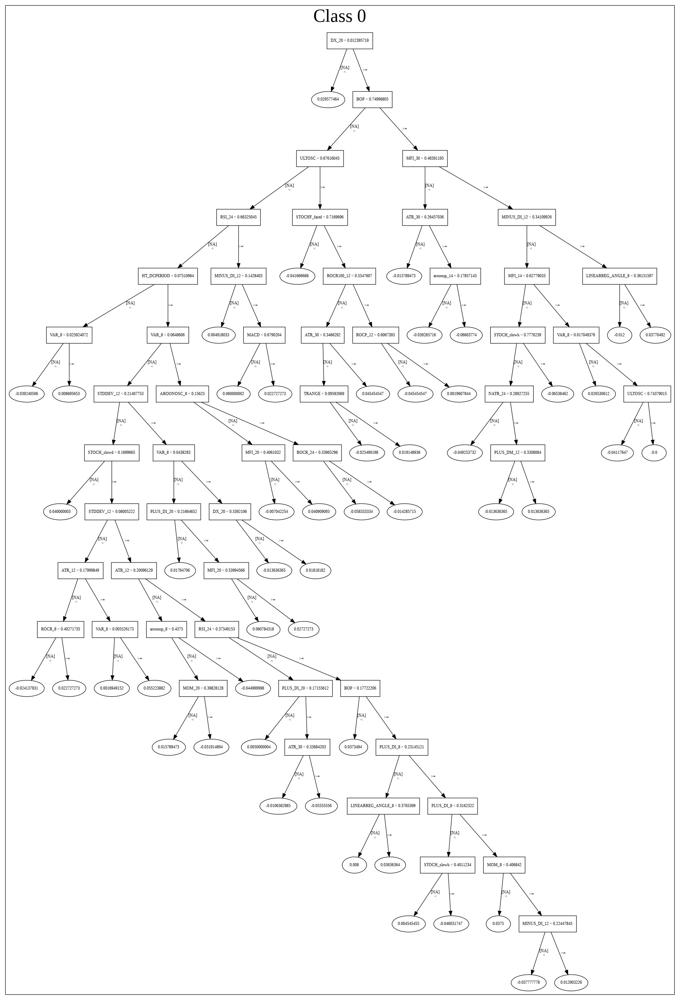

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_3_AutoML_20190824_183045',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_3_AutoML_20190824_183045',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_114_sid_8acf',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_114_sid_8acf',
   'ty

['BOP',
 'TRANGE',
 'CDLCLOSINGMARUBOZU',
 'MINUS_DI_8',
 'STOCHF_fastk',
 'ULTOSC',
 'BETA_20',
 'CDLLONGLINE',
 'ADXR_14',
 'STOCH_slowk',
 'LINEARREG_ANGLE_8',
 'DX_24',
 'MINUS_DI_12',
 'STDDEV_8',
 'DX_30',
 'HT_PHASOR_quadrature',
 'MACDEXT_hist',
 'PLUS_DI_12',
 'CCI_12',
 'HT_PHASOR_inphase',
 'STOCH_slowd',
 'CORREL_8',
 'STDDEV_14',
 'WILLR_20',
 'WILLR_8',
 'NATR_30',
 'MINUS_DM_12',
 'CDLSHORTLINE',
 'MACDFIX_hist_8',
 'BETA_12',
 'LINEARREG_SLOPE_8',
 'ADX_14',
 'ADXR_8',
 'WILLR_24',
 'CCI_30',
 'MA_20_1',
 'CORREL_12',
 'MINUS_DI_24',
 'DX_14',
 'AROONOSC_24',
 'DX_20',
 'ATR_14',
 'STDDEV_12',
 'BETA_8',
 'CCI_14',
 'MINUS_DI_14',
 'ADX_12',
 'MACDFIX_signal_14',
 'aroonup_30',
 'BETA_14',
 'ROC_14',
 'ROCP_20',
 'MINUS_DI_20',
 'MINUS_DM_30',
 'LINEARREG_ANGLE_12',
 'MOM_20',
 'ROCR_24',
 'CORREL_14',
 'HT_DCPERIOD',
 'RSI_8',
 'AROONOSC_8',
 'MINUS_DM_14',
 'PLUS_DI_20',
 'ADX_20',
 'MACDFIX_hist_24',
 'ATR_12',
 'PPO',
 'MINUS_DI_30',
 'MACDFIX_signal_24',
 'CDLHAMME

In [54]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [55]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


DeepLearning    0.648
GLM             0.644
XGBoost         0.640
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.648,0.636,0.636
DLF,0.632,0.623,0.640
Fwe,0.644,0.644,0.628
RFE,0.628,0.615,0.632
XGBF,0.619,0.623,0.640






F1


DeepLearning    0.744
GLM             0.735
XGBoost         0.735
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.735,0.729,0.721
DLF,0.730,0.722,0.735
Fwe,0.744,0.735,0.730
RFE,0.718,0.716,0.725
XGBF,0.713,0.722,0.735






auc


DeepLearning    0.665
GLM             0.664
XGBoost         0.643
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.661,0.640,0.643
DLF,0.641,0.625,0.623
Fwe,0.665,0.664,0.640
RFE,0.621,0.628,0.627
XGBF,0.618,0.625,0.623






logloss


DeepLearning    0.779
GLM             0.677
XGBoost         0.662
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.779,0.670,0.659
DLF,0.652,0.677,0.662
Fwe,0.673,0.646,0.653
RFE,0.748,0.677,0.661
XGBF,0.667,0.677,0.662






mean_per_class_error


DeepLearning    0.395
GLM             0.391
XGBoost         0.397
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.356,0.387,0.380
DLF,0.390,0.391,0.388
Fwe,0.362,0.356,0.397
RFE,0.386,0.381,0.392
XGBF,0.395,0.391,0.388






rmse


DeepLearning    0.533
GLM             0.491
XGBoost         0.485
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.533,0.488,0.483
DLF,0.480,0.490,0.485
Fwe,0.488,0.477,0.481
RFE,0.519,0.491,0.485
XGBF,0.487,0.490,0.485






mse


DeepLearning    0.284
GLM             0.241
XGBoost         0.235
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.284,0.239,0.234
DLF,0.230,0.240,0.235
Fwe,0.238,0.228,0.231
RFE,0.269,0.241,0.235
XGBF,0.237,0.240,0.235


{'F1':       DeepLearning    GLM  XGBoost
 All          0.735    NaN      NaN
 DLF          0.730    NaN      NaN
 DLF            NaN  0.722      NaN
 DLF            NaN    NaN    0.735
 All            NaN  0.729      NaN
 All            NaN    NaN    0.721
 XGBF         0.713    NaN      NaN
 XGBF           NaN  0.722      NaN
 XGBF           NaN    NaN    0.735
 Fwe          0.744    NaN      NaN
 Fwe            NaN  0.735      NaN
 Fwe            NaN    NaN    0.730
 RFE          0.718    NaN      NaN
 RFE            NaN  0.716      NaN
 RFE            NaN    NaN    0.725,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.648    NaN      NaN
 DLF          0.632    NaN      NaN
 DLF            NaN  0.623      NaN
 DLF            NaN    NaN    0.640
 All            NaN  0.636      NaN
 All            NaN    NaN    0.636
 XGBF         0.619    NaN      NaN
 XGBF           NaN  0.623      NaN
 XGBF           NaN    NaN    0.640
 Fwe          0.644    NaN      NaN
 Fwe     